In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from math import ceil
from sklearn.metrics import confusion_matrix
import seaborn as sns
from collections import Counter

# Loading the MNIST Dataset with Preprocessing
First we must load the dataset and prepare it for training.  
The dataset is transformed from an image to tensor, which automatically changes pixel values to be in range [0, 1] from [0, 255].  
It is then normalized by subtracting the mean and dividing by standard deviation.  
## Data Splitting
Since the MNIST dataset comes with 60000 training samples and 10000 test samples, we will take 10000 from the training samples as validation set.  
The final count of training, validation and test sets will be {50000, 10000, 10000}

In [2]:
# Define transformations for normalization
transform = transforms.Compose([
    transforms.ToTensor(),  # Convert PIL image to Tensor
    transforms.Normalize((0.1307,), (0.3081,))  # Normalize data using the mean and standard deviation of MNIST dataset
])

# Download the dataset
mnist_dataset = datasets.MNIST(root=r'Dataset', train=True, transform=transform,
                               download=False)

mnist_dataset_test = datasets.MNIST(root=r'Dataset', train=False, transform=transform,
                               download=False)
# Extract images and labels
X = mnist_dataset.data.numpy()  # Convert to NumPy array
y = mnist_dataset.targets.numpy()  # Convert to NumPy array
X_test = mnist_dataset_test.data.numpy()
y_test = mnist_dataset_test.targets.numpy()

# Split the training MNIST dataset into 50000 training and 10000 validation
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=1.0/6.0, stratify=y, random_state=42)

# Convert to Tensors and normalize pixel values to [0,1]
train_data = torch.tensor(X_train, dtype=torch.float32).unsqueeze(1) / 255  # Add channel dimension
train_labels = torch.tensor(y_train, dtype=torch.long)
val_data = torch.tensor(X_val, dtype=torch.float32).unsqueeze(1) / 255
val_labels = torch.tensor(y_val, dtype=torch.long)
test_data = torch.tensor(X_test, dtype=torch.float32).unsqueeze(1) / 255
test_labels = torch.tensor(y_test, dtype=torch.long)

# Create custom datasets
train_dataset = TensorDataset(train_data, train_labels)
val_dataset = TensorDataset(val_data, val_labels)
test_dataset = TensorDataset(test_data, test_labels)

# Neural Network
We will train a feed forward neural network that has variable number of hidden layers and number of neurons in network. The activation function between each layer will be ReLU (**Re**ctified **L**inear **U**nit). If the number of neurons is not divisible by number of layers, the last layer will have the remainder.

In [3]:
# Function to define the model based on the number of layers and neurons
class FeedForwardNN(nn.Module):
    def __init__(self, num_layers=2, total_number_of_neurons=128):
        super(FeedForwardNN, self).__init__()
        self.number_of_layers = num_layers
        self.total_number_of_neurons = total_number_of_neurons
        self.flatten = nn.Flatten()
        self.fc_layers = nn.ModuleList()
        neurons_per_layer = ceil(total_number_of_neurons / num_layers)
        self.fc_layers.append(nn.Linear(28 * 28, neurons_per_layer))  # First layer

        # Hidden layers
        remaining_neurons = total_number_of_neurons
        for _ in range(num_layers - 1):
            if remaining_neurons > neurons_per_layer:
                remaining_neurons -= neurons_per_layer
                self.fc_layers.append(nn.Linear(neurons_per_layer, neurons_per_layer))  
            else:
                self.fc_layers.append(nn.Linear(neurons_per_layer, remaining_neurons))

        self.fc_layers.append(nn.Linear(neurons_per_layer, 10))  # Output layer
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.flatten(x)
        for layer in self.fc_layers:
            x = self.relu(layer(x))
        return x

# Visualization
After the training of each model finishes, we will plot the graph of the losses and accuracies during the training and validation of the model against number of epochs. This will shows us the final performance of the model and its progress as it is training through the epochs.

In [4]:
def plot_performance(size: tuple[int, int], training_losses, validation_losses, training_accuracies, validation_accuracies):
    # Plot Training and Validation Loss
    epoch = [x for x in range(1, len(training_losses) + 1)]
    plt.figure(figsize=size)
    plt.plot(epoch, training_losses, label='Training Loss')
    plt.plot(epoch, validation_losses, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Plot Training and Validation Accuracy
    plt.figure(figsize=size)
    plt.plot(epoch, training_accuracies, label='Training Accuracy')
    plt.plot(epoch, validation_accuracies, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.grid(True)
    plt.show()

# Pipeline
To start training the model, we need to assign it a loss function to measure its performance and an optimizer to update weights.  
The loss function will be cross entropy loss and the optimizer will be stochastic gradient descent.  
The training loop then consists of:  
1. **Forward Propagation** - find the prediction then calculate the loss
2. **Backward Propagation** - Calculate the gradient of cost function with respect to weights
3. **Optimization** - Using the gradient, calculate new weights to enter the next iteration with    

4 different values for our 4 hyper parameters (batch size, learning rate, number of neurons, number of layers) will yield us 256 models of which we will choose the best performer in terms of accuracy of predicting the test set.
The number of epochs each model will train is going to be 5. Small number chosen due to limited time to train many models.

Training with batch size=32, learning rate=0.0001, layers=2, neurons=32
Model Number 1 Performance:
  Training Loss: 2.3015
  Validation Loss: 2.3011
  Training Accuracy: 9.92%
  Validation Accuracy: 9.88%


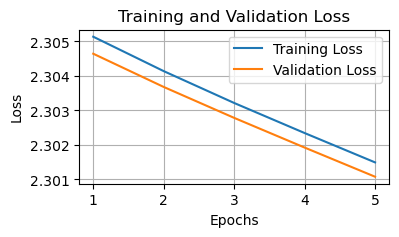

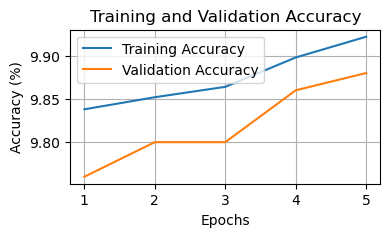

Test Accuracy: 9.87%

New Best Model!

Training with batch size=32, learning rate=0.0001, layers=2, neurons=64
Model Number 2 Performance:
  Training Loss: 2.3044
  Validation Loss: 2.3040
  Training Accuracy: 10.22%
  Validation Accuracy: 10.21%


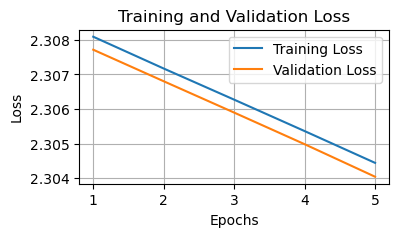

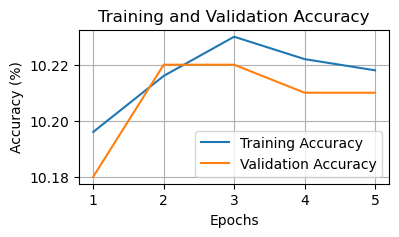

Test Accuracy: 10.10%

New Best Model!

Training with batch size=32, learning rate=0.0001, layers=2, neurons=128
Model Number 3 Performance:
  Training Loss: 2.2922
  Validation Loss: 2.2910
  Training Accuracy: 15.63%
  Validation Accuracy: 16.50%


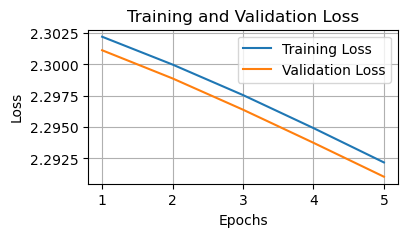

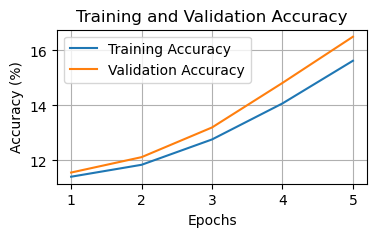

Test Accuracy: 16.78%

New Best Model!

Training with batch size=32, learning rate=0.0001, layers=2, neurons=256
Model Number 4 Performance:
  Training Loss: 2.2913
  Validation Loss: 2.2901
  Training Accuracy: 17.64%
  Validation Accuracy: 18.76%


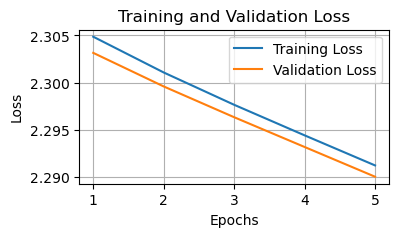

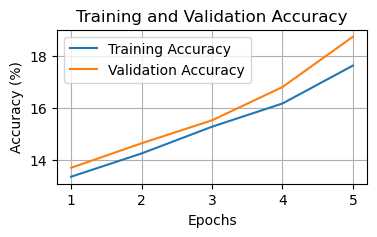

Test Accuracy: 19.11%

New Best Model!

Training with batch size=32, learning rate=0.0001, layers=3, neurons=32
Model Number 5 Performance:
  Training Loss: 2.3042
  Validation Loss: 2.3037
  Training Accuracy: 9.87%
  Validation Accuracy: 9.87%


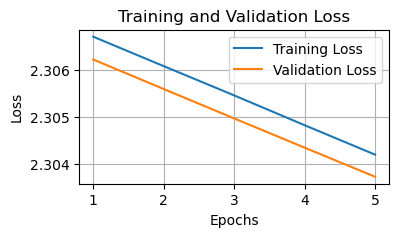

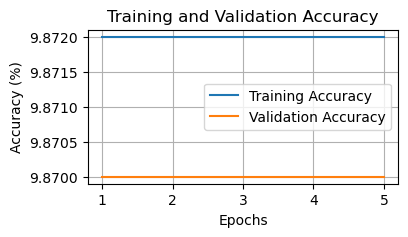

Test Accuracy: 9.80%

Training with batch size=32, learning rate=0.0001, layers=3, neurons=64
Model Number 6 Performance:
  Training Loss: 2.3051
  Validation Loss: 2.3046
  Training Accuracy: 11.97%
  Validation Accuracy: 12.41%


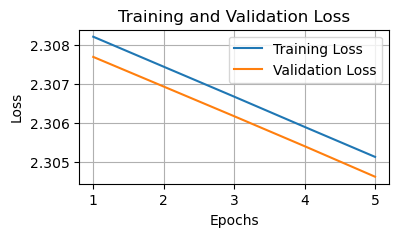

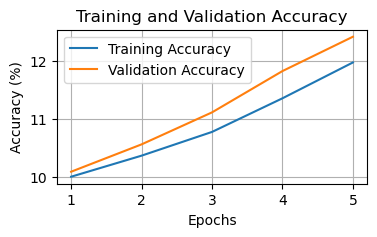

Test Accuracy: 12.54%

Training with batch size=32, learning rate=0.0001, layers=3, neurons=128
Model Number 7 Performance:
  Training Loss: 2.3050
  Validation Loss: 2.3049
  Training Accuracy: 10.18%
  Validation Accuracy: 10.20%


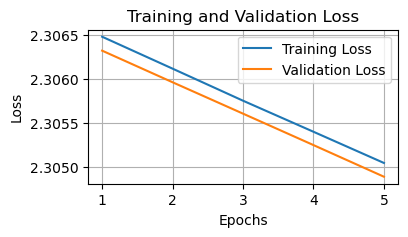

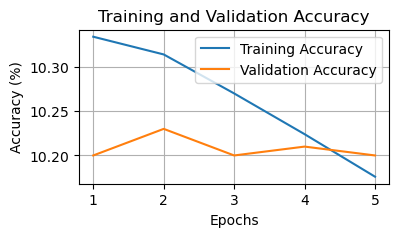

Test Accuracy: 10.08%

Training with batch size=32, learning rate=0.0001, layers=3, neurons=256
Model Number 8 Performance:
  Training Loss: 2.2998
  Validation Loss: 2.2995
  Training Accuracy: 11.92%
  Validation Accuracy: 13.00%


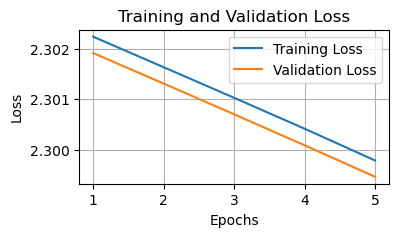

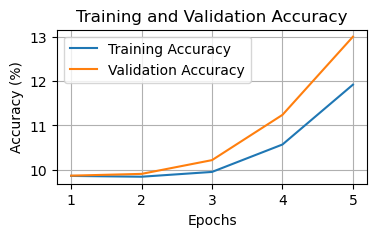

Test Accuracy: 12.51%

Training with batch size=32, learning rate=0.0001, layers=4, neurons=32
Model Number 9 Performance:
  Training Loss: 2.3109
  Validation Loss: 2.3107
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


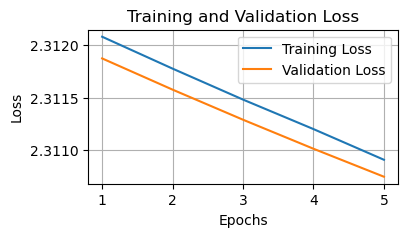

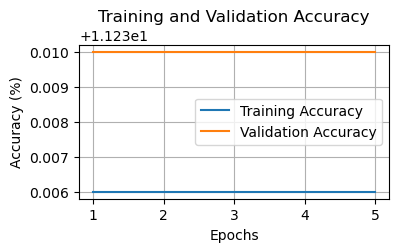

Test Accuracy: 11.35%

Training with batch size=32, learning rate=0.0001, layers=4, neurons=64
Model Number 10 Performance:
  Training Loss: 2.3045
  Validation Loss: 2.3044
  Training Accuracy: 9.93%
  Validation Accuracy: 9.93%


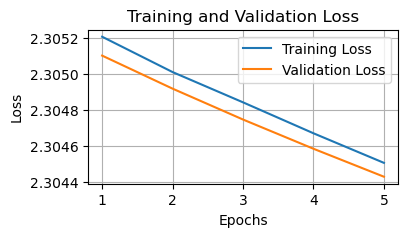

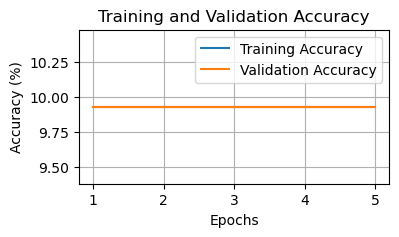

Test Accuracy: 10.32%

Training with batch size=32, learning rate=0.0001, layers=4, neurons=128
Model Number 11 Performance:
  Training Loss: 2.3024
  Validation Loss: 2.3023
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


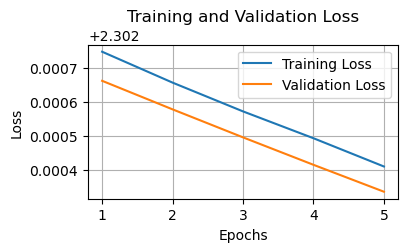

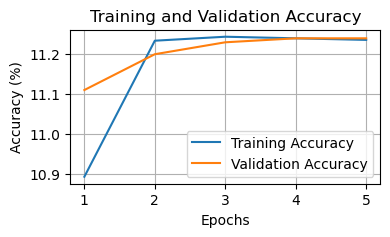

Test Accuracy: 11.35%

Training with batch size=32, learning rate=0.0001, layers=4, neurons=256
Model Number 12 Performance:
  Training Loss: 2.3014
  Validation Loss: 2.3014
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


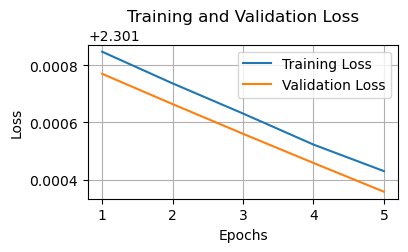

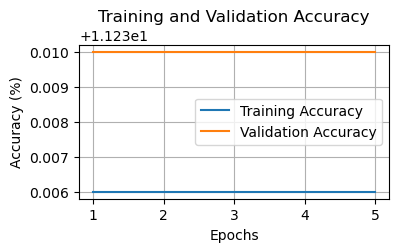

Test Accuracy: 11.35%

Training with batch size=32, learning rate=0.0001, layers=5, neurons=32
Model Number 13 Performance:
  Training Loss: 2.3070
  Validation Loss: 2.3069
  Training Accuracy: 9.93%
  Validation Accuracy: 9.93%


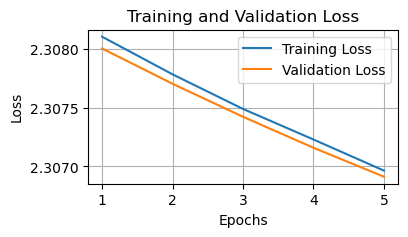

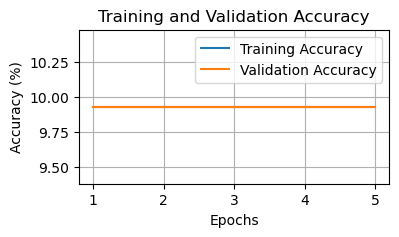

Test Accuracy: 10.32%

Training with batch size=32, learning rate=0.0001, layers=5, neurons=64
Model Number 14 Performance:
  Training Loss: 2.3043
  Validation Loss: 2.3043
  Training Accuracy: 10.22%
  Validation Accuracy: 10.22%


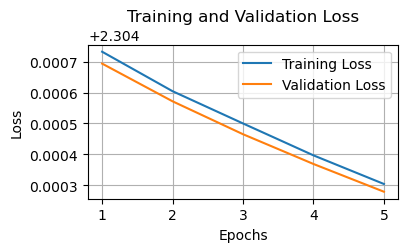

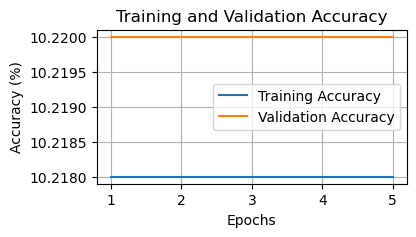

Test Accuracy: 10.10%

Training with batch size=32, learning rate=0.0001, layers=5, neurons=128
Model Number 15 Performance:
  Training Loss: 2.3028
  Validation Loss: 2.3027
  Training Accuracy: 10.22%
  Validation Accuracy: 10.22%


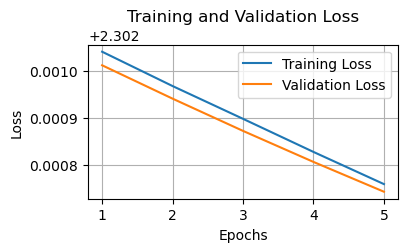

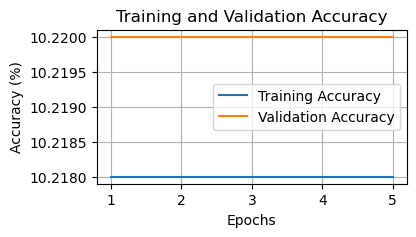

Test Accuracy: 10.10%

Training with batch size=32, learning rate=0.0001, layers=5, neurons=256
Model Number 16 Performance:
  Training Loss: 2.3027
  Validation Loss: 2.3027
  Training Accuracy: 10.22%
  Validation Accuracy: 10.22%


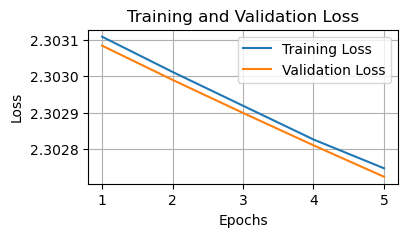

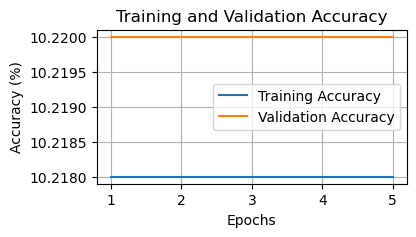

Test Accuracy: 10.10%

Training with batch size=32, learning rate=0.001, layers=2, neurons=32
Model Number 17 Performance:
  Training Loss: 1.9989
  Validation Loss: 1.9173
  Training Accuracy: 32.62%
  Validation Accuracy: 35.09%


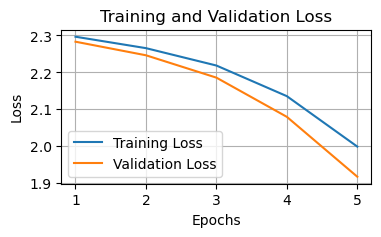

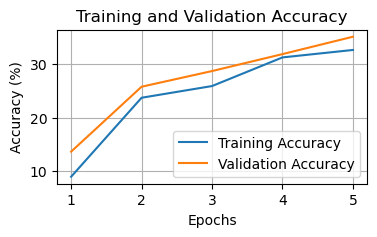

Test Accuracy: 35.17%

New Best Model!

Training with batch size=32, learning rate=0.001, layers=2, neurons=64
Model Number 18 Performance:
  Training Loss: 1.8247
  Validation Loss: 1.7349
  Training Accuracy: 50.54%
  Validation Accuracy: 52.63%


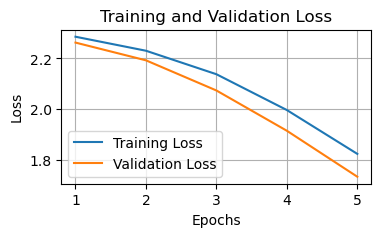

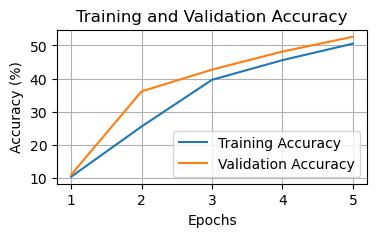

Test Accuracy: 53.26%

New Best Model!

Training with batch size=32, learning rate=0.001, layers=2, neurons=128
Model Number 19 Performance:
  Training Loss: 1.5781
  Validation Loss: 1.4566
  Training Accuracy: 57.18%
  Validation Accuracy: 61.30%


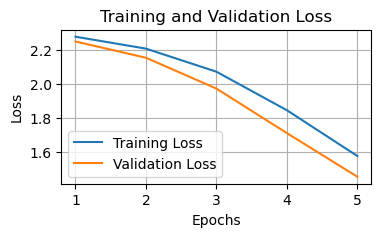

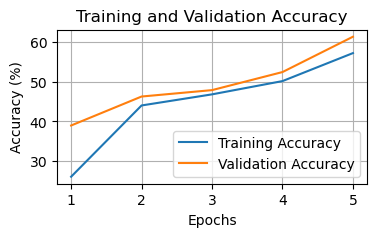

Test Accuracy: 62.57%

New Best Model!

Training with batch size=32, learning rate=0.001, layers=2, neurons=256
Model Number 20 Performance:
  Training Loss: 1.4616
  Validation Loss: 1.3003
  Training Accuracy: 65.70%
  Validation Accuracy: 70.32%


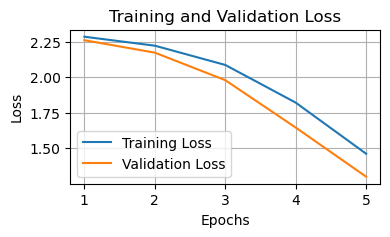

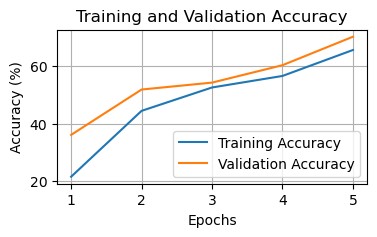

Test Accuracy: 70.98%

New Best Model!

Training with batch size=32, learning rate=0.001, layers=3, neurons=32
Model Number 21 Performance:
  Training Loss: 2.2634
  Validation Loss: 2.2530
  Training Accuracy: 27.72%
  Validation Accuracy: 31.16%


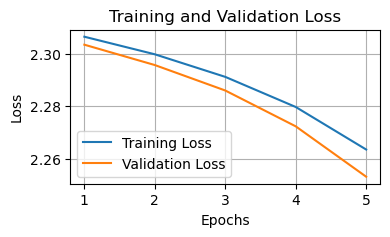

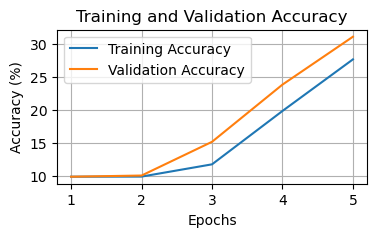

Test Accuracy: 30.69%

Training with batch size=32, learning rate=0.001, layers=3, neurons=64
Model Number 22 Performance:
  Training Loss: 2.1505
  Validation Loss: 2.0927
  Training Accuracy: 42.84%
  Validation Accuracy: 45.96%


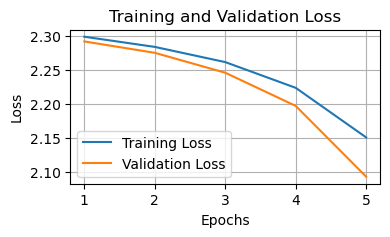

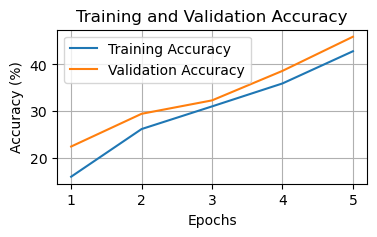

Test Accuracy: 46.29%

Training with batch size=32, learning rate=0.001, layers=3, neurons=128
Model Number 23 Performance:
  Training Loss: 2.2353
  Validation Loss: 2.2153
  Training Accuracy: 21.02%
  Validation Accuracy: 21.23%


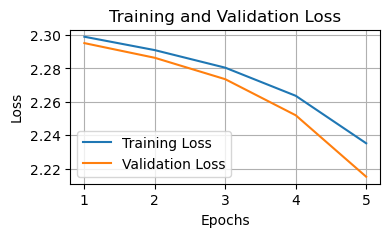

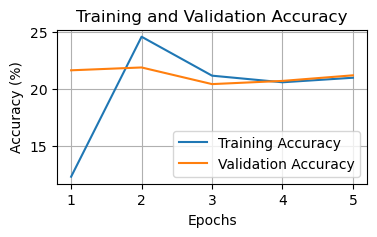

Test Accuracy: 21.32%

Training with batch size=32, learning rate=0.001, layers=3, neurons=256
Model Number 24 Performance:
  Training Loss: 2.2706
  Validation Loss: 2.2613
  Training Accuracy: 26.29%
  Validation Accuracy: 27.50%


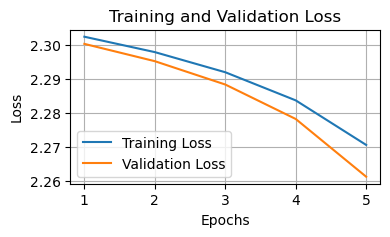

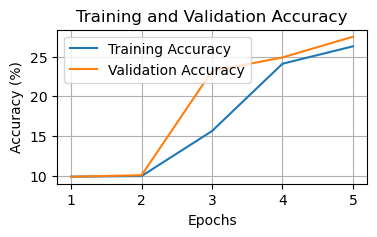

Test Accuracy: 27.93%

Training with batch size=32, learning rate=0.001, layers=4, neurons=32
Model Number 25 Performance:
  Training Loss: 2.2976
  Validation Loss: 2.2967
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


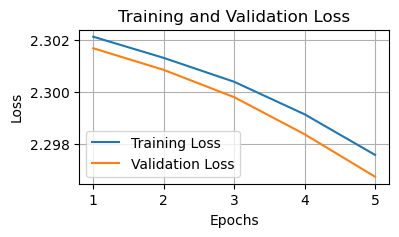

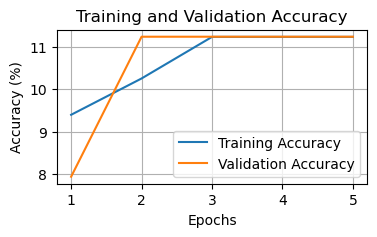

Test Accuracy: 11.35%

Training with batch size=32, learning rate=0.001, layers=4, neurons=64
Model Number 26 Performance:
  Training Loss: 2.3027
  Validation Loss: 2.3023
  Training Accuracy: 12.76%
  Validation Accuracy: 13.06%


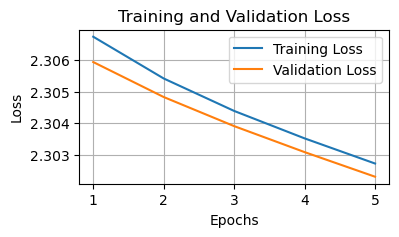

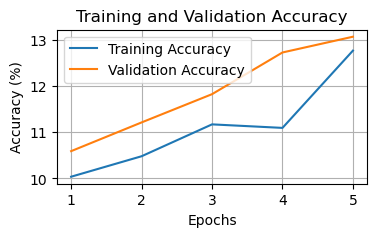

Test Accuracy: 13.02%

Training with batch size=32, learning rate=0.001, layers=4, neurons=128
Model Number 27 Performance:
  Training Loss: 2.3011
  Validation Loss: 2.3008
  Training Accuracy: 13.99%
  Validation Accuracy: 11.24%


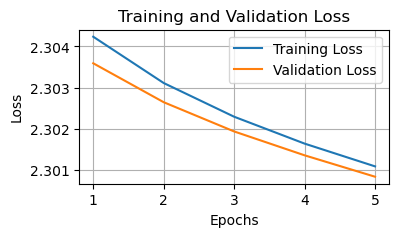

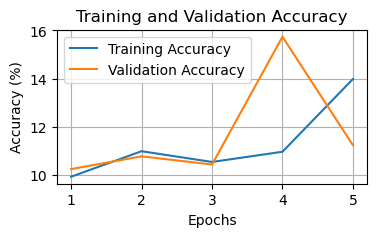

Test Accuracy: 11.35%

Training with batch size=32, learning rate=0.001, layers=4, neurons=256
Model Number 28 Performance:
  Training Loss: 2.2996
  Validation Loss: 2.2991
  Training Accuracy: 18.74%
  Validation Accuracy: 20.47%


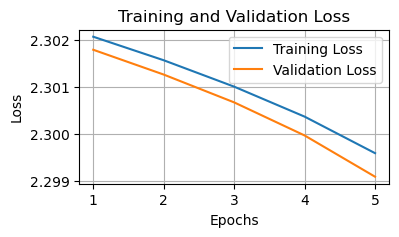

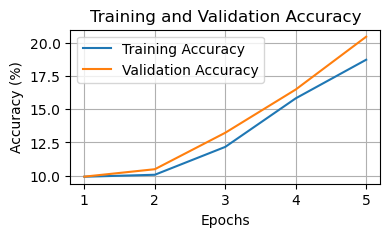

Test Accuracy: 20.78%

Training with batch size=32, learning rate=0.001, layers=5, neurons=32
Model Number 29 Performance:
  Training Loss: 2.3052
  Validation Loss: 2.3048
  Training Accuracy: 10.22%
  Validation Accuracy: 10.22%


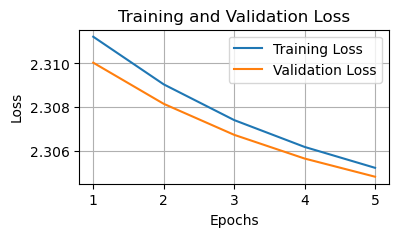

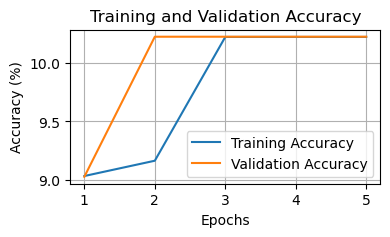

Test Accuracy: 10.10%

Training with batch size=32, learning rate=0.001, layers=5, neurons=64
Model Number 30 Performance:
  Training Loss: 2.3028
  Validation Loss: 2.3026
  Training Accuracy: 10.22%
  Validation Accuracy: 10.22%


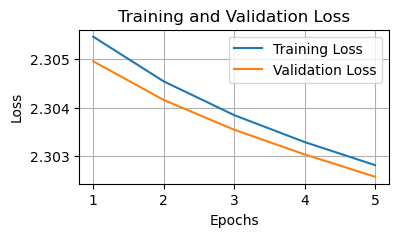

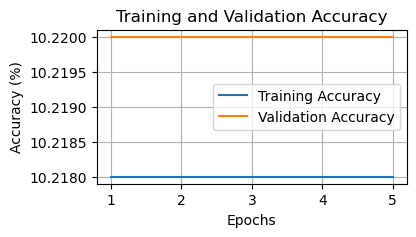

Test Accuracy: 10.10%

Training with batch size=32, learning rate=0.001, layers=5, neurons=128
Model Number 31 Performance:
  Training Loss: 2.3015
  Validation Loss: 2.3013
  Training Accuracy: 11.11%
  Validation Accuracy: 11.24%


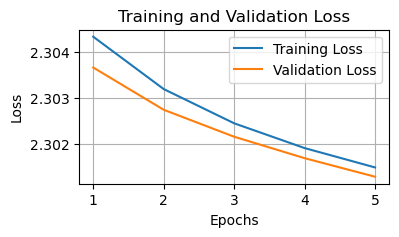

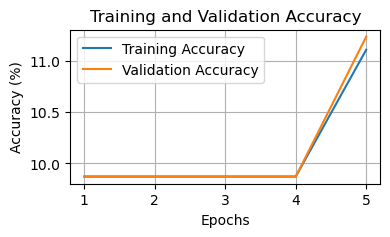

Test Accuracy: 11.35%

Training with batch size=32, learning rate=0.001, layers=5, neurons=256
Model Number 32 Performance:
  Training Loss: 2.3016
  Validation Loss: 2.3015
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


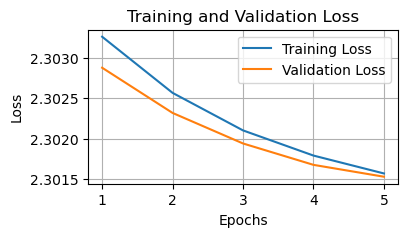

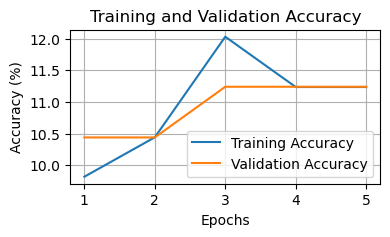

Test Accuracy: 11.35%

Training with batch size=32, learning rate=0.01, layers=2, neurons=32
Model Number 33 Performance:
  Training Loss: 0.8058
  Validation Loss: 0.7963
  Training Accuracy: 70.57%
  Validation Accuracy: 71.01%


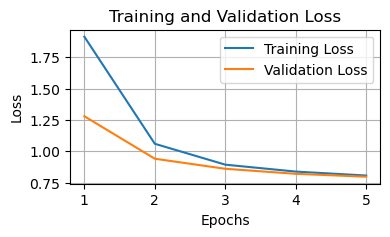

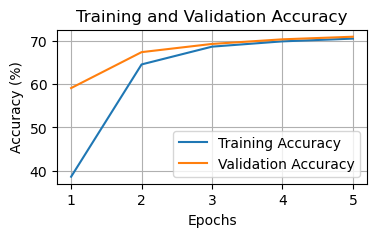

Test Accuracy: 71.34%

New Best Model!

Training with batch size=32, learning rate=0.01, layers=2, neurons=64
Model Number 34 Performance:
  Training Loss: 0.5105
  Validation Loss: 0.5114
  Training Accuracy: 82.58%
  Validation Accuracy: 82.51%


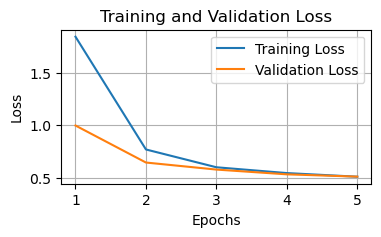

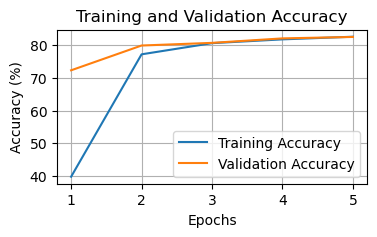

Test Accuracy: 83.20%

New Best Model!

Training with batch size=32, learning rate=0.01, layers=2, neurons=128
Model Number 35 Performance:
  Training Loss: 0.9542
  Validation Loss: 0.9483
  Training Accuracy: 63.73%
  Validation Accuracy: 63.95%


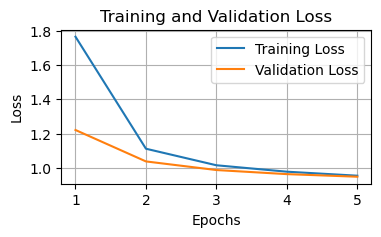

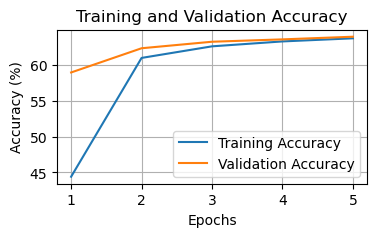

Test Accuracy: 63.84%

Training with batch size=32, learning rate=0.01, layers=2, neurons=256
Model Number 36 Performance:
  Training Loss: 0.4707
  Validation Loss: 0.4816
  Training Accuracy: 84.07%
  Validation Accuracy: 83.86%


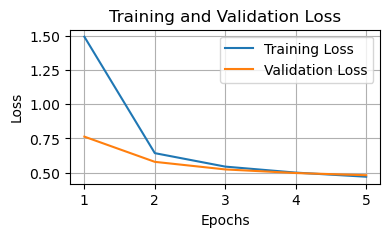

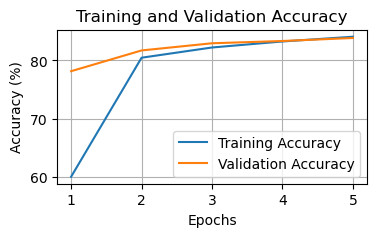

Test Accuracy: 84.17%

New Best Model!

Training with batch size=32, learning rate=0.01, layers=3, neurons=32
Model Number 37 Performance:
  Training Loss: 1.0552
  Validation Loss: 1.0123
  Training Accuracy: 68.02%
  Validation Accuracy: 68.67%


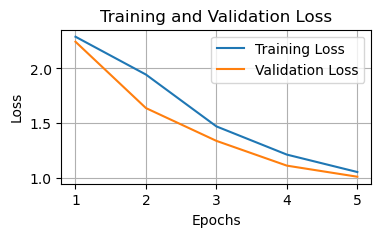

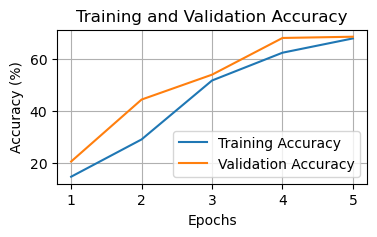

Test Accuracy: 69.60%

Training with batch size=32, learning rate=0.01, layers=3, neurons=64
Model Number 38 Performance:
  Training Loss: 1.1746
  Validation Loss: 1.1837
  Training Accuracy: 54.74%
  Validation Accuracy: 54.50%


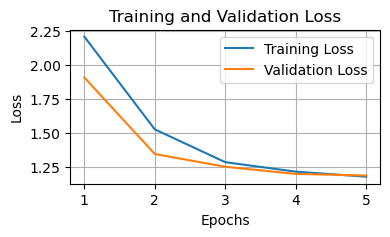

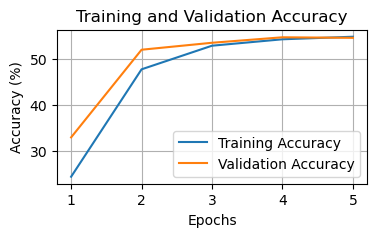

Test Accuracy: 54.08%

Training with batch size=32, learning rate=0.01, layers=3, neurons=128
Model Number 39 Performance:
  Training Loss: 1.3426
  Validation Loss: 1.3429
  Training Accuracy: 47.91%
  Validation Accuracy: 48.23%


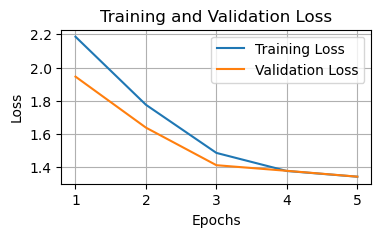

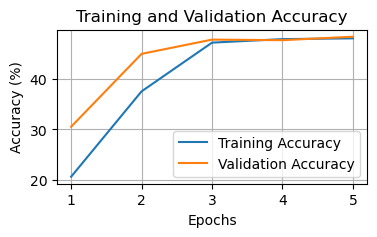

Test Accuracy: 48.73%

Training with batch size=32, learning rate=0.01, layers=3, neurons=256
Model Number 40 Performance:
  Training Loss: 0.4722
  Validation Loss: 0.4656
  Training Accuracy: 90.46%
  Validation Accuracy: 90.79%


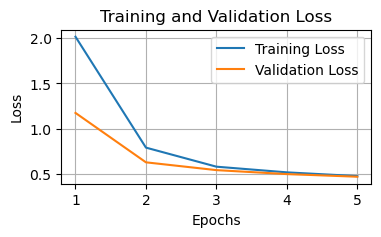

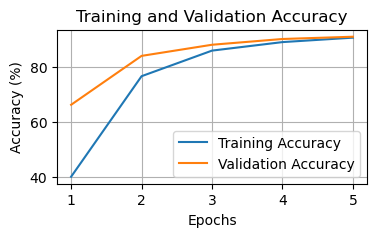

Test Accuracy: 90.60%

New Best Model!

Training with batch size=32, learning rate=0.01, layers=4, neurons=32
Model Number 41 Performance:
  Training Loss: 1.9312
  Validation Loss: 1.9170
  Training Accuracy: 28.97%
  Validation Accuracy: 30.65%


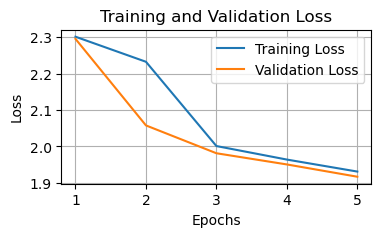

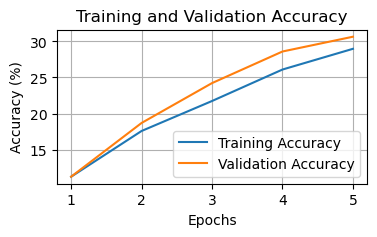

Test Accuracy: 30.62%

Training with batch size=32, learning rate=0.01, layers=4, neurons=64
Model Number 42 Performance:
  Training Loss: 0.8742
  Validation Loss: 0.8466
  Training Accuracy: 69.78%
  Validation Accuracy: 70.21%


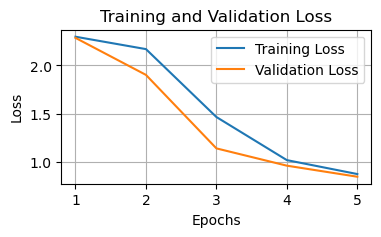

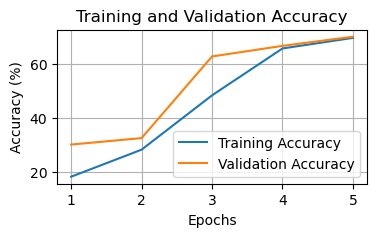

Test Accuracy: 69.87%

Training with batch size=32, learning rate=0.01, layers=4, neurons=128
Model Number 43 Performance:
  Training Loss: 0.3889
  Validation Loss: 0.3366
  Training Accuracy: 88.51%
  Validation Accuracy: 90.08%


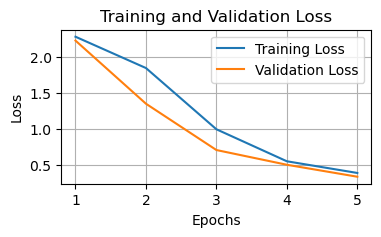

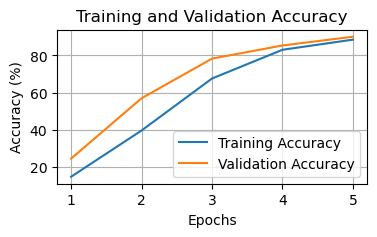

Test Accuracy: 90.30%

Training with batch size=32, learning rate=0.01, layers=4, neurons=256
Model Number 44 Performance:
  Training Loss: 1.3399
  Validation Loss: 1.2953
  Training Accuracy: 48.56%
  Validation Accuracy: 48.59%


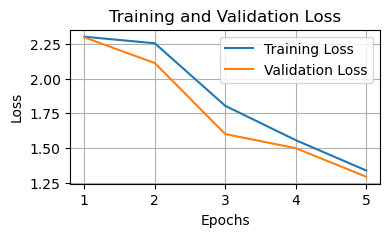

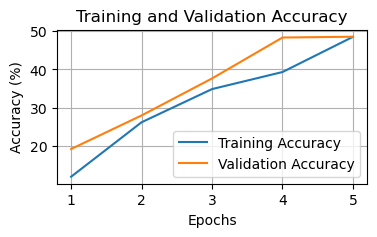

Test Accuracy: 49.37%

Training with batch size=32, learning rate=0.01, layers=5, neurons=32
Model Number 45 Performance:
  Training Loss: 1.8922
  Validation Loss: 1.8205
  Training Accuracy: 31.39%
  Validation Accuracy: 33.62%


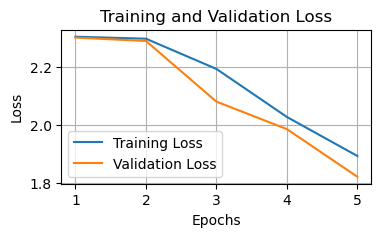

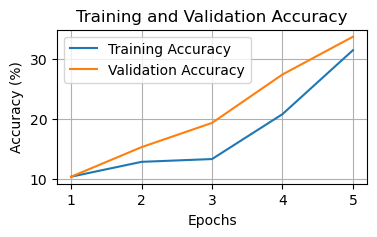

Test Accuracy: 33.37%

Training with batch size=32, learning rate=0.01, layers=5, neurons=64
Model Number 46 Performance:
  Training Loss: 2.2985
  Validation Loss: 2.2953
  Training Accuracy: 19.11%
  Validation Accuracy: 18.96%


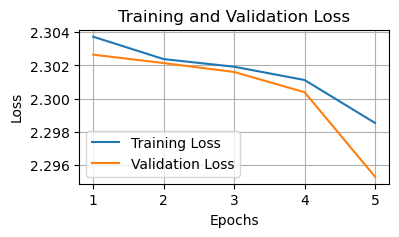

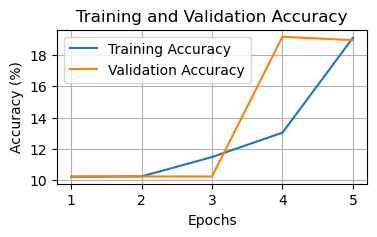

Test Accuracy: 18.60%

Training with batch size=32, learning rate=0.01, layers=5, neurons=128
Model Number 47 Performance:
  Training Loss: 1.0029
  Validation Loss: 0.8424
  Training Accuracy: 67.22%
  Validation Accuracy: 71.92%


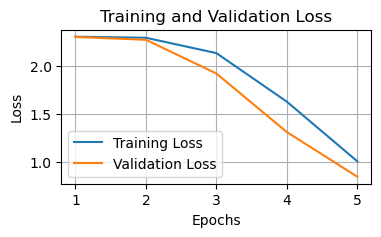

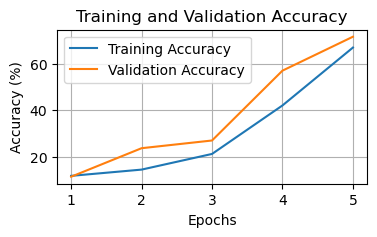

Test Accuracy: 72.44%

Training with batch size=32, learning rate=0.01, layers=5, neurons=256
Model Number 48 Performance:
  Training Loss: 2.2413
  Validation Loss: 2.1084
  Training Accuracy: 20.77%
  Validation Accuracy: 20.11%


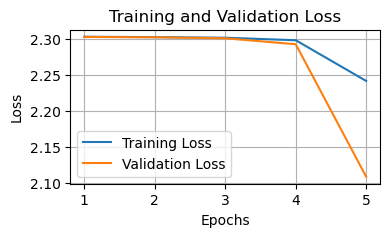

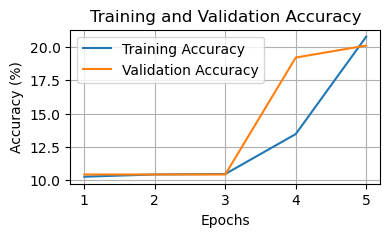

Test Accuracy: 19.54%

Training with batch size=32, learning rate=0.1, layers=2, neurons=32
Model Number 49 Performance:
  Training Loss: 0.1724
  Validation Loss: 0.2035
  Training Accuracy: 94.81%
  Validation Accuracy: 93.94%


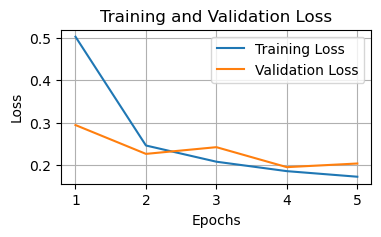

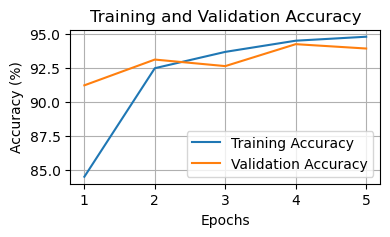

Test Accuracy: 94.20%

New Best Model!

Training with batch size=32, learning rate=0.1, layers=2, neurons=64
Model Number 50 Performance:
  Training Loss: 0.1112
  Validation Loss: 0.1409
  Training Accuracy: 96.66%
  Validation Accuracy: 96.08%


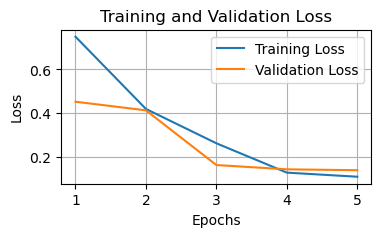

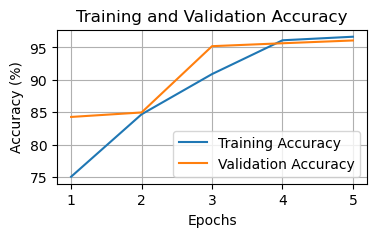

Test Accuracy: 96.33%

New Best Model!

Training with batch size=32, learning rate=0.1, layers=2, neurons=128
Model Number 51 Performance:
  Training Loss: 0.3402
  Validation Loss: 0.3783
  Training Accuracy: 86.46%
  Validation Accuracy: 85.74%


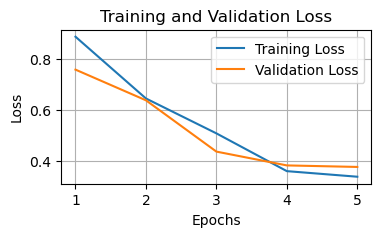

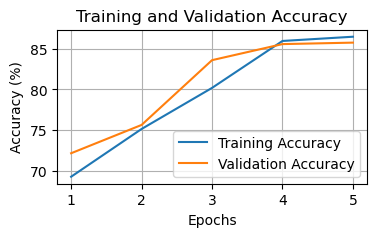

Test Accuracy: 85.70%

Training with batch size=32, learning rate=0.1, layers=2, neurons=256
Model Number 52 Performance:
  Training Loss: 0.9809
  Validation Loss: 1.0088
  Training Accuracy: 68.37%
  Validation Accuracy: 67.45%


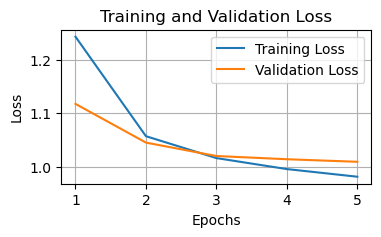

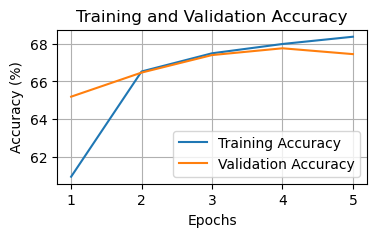

Test Accuracy: 67.88%

Training with batch size=32, learning rate=0.1, layers=3, neurons=32
Model Number 53 Performance:
  Training Loss: 0.4545
  Validation Loss: 0.4971
  Training Accuracy: 84.04%
  Validation Accuracy: 82.38%


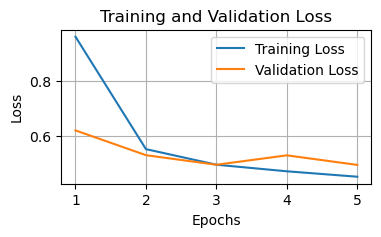

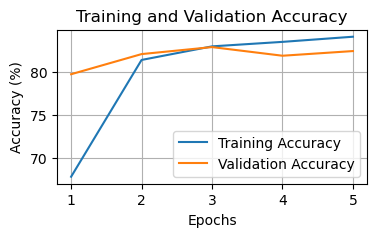

Test Accuracy: 82.21%

Training with batch size=32, learning rate=0.1, layers=3, neurons=64
Model Number 54 Performance:
  Training Loss: 0.3633
  Validation Loss: 0.4046
  Training Accuracy: 86.73%
  Validation Accuracy: 86.20%


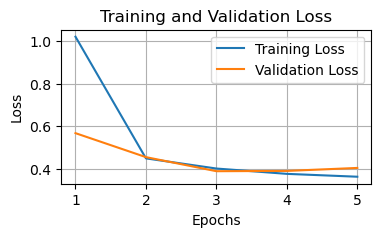

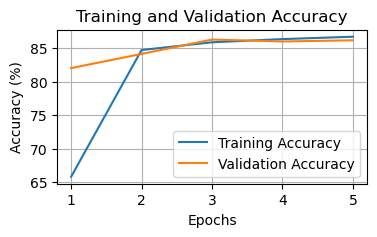

Test Accuracy: 85.81%

Training with batch size=32, learning rate=0.1, layers=3, neurons=128
Model Number 55 Performance:
  Training Loss: 0.5815
  Validation Loss: 0.6047
  Training Accuracy: 85.44%
  Validation Accuracy: 84.68%


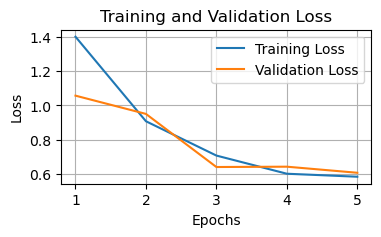

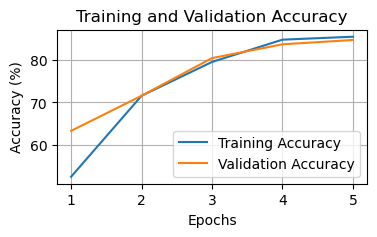

Test Accuracy: 84.75%

Training with batch size=32, learning rate=0.1, layers=3, neurons=256
Model Number 56 Performance:
  Training Loss: 0.7375
  Validation Loss: 0.7692
  Training Accuracy: 69.43%
  Validation Accuracy: 68.85%


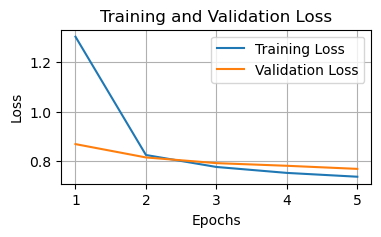

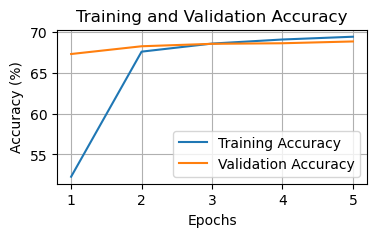

Test Accuracy: 69.34%

Training with batch size=32, learning rate=0.1, layers=4, neurons=32
Model Number 57 Performance:
  Training Loss: 0.4819
  Validation Loss: 0.4916
  Training Accuracy: 86.78%
  Validation Accuracy: 86.26%


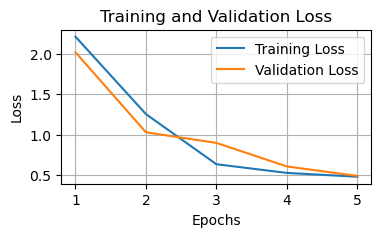

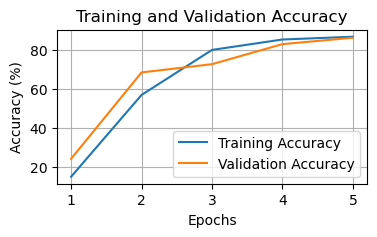

Test Accuracy: 86.65%

Training with batch size=32, learning rate=0.1, layers=4, neurons=64
Model Number 58 Performance:
  Training Loss: 0.2029
  Validation Loss: 0.2467
  Training Accuracy: 94.24%
  Validation Accuracy: 93.17%


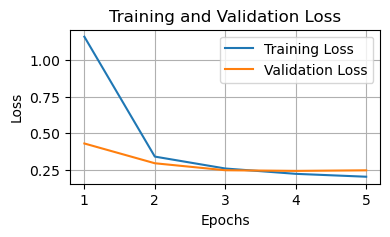

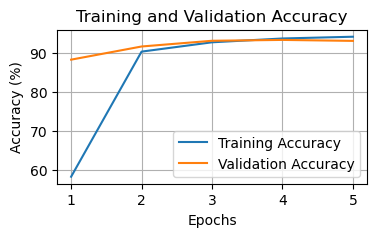

Test Accuracy: 93.49%

Training with batch size=32, learning rate=0.1, layers=4, neurons=128
Model Number 59 Performance:
  Training Loss: 0.3640
  Validation Loss: 0.3816
  Training Accuracy: 94.82%
  Validation Accuracy: 94.68%


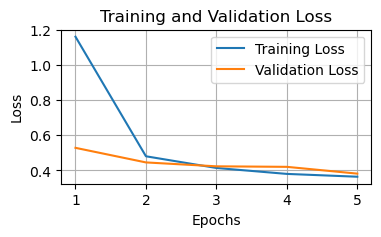

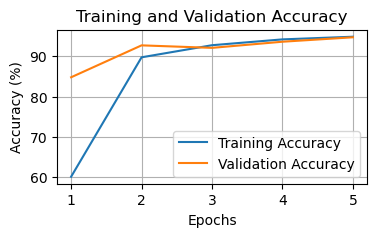

Test Accuracy: 95.09%

Training with batch size=32, learning rate=0.1, layers=4, neurons=256
Model Number 60 Performance:
  Training Loss: 0.2463
  Validation Loss: 0.1389
  Training Accuracy: 90.83%
  Validation Accuracy: 96.39%


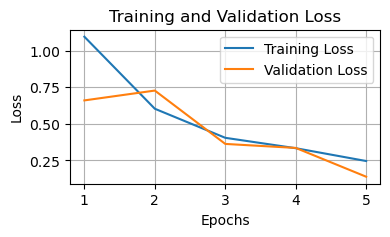

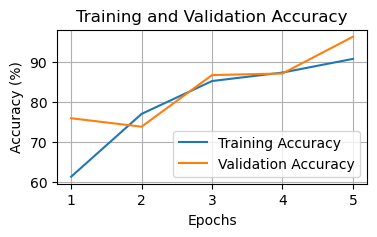

Test Accuracy: 96.59%

New Best Model!

Training with batch size=32, learning rate=0.1, layers=5, neurons=32
Model Number 61 Performance:
  Training Loss: 1.8823
  Validation Loss: 1.8929
  Training Accuracy: 29.62%
  Validation Accuracy: 29.52%


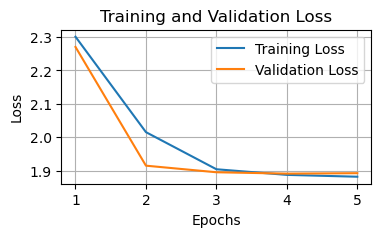

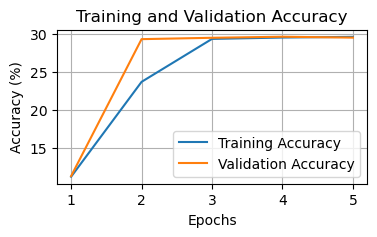

Test Accuracy: 29.69%

Training with batch size=32, learning rate=0.1, layers=5, neurons=64
Model Number 62 Performance:
  Training Loss: 0.2672
  Validation Loss: 0.2836
  Training Accuracy: 92.42%
  Validation Accuracy: 92.27%


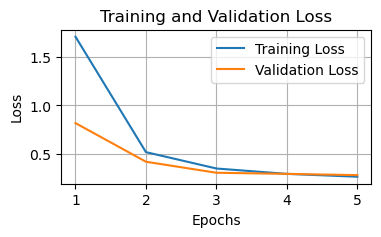

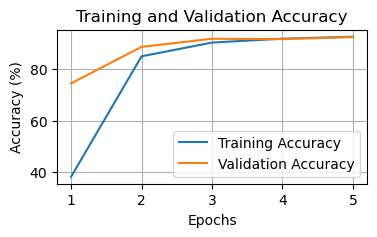

Test Accuracy: 92.42%

Training with batch size=32, learning rate=0.1, layers=5, neurons=128
Model Number 63 Performance:
  Training Loss: 0.8468
  Validation Loss: 0.9095
  Training Accuracy: 74.98%
  Validation Accuracy: 73.45%


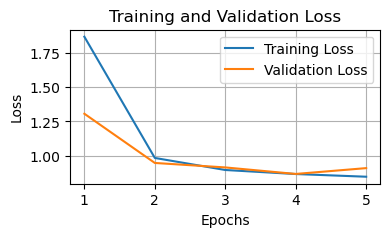

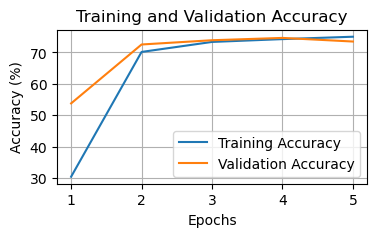

Test Accuracy: 72.89%

Training with batch size=32, learning rate=0.1, layers=5, neurons=256
Model Number 64 Performance:
  Training Loss: 0.5469
  Validation Loss: 0.5873
  Training Accuracy: 87.27%
  Validation Accuracy: 86.67%


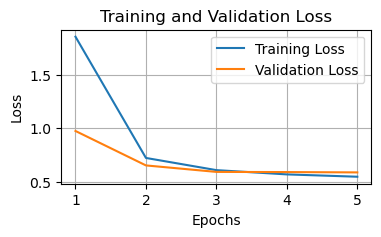

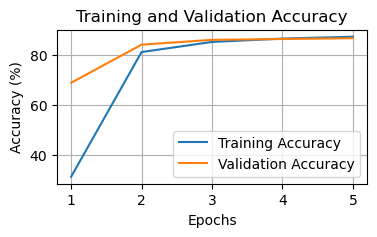

Test Accuracy: 86.82%

Training with batch size=64, learning rate=0.0001, layers=2, neurons=32
Model Number 65 Performance:
  Training Loss: 2.3017
  Validation Loss: 2.3017
  Training Accuracy: 13.29%
  Validation Accuracy: 13.14%


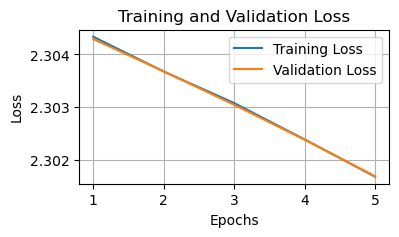

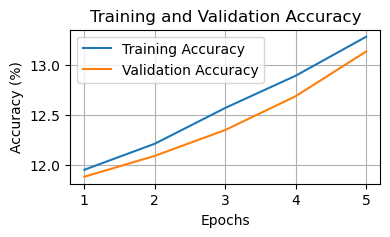

Test Accuracy: 13.62%

Training with batch size=64, learning rate=0.0001, layers=2, neurons=64
Model Number 66 Performance:
  Training Loss: 2.2957
  Validation Loss: 2.2946
  Training Accuracy: 11.39%
  Validation Accuracy: 11.97%


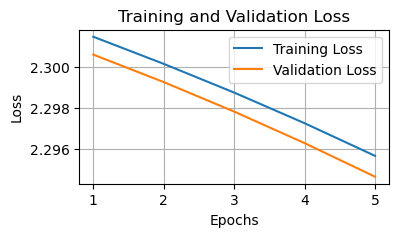

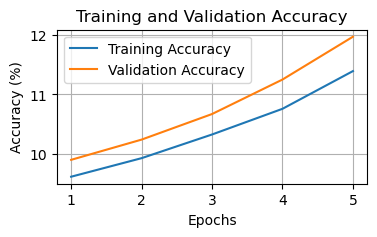

Test Accuracy: 11.72%

Training with batch size=64, learning rate=0.0001, layers=2, neurons=128
Model Number 67 Performance:
  Training Loss: 2.2969
  Validation Loss: 2.2964
  Training Accuracy: 13.67%
  Validation Accuracy: 14.42%


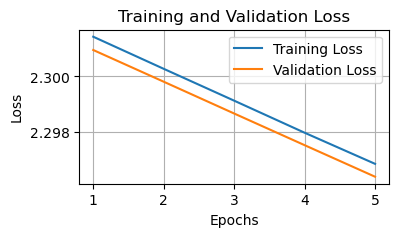

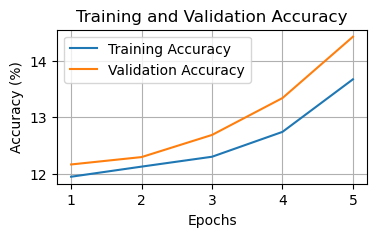

Test Accuracy: 14.52%

Training with batch size=64, learning rate=0.0001, layers=2, neurons=256
Model Number 68 Performance:
  Training Loss: 2.2973
  Validation Loss: 2.2968
  Training Accuracy: 11.42%
  Validation Accuracy: 11.52%


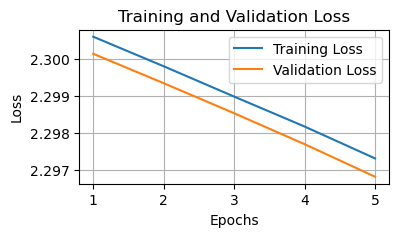

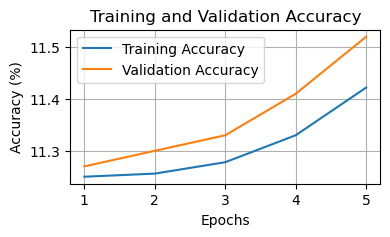

Test Accuracy: 11.58%

Training with batch size=64, learning rate=0.0001, layers=3, neurons=32
Model Number 69 Performance:
  Training Loss: 2.3038
  Validation Loss: 2.3037
  Training Accuracy: 9.91%
  Validation Accuracy: 9.92%


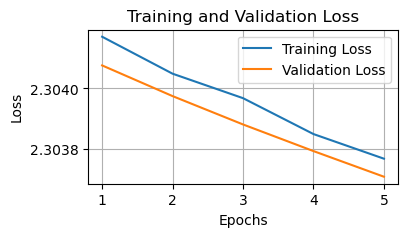

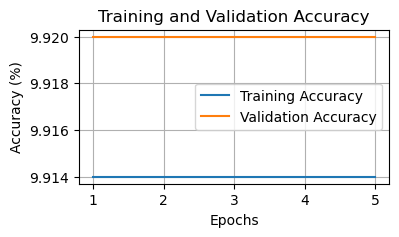

Test Accuracy: 10.09%

Training with batch size=64, learning rate=0.0001, layers=3, neurons=64
Model Number 70 Performance:
  Training Loss: 2.3056
  Validation Loss: 2.3055
  Training Accuracy: 9.04%
  Validation Accuracy: 9.03%


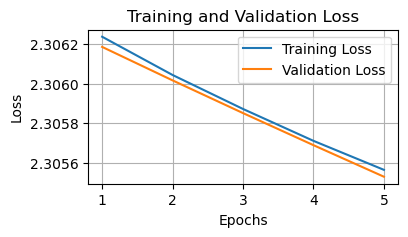

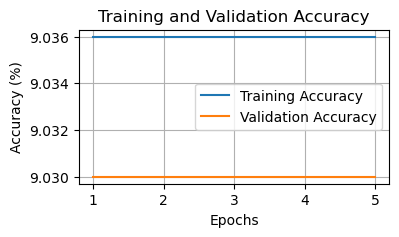

Test Accuracy: 8.92%

Training with batch size=64, learning rate=0.0001, layers=3, neurons=128
Model Number 71 Performance:
  Training Loss: 2.3029
  Validation Loss: 2.3028
  Training Accuracy: 10.09%
  Validation Accuracy: 10.04%


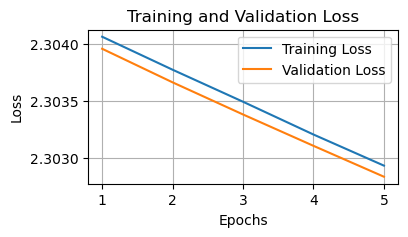

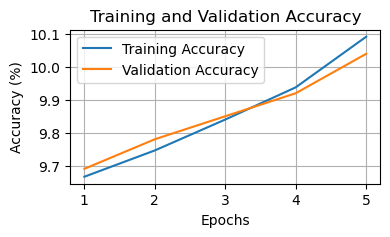

Test Accuracy: 10.19%

Training with batch size=64, learning rate=0.0001, layers=3, neurons=256
Model Number 72 Performance:
  Training Loss: 2.3015
  Validation Loss: 2.3013
  Training Accuracy: 10.94%
  Validation Accuracy: 11.03%


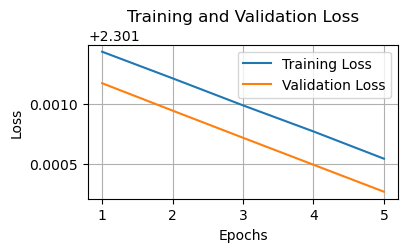

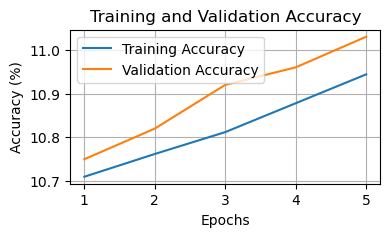

Test Accuracy: 10.80%

Training with batch size=64, learning rate=0.0001, layers=4, neurons=32
Model Number 73 Performance:
  Training Loss: 2.3052
  Validation Loss: 2.3052
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


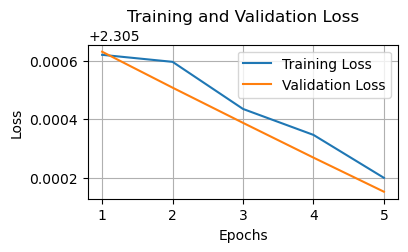

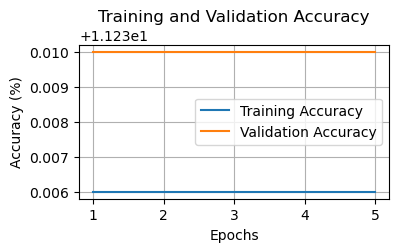

Test Accuracy: 11.35%

Training with batch size=64, learning rate=0.0001, layers=4, neurons=64
Model Number 74 Performance:
  Training Loss: 2.3037
  Validation Loss: 2.3037
  Training Accuracy: 9.75%
  Validation Accuracy: 9.75%


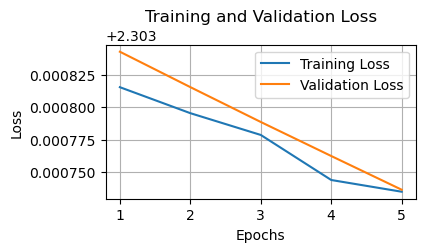

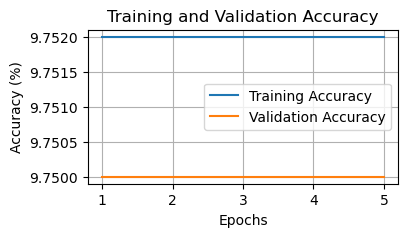

Test Accuracy: 9.74%

Training with batch size=64, learning rate=0.0001, layers=4, neurons=128
Model Number 75 Performance:
  Training Loss: 2.3038
  Validation Loss: 2.3036
  Training Accuracy: 10.22%
  Validation Accuracy: 10.22%


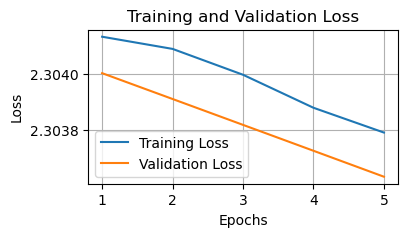

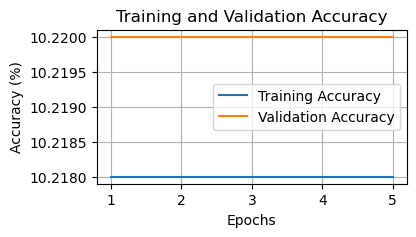

Test Accuracy: 10.10%

Training with batch size=64, learning rate=0.0001, layers=4, neurons=256
Model Number 76 Performance:
  Training Loss: 2.3039
  Validation Loss: 2.3038
  Training Accuracy: 9.73%
  Validation Accuracy: 9.76%


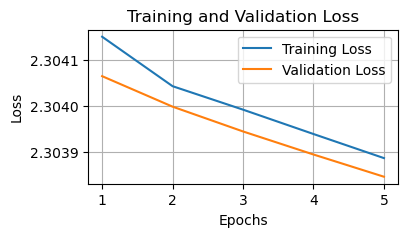

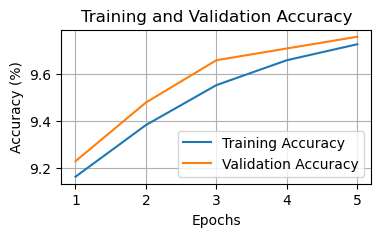

Test Accuracy: 9.48%

Training with batch size=64, learning rate=0.0001, layers=5, neurons=32
Model Number 77 Performance:
  Training Loss: 2.3044
  Validation Loss: 2.3043
  Training Accuracy: 10.22%
  Validation Accuracy: 10.22%


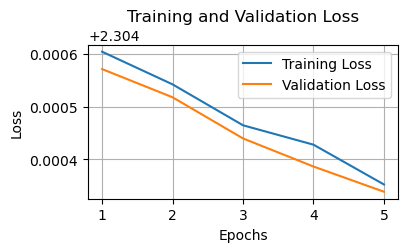

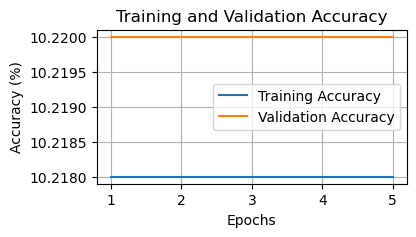

Test Accuracy: 10.10%

Training with batch size=64, learning rate=0.0001, layers=5, neurons=64
Model Number 78 Performance:
  Training Loss: 2.3075
  Validation Loss: 2.3077
  Training Accuracy: 10.44%
  Validation Accuracy: 10.44%


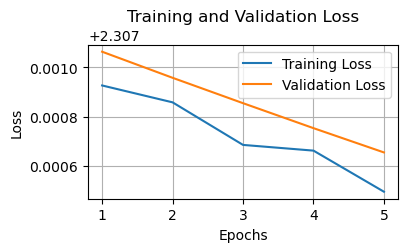

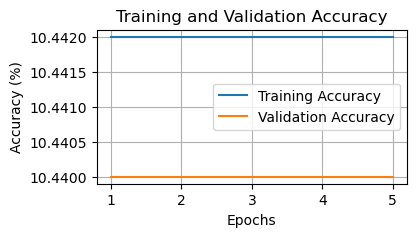

Test Accuracy: 10.28%

Training with batch size=64, learning rate=0.0001, layers=5, neurons=128
Model Number 79 Performance:
  Training Loss: 2.3044
  Validation Loss: 2.3044
  Training Accuracy: 9.74%
  Validation Accuracy: 9.74%


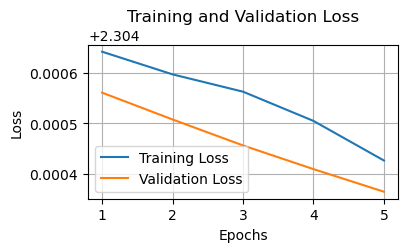

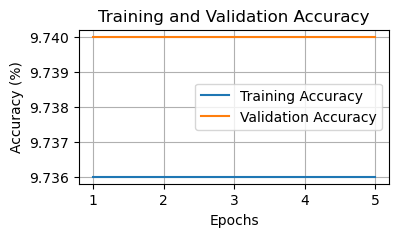

Test Accuracy: 9.82%

Training with batch size=64, learning rate=0.0001, layers=5, neurons=256
Model Number 80 Performance:
  Training Loss: 2.3044
  Validation Loss: 2.3044
  Training Accuracy: 9.91%
  Validation Accuracy: 9.92%


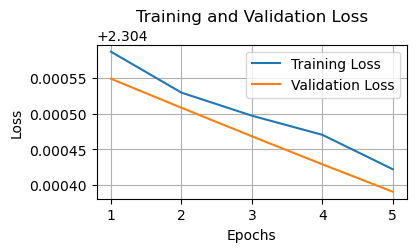

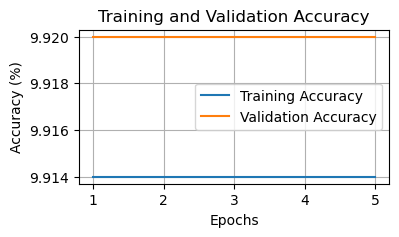

Test Accuracy: 10.09%

Training with batch size=64, learning rate=0.001, layers=2, neurons=32
Model Number 81 Performance:
  Training Loss: 2.2610
  Validation Loss: 2.2549
  Training Accuracy: 20.63%
  Validation Accuracy: 20.76%


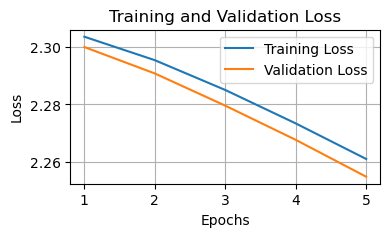

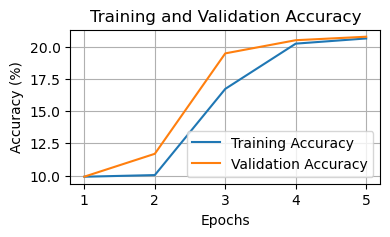

Test Accuracy: 21.16%

Training with batch size=64, learning rate=0.001, layers=2, neurons=64
Model Number 82 Performance:
  Training Loss: 2.1820
  Validation Loss: 2.1549
  Training Accuracy: 50.00%
  Validation Accuracy: 52.03%


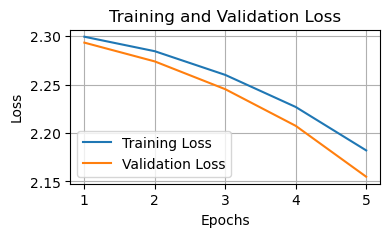

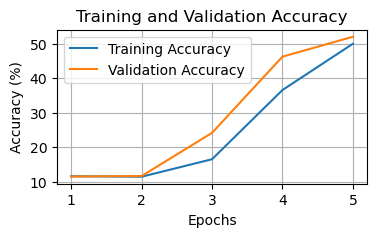

Test Accuracy: 52.78%

Training with batch size=64, learning rate=0.001, layers=2, neurons=128
Model Number 83 Performance:
  Training Loss: 2.1987
  Validation Loss: 2.1752
  Training Accuracy: 52.83%
  Validation Accuracy: 53.81%


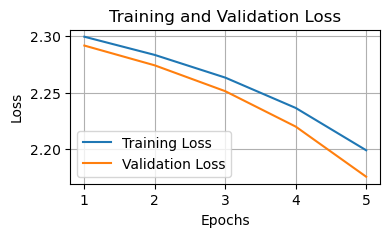

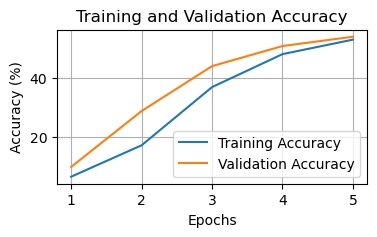

Test Accuracy: 54.27%

Training with batch size=64, learning rate=0.001, layers=2, neurons=256
Model Number 84 Performance:
  Training Loss: 2.2704
  Validation Loss: 2.2642
  Training Accuracy: 19.62%
  Validation Accuracy: 19.62%


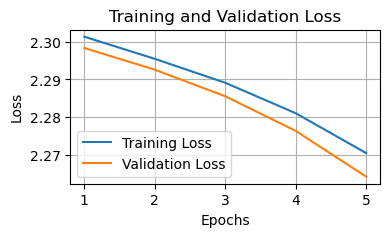

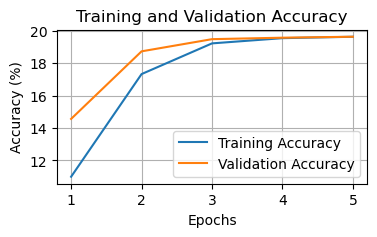

Test Accuracy: 19.36%

Training with batch size=64, learning rate=0.001, layers=3, neurons=32
Model Number 85 Performance:
  Training Loss: 2.2872
  Validation Loss: 2.2824
  Training Accuracy: 22.64%
  Validation Accuracy: 23.90%


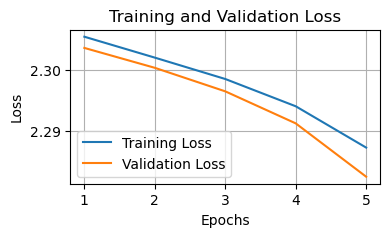

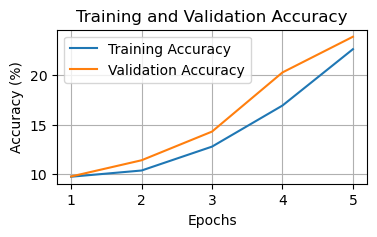

Test Accuracy: 23.90%

Training with batch size=64, learning rate=0.001, layers=3, neurons=64
Model Number 86 Performance:
  Training Loss: 2.2892
  Validation Loss: 2.2867
  Training Accuracy: 16.29%
  Validation Accuracy: 26.38%


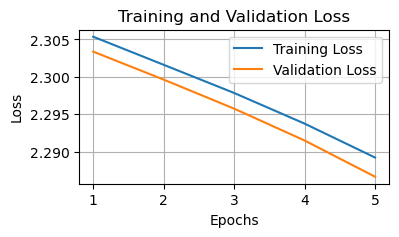

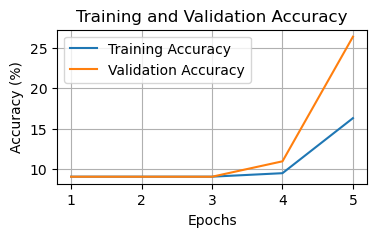

Test Accuracy: 26.67%

Training with batch size=64, learning rate=0.001, layers=3, neurons=128
Model Number 87 Performance:
  Training Loss: 2.2973
  Validation Loss: 2.2966
  Training Accuracy: 18.75%
  Validation Accuracy: 18.60%


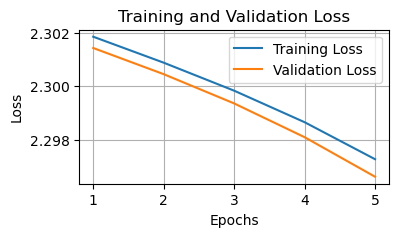

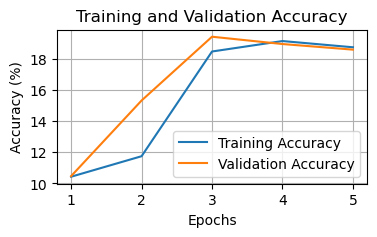

Test Accuracy: 18.32%

Training with batch size=64, learning rate=0.001, layers=3, neurons=256
Model Number 88 Performance:
  Training Loss: 2.2968
  Validation Loss: 2.2958
  Training Accuracy: 10.52%
  Validation Accuracy: 10.79%


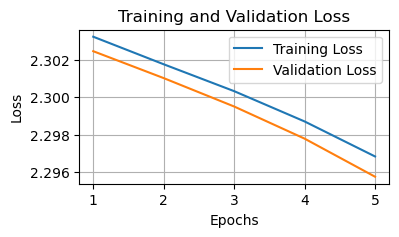

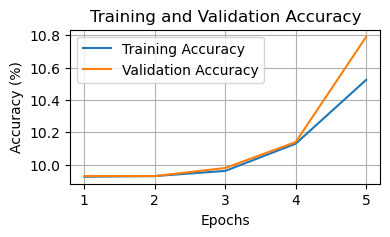

Test Accuracy: 10.99%

Training with batch size=64, learning rate=0.001, layers=4, neurons=32
Model Number 89 Performance:
  Training Loss: 2.3023
  Validation Loss: 2.3020
  Training Accuracy: 9.86%
  Validation Accuracy: 9.86%


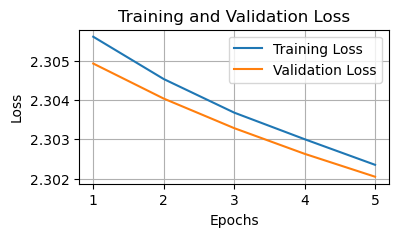

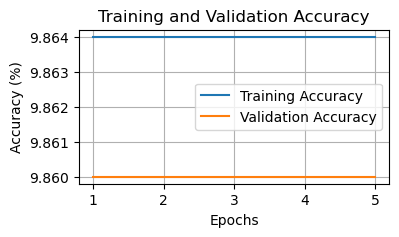

Test Accuracy: 9.58%

Training with batch size=64, learning rate=0.001, layers=4, neurons=64
Model Number 90 Performance:
  Training Loss: 2.3010
  Validation Loss: 2.3006
  Training Accuracy: 9.94%
  Validation Accuracy: 10.00%


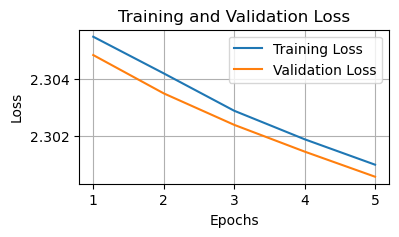

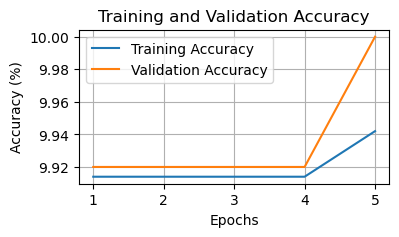

Test Accuracy: 10.18%

Training with batch size=64, learning rate=0.001, layers=4, neurons=128
Model Number 91 Performance:
  Training Loss: 2.3006
  Validation Loss: 2.3005
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


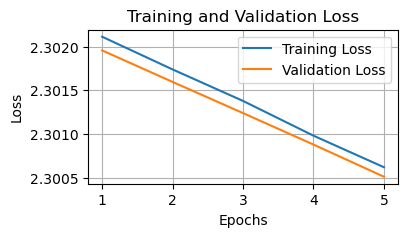

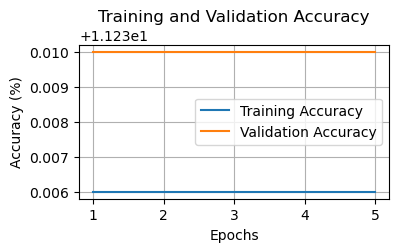

Test Accuracy: 11.35%

Training with batch size=64, learning rate=0.001, layers=4, neurons=256
Model Number 92 Performance:
  Training Loss: 2.3022
  Validation Loss: 2.3022
  Training Accuracy: 10.44%
  Validation Accuracy: 10.44%


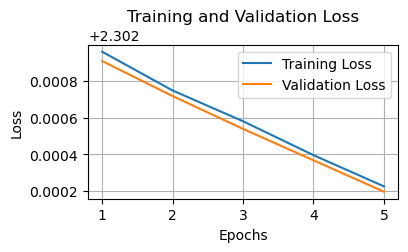

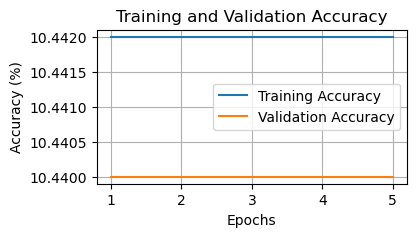

Test Accuracy: 10.28%

Training with batch size=64, learning rate=0.001, layers=5, neurons=32
Model Number 93 Performance:
  Training Loss: 2.3105
  Validation Loss: 2.3096
  Training Accuracy: 9.74%
  Validation Accuracy: 9.74%


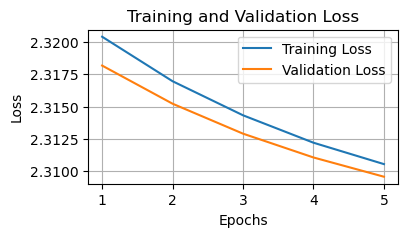

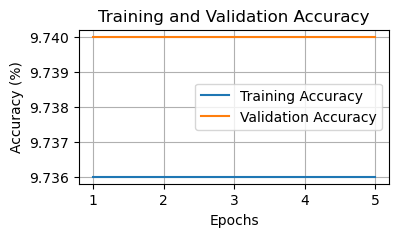

Test Accuracy: 9.82%

Training with batch size=64, learning rate=0.001, layers=5, neurons=64
Model Number 94 Performance:
  Training Loss: 2.3027
  Validation Loss: 2.3026
  Training Accuracy: 11.55%
  Validation Accuracy: 11.24%


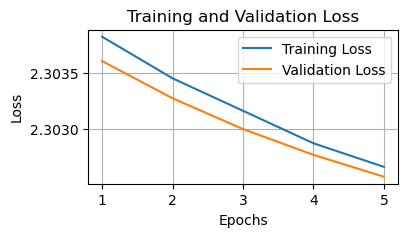

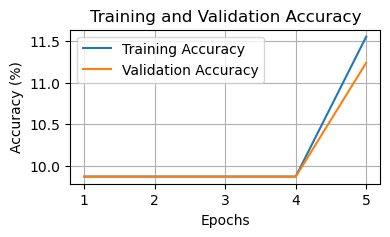

Test Accuracy: 11.35%

Training with batch size=64, learning rate=0.001, layers=5, neurons=128
Model Number 95 Performance:
  Training Loss: 2.3039
  Validation Loss: 2.3038
  Training Accuracy: 9.85%
  Validation Accuracy: 9.92%


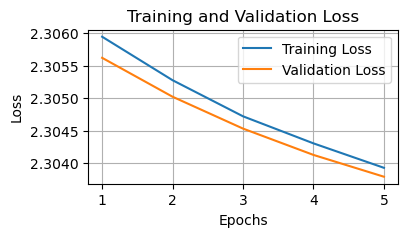

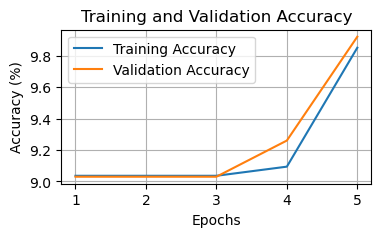

Test Accuracy: 10.09%

Training with batch size=64, learning rate=0.001, layers=5, neurons=256
Model Number 96 Performance:
  Training Loss: 2.3020
  Validation Loss: 2.3019
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


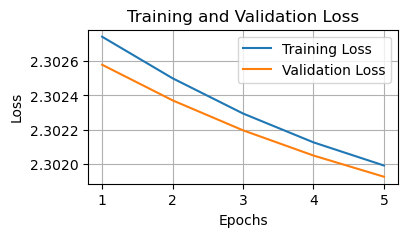

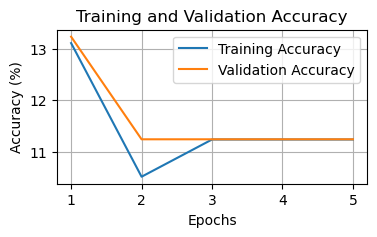

Test Accuracy: 11.35%

Training with batch size=64, learning rate=0.01, layers=2, neurons=32
Model Number 97 Performance:
  Training Loss: 0.8825
  Validation Loss: 0.8732
  Training Accuracy: 69.57%
  Validation Accuracy: 69.90%


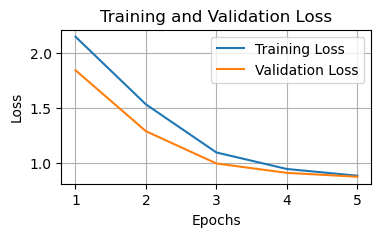

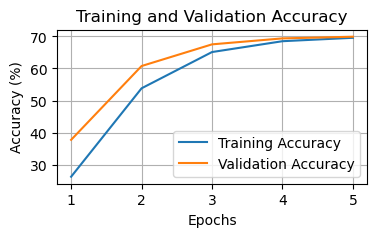

Test Accuracy: 69.78%

Training with batch size=64, learning rate=0.01, layers=2, neurons=64
Model Number 98 Performance:
  Training Loss: 1.3582
  Validation Loss: 1.3518
  Training Accuracy: 47.79%
  Validation Accuracy: 47.53%


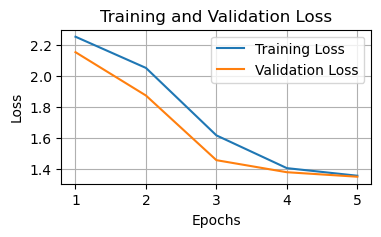

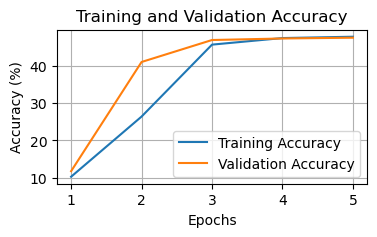

Test Accuracy: 47.40%

Training with batch size=64, learning rate=0.01, layers=2, neurons=128
Model Number 99 Performance:
  Training Loss: 0.7274
  Validation Loss: 0.7228
  Training Accuracy: 75.31%
  Validation Accuracy: 75.00%


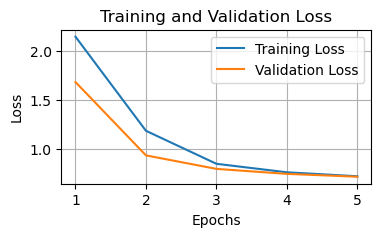

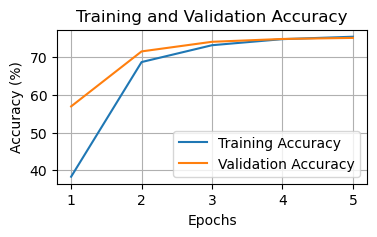

Test Accuracy: 75.73%

Training with batch size=64, learning rate=0.01, layers=2, neurons=256
Model Number 100 Performance:
  Training Loss: 1.2946
  Validation Loss: 1.2975
  Training Accuracy: 48.99%
  Validation Accuracy: 48.97%


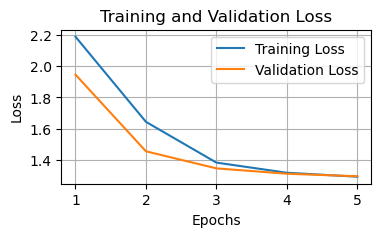

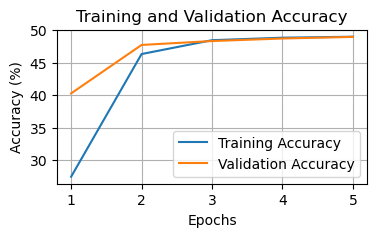

Test Accuracy: 49.50%

Training with batch size=64, learning rate=0.01, layers=3, neurons=32
Model Number 101 Performance:
  Training Loss: 1.6357
  Validation Loss: 1.5653
  Training Accuracy: 41.62%
  Validation Accuracy: 43.90%


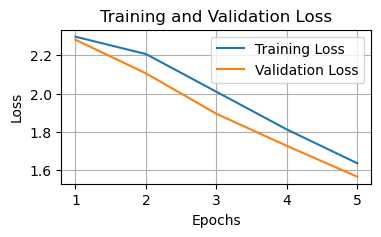

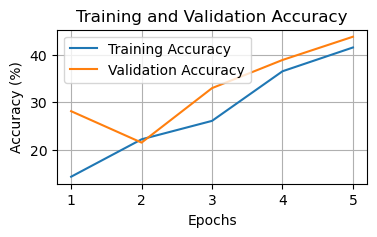

Test Accuracy: 44.33%

Training with batch size=64, learning rate=0.01, layers=3, neurons=64
Model Number 102 Performance:
  Training Loss: 0.4522
  Validation Loss: 0.4223
  Training Accuracy: 86.65%
  Validation Accuracy: 88.03%


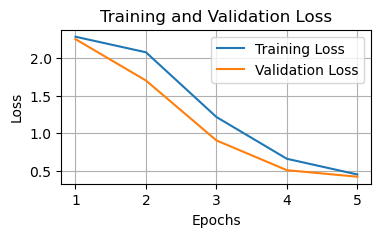

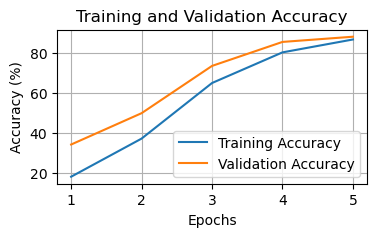

Test Accuracy: 87.83%

Training with batch size=64, learning rate=0.01, layers=3, neurons=128
Model Number 103 Performance:
  Training Loss: 1.1413
  Validation Loss: 1.0975
  Training Accuracy: 58.98%
  Validation Accuracy: 60.14%


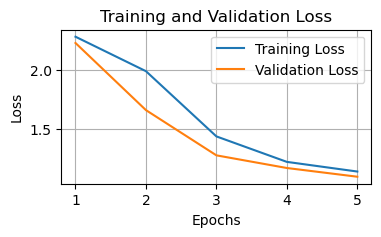

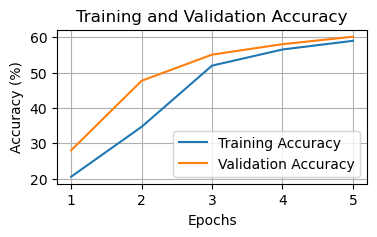

Test Accuracy: 60.74%

Training with batch size=64, learning rate=0.01, layers=3, neurons=256
Model Number 104 Performance:
  Training Loss: 1.0229
  Validation Loss: 1.0045
  Training Accuracy: 62.81%
  Validation Accuracy: 63.28%


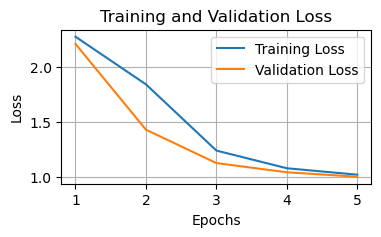

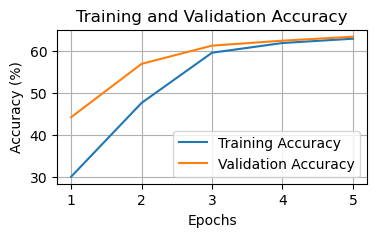

Test Accuracy: 62.95%

Training with batch size=64, learning rate=0.01, layers=4, neurons=32
Model Number 105 Performance:
  Training Loss: 2.1909
  Validation Loss: 2.1093
  Training Accuracy: 22.68%
  Validation Accuracy: 24.72%


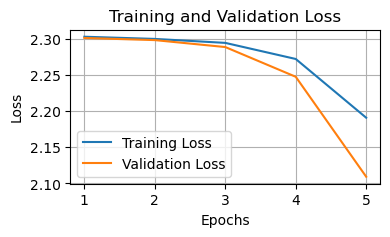

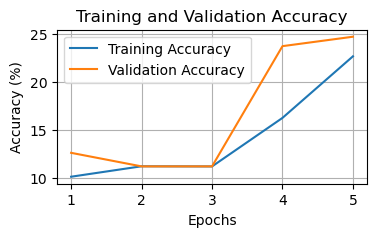

Test Accuracy: 25.65%

Training with batch size=64, learning rate=0.01, layers=4, neurons=64
Model Number 106 Performance:
  Training Loss: 1.9721
  Validation Loss: 1.8508
  Training Accuracy: 26.23%
  Validation Accuracy: 31.99%


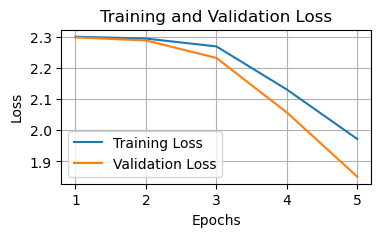

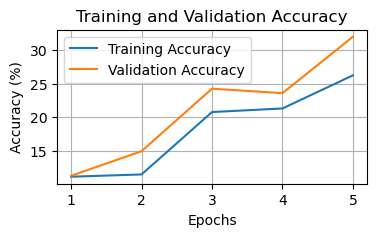

Test Accuracy: 32.84%

Training with batch size=64, learning rate=0.01, layers=4, neurons=128
Model Number 107 Performance:
  Training Loss: 1.4866
  Validation Loss: 1.3943
  Training Accuracy: 50.50%
  Validation Accuracy: 53.39%


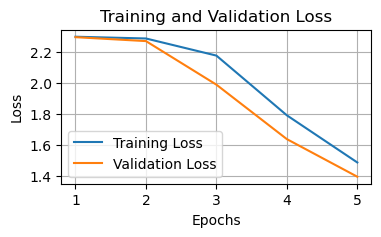

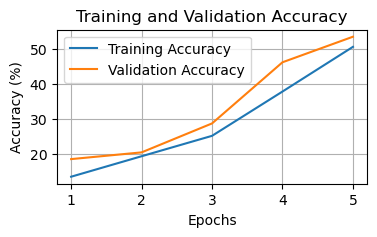

Test Accuracy: 53.58%

Training with batch size=64, learning rate=0.01, layers=4, neurons=256
Model Number 108 Performance:
  Training Loss: 2.3026
  Validation Loss: 2.3026
  Training Accuracy: 9.87%
  Validation Accuracy: 9.87%


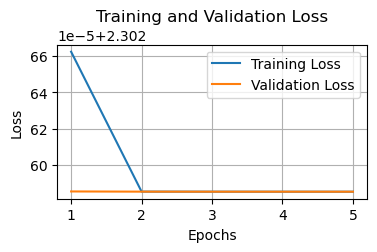

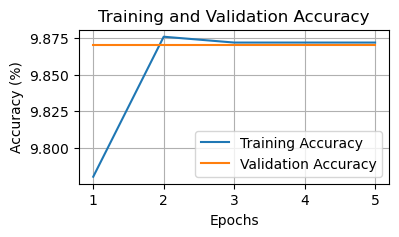

Test Accuracy: 9.80%

Training with batch size=64, learning rate=0.01, layers=5, neurons=32
Model Number 109 Performance:
  Training Loss: 2.3021
  Validation Loss: 2.3020
  Training Accuracy: 10.44%
  Validation Accuracy: 10.44%


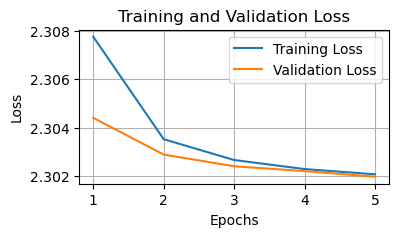

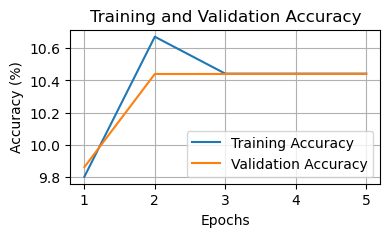

Test Accuracy: 10.28%

Training with batch size=64, learning rate=0.01, layers=5, neurons=64
Model Number 110 Performance:
  Training Loss: 2.3009
  Validation Loss: 2.2999
  Training Accuracy: 15.57%
  Validation Accuracy: 18.27%


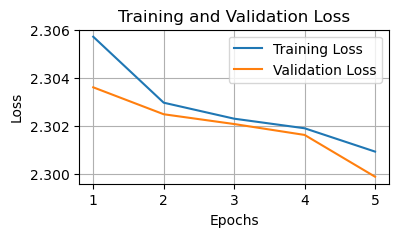

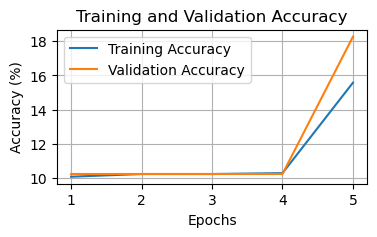

Test Accuracy: 17.90%

Training with batch size=64, learning rate=0.01, layers=5, neurons=128
Model Number 111 Performance:
  Training Loss: 2.3021
  Validation Loss: 2.3019
  Training Accuracy: 14.70%
  Validation Accuracy: 18.36%


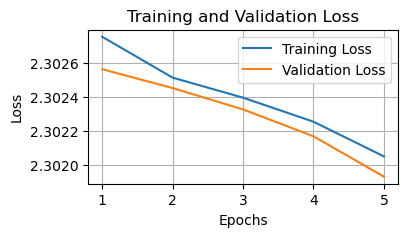

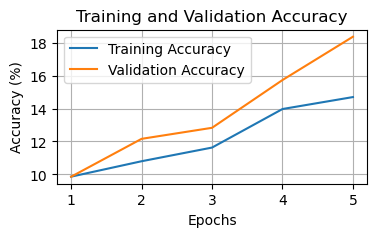

Test Accuracy: 18.27%

Training with batch size=64, learning rate=0.01, layers=5, neurons=256
Model Number 112 Performance:
  Training Loss: 2.2595
  Validation Loss: 2.1961
  Training Accuracy: 23.17%
  Validation Accuracy: 25.70%


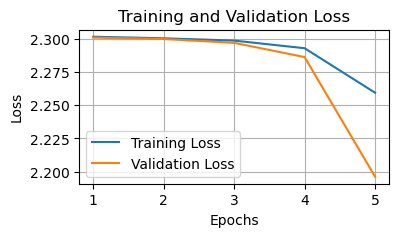

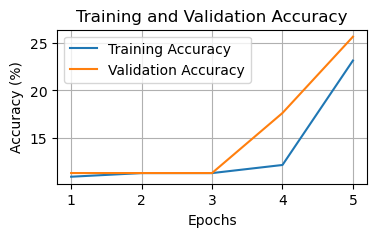

Test Accuracy: 26.37%

Training with batch size=64, learning rate=0.1, layers=2, neurons=32
Model Number 113 Performance:
  Training Loss: 0.8651
  Validation Loss: 0.8722
  Training Accuracy: 73.95%
  Validation Accuracy: 74.25%


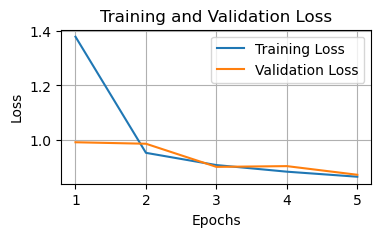

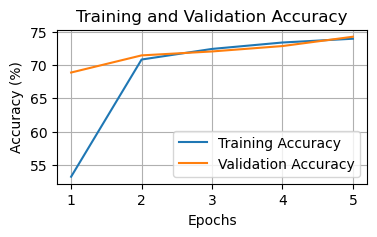

Test Accuracy: 74.98%

Training with batch size=64, learning rate=0.1, layers=2, neurons=64
Model Number 114 Performance:
  Training Loss: 0.5907
  Validation Loss: 0.6167
  Training Accuracy: 77.14%
  Validation Accuracy: 76.32%


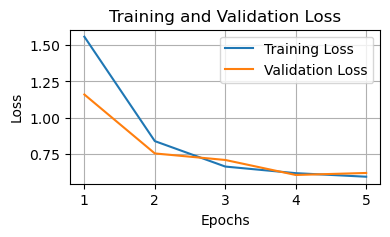

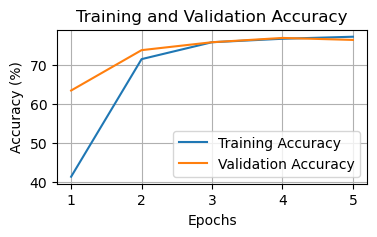

Test Accuracy: 76.60%

Training with batch size=64, learning rate=0.1, layers=2, neurons=128
Model Number 115 Performance:
  Training Loss: 0.1043
  Validation Loss: 0.1801
  Training Accuracy: 96.87%
  Validation Accuracy: 94.47%


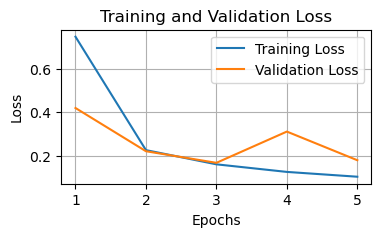

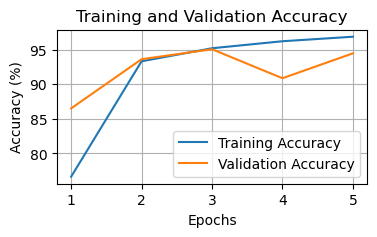

Test Accuracy: 94.91%

Training with batch size=64, learning rate=0.1, layers=2, neurons=256
Model Number 116 Performance:
  Training Loss: 0.5549
  Validation Loss: 0.6552
  Training Accuracy: 78.23%
  Validation Accuracy: 75.00%


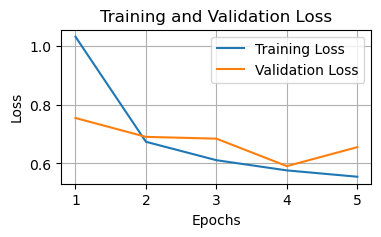

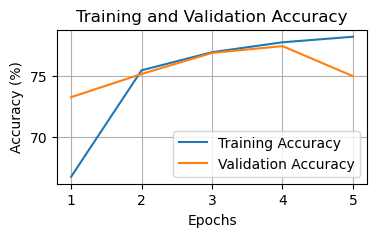

Test Accuracy: 74.70%

Training with batch size=64, learning rate=0.1, layers=3, neurons=32
Model Number 117 Performance:
  Training Loss: 0.8520
  Validation Loss: 0.8699
  Training Accuracy: 75.31%
  Validation Accuracy: 74.78%


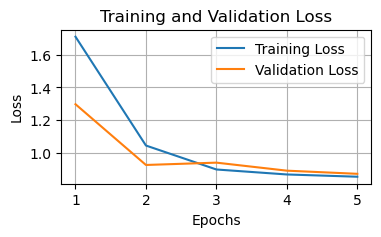

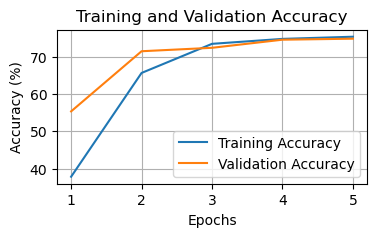

Test Accuracy: 75.35%

Training with batch size=64, learning rate=0.1, layers=3, neurons=64
Model Number 118 Performance:
  Training Loss: 0.8092
  Validation Loss: 0.8337
  Training Accuracy: 67.96%
  Validation Accuracy: 67.50%


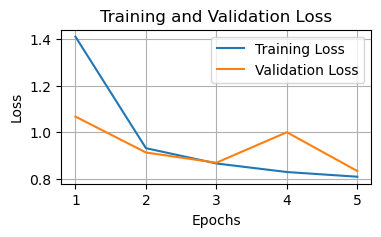

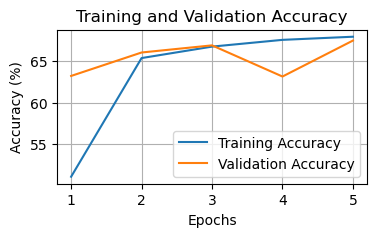

Test Accuracy: 67.72%

Training with batch size=64, learning rate=0.1, layers=3, neurons=128
Model Number 119 Performance:
  Training Loss: 1.0153
  Validation Loss: 1.0369
  Training Accuracy: 58.31%
  Validation Accuracy: 57.57%


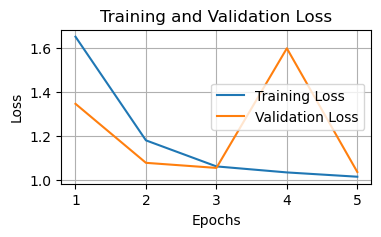

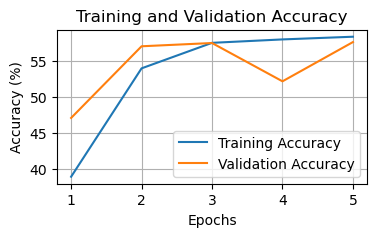

Test Accuracy: 57.39%

Training with batch size=64, learning rate=0.1, layers=3, neurons=256
Model Number 120 Performance:
  Training Loss: 0.5458
  Validation Loss: 0.5830
  Training Accuracy: 87.31%
  Validation Accuracy: 87.04%


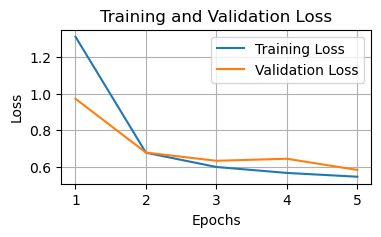

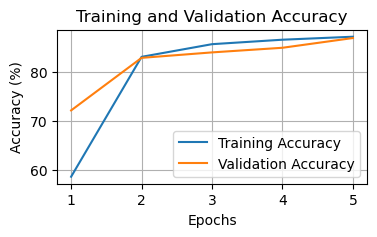

Test Accuracy: 86.98%

Training with batch size=64, learning rate=0.1, layers=4, neurons=32
Model Number 121 Performance:
  Training Loss: 0.5668
  Validation Loss: 0.5922
  Training Accuracy: 85.61%
  Validation Accuracy: 88.24%


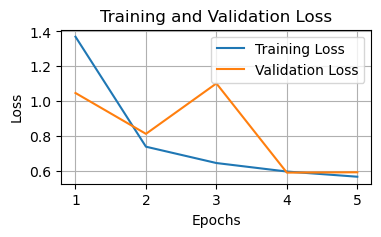

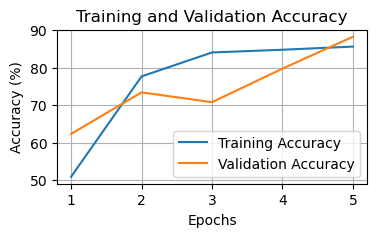

Test Accuracy: 88.67%

Training with batch size=64, learning rate=0.1, layers=4, neurons=64
Model Number 122 Performance:
  Training Loss: 0.2407
  Validation Loss: 0.2699
  Training Accuracy: 93.21%
  Validation Accuracy: 92.77%


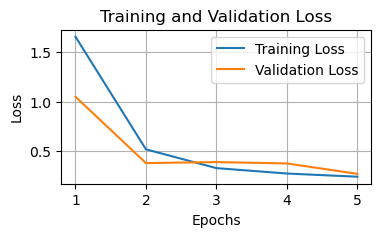

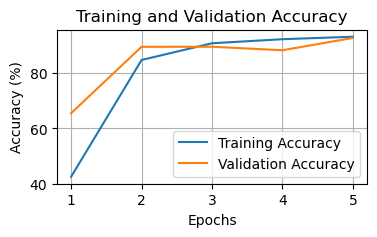

Test Accuracy: 92.68%

Training with batch size=64, learning rate=0.1, layers=4, neurons=128
Model Number 123 Performance:
  Training Loss: 0.3686
  Validation Loss: 0.3736
  Training Accuracy: 87.10%
  Validation Accuracy: 87.05%


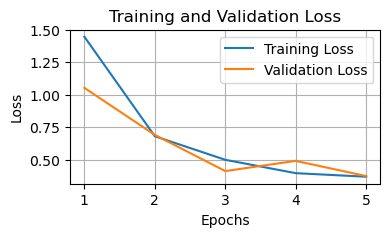

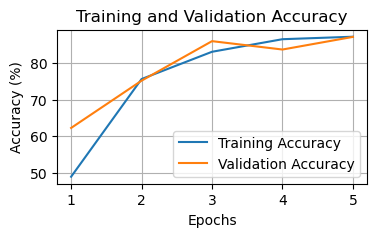

Test Accuracy: 87.14%

Training with batch size=64, learning rate=0.1, layers=4, neurons=256
Model Number 124 Performance:
  Training Loss: 0.7625
  Validation Loss: 0.8358
  Training Accuracy: 77.81%
  Validation Accuracy: 76.03%


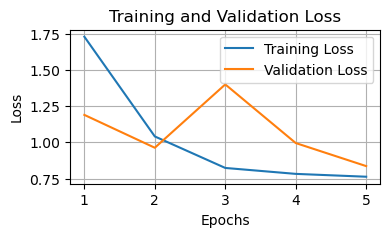

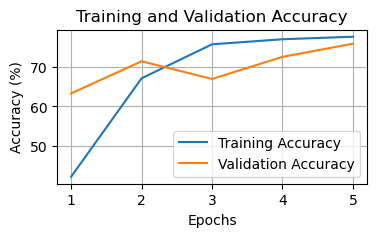

Test Accuracy: 76.13%

Training with batch size=64, learning rate=0.1, layers=5, neurons=32
Model Number 125 Performance:
  Training Loss: 1.0442
  Validation Loss: 1.0293
  Training Accuracy: 60.82%
  Validation Accuracy: 62.02%


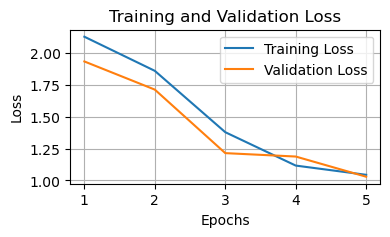

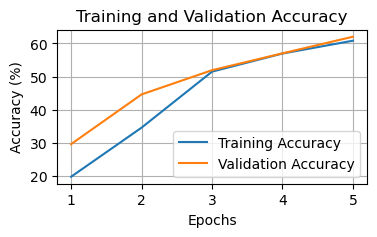

Test Accuracy: 61.90%

Training with batch size=64, learning rate=0.1, layers=5, neurons=64
Model Number 126 Performance:
  Training Loss: 0.4565
  Validation Loss: 0.4632
  Training Accuracy: 84.91%
  Validation Accuracy: 84.83%


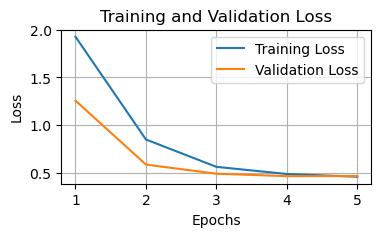

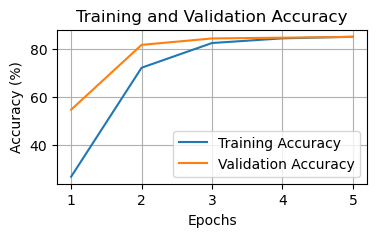

Test Accuracy: 85.07%

Training with batch size=64, learning rate=0.1, layers=5, neurons=128
Model Number 127 Performance:
  Training Loss: 0.6332
  Validation Loss: 0.6390
  Training Accuracy: 76.32%
  Validation Accuracy: 76.47%


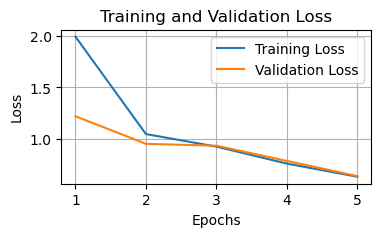

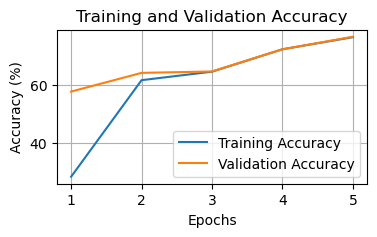

Test Accuracy: 76.27%

Training with batch size=64, learning rate=0.1, layers=5, neurons=256
Model Number 128 Performance:
  Training Loss: 0.1515
  Validation Loss: 0.2956
  Training Accuracy: 95.84%
  Validation Accuracy: 92.18%


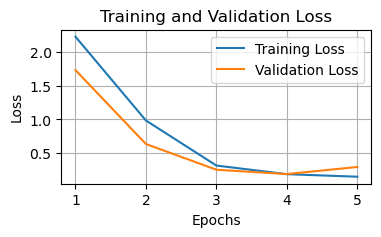

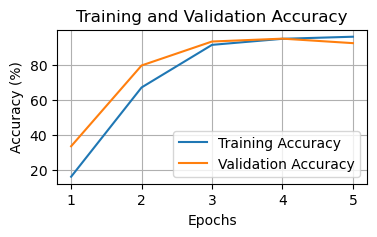

Test Accuracy: 92.52%

Training with batch size=128, learning rate=0.0001, layers=2, neurons=32
Model Number 129 Performance:
  Training Loss: 2.3122
  Validation Loss: 2.3118
  Training Accuracy: 9.75%
  Validation Accuracy: 9.75%


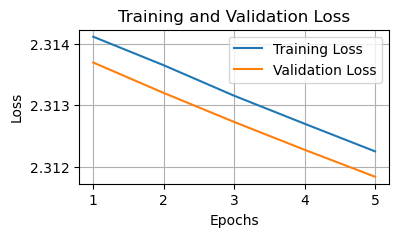

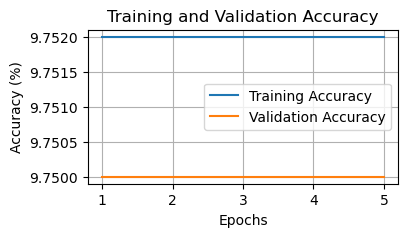

Test Accuracy: 9.74%

Training with batch size=128, learning rate=0.0001, layers=2, neurons=64
Model Number 130 Performance:
  Training Loss: 2.3041
  Validation Loss: 2.3039
  Training Accuracy: 12.65%
  Validation Accuracy: 12.91%


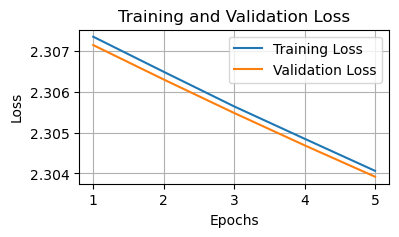

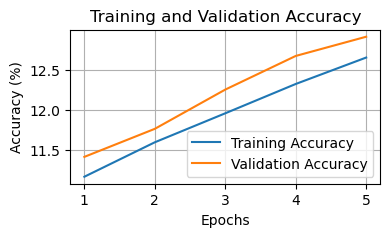

Test Accuracy: 12.29%

Training with batch size=128, learning rate=0.0001, layers=2, neurons=128
Model Number 131 Performance:
  Training Loss: 2.3006
  Validation Loss: 2.3004
  Training Accuracy: 9.70%
  Validation Accuracy: 10.05%


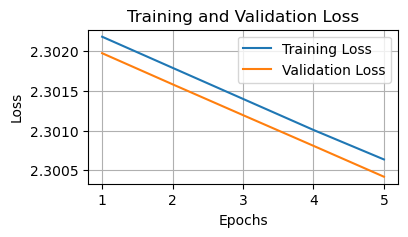

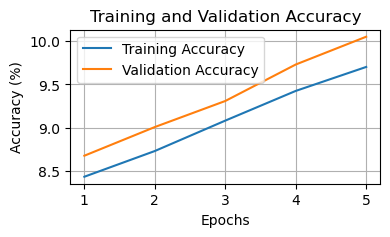

Test Accuracy: 9.70%

Training with batch size=128, learning rate=0.0001, layers=2, neurons=256
Model Number 132 Performance:
  Training Loss: 2.3023
  Validation Loss: 2.3022
  Training Accuracy: 12.04%
  Validation Accuracy: 11.97%


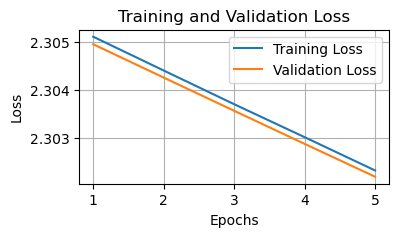

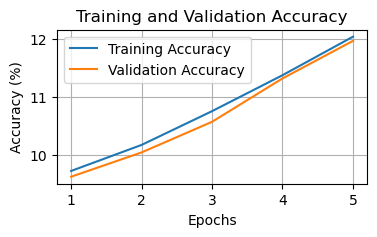

Test Accuracy: 12.35%

Training with batch size=128, learning rate=0.0001, layers=3, neurons=32
Model Number 133 Performance:
  Training Loss: 2.3064
  Validation Loss: 2.3062
  Training Accuracy: 9.92%
  Validation Accuracy: 9.90%


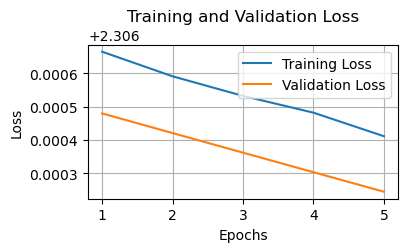

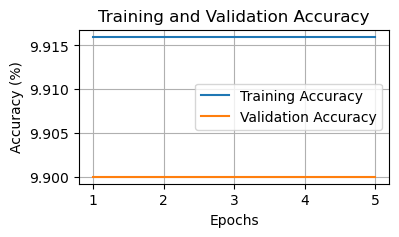

Test Accuracy: 10.27%

Training with batch size=128, learning rate=0.0001, layers=3, neurons=64
Model Number 134 Performance:
  Training Loss: 2.3034
  Validation Loss: 2.3034
  Training Accuracy: 9.86%
  Validation Accuracy: 9.86%


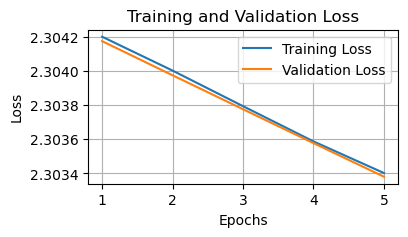

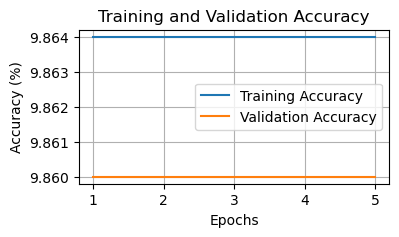

Test Accuracy: 9.58%

Training with batch size=128, learning rate=0.0001, layers=3, neurons=128
Model Number 135 Performance:
  Training Loss: 2.3048
  Validation Loss: 2.3047
  Training Accuracy: 10.75%
  Validation Accuracy: 10.75%


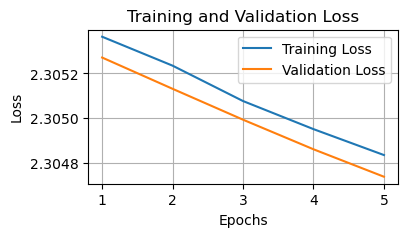

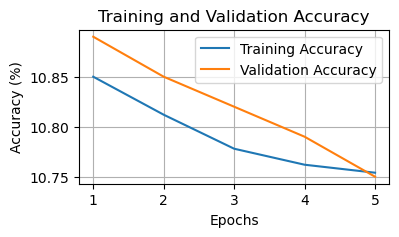

Test Accuracy: 10.46%

Training with batch size=128, learning rate=0.0001, layers=3, neurons=256
Model Number 136 Performance:
  Training Loss: 2.3031
  Validation Loss: 2.3031
  Training Accuracy: 11.48%
  Validation Accuracy: 11.93%


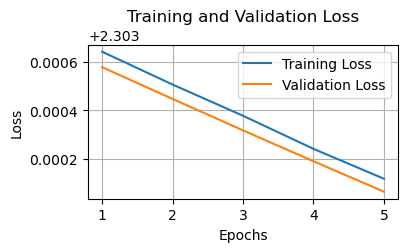

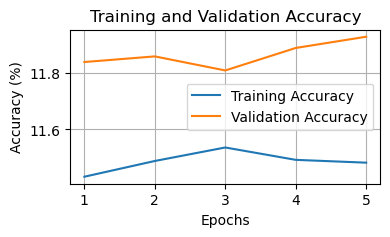

Test Accuracy: 11.90%

Training with batch size=128, learning rate=0.0001, layers=4, neurons=32
Model Number 137 Performance:
  Training Loss: 2.3103
  Validation Loss: 2.3105
  Training Accuracy: 9.75%
  Validation Accuracy: 9.75%


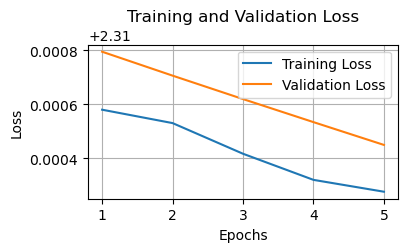

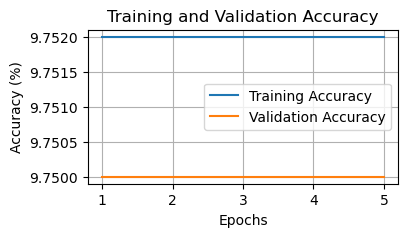

Test Accuracy: 9.74%

Training with batch size=128, learning rate=0.0001, layers=4, neurons=64
Model Number 138 Performance:
  Training Loss: 2.3042
  Validation Loss: 2.3043
  Training Accuracy: 9.93%
  Validation Accuracy: 9.93%


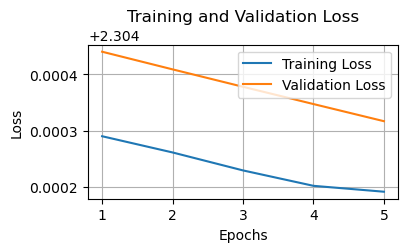

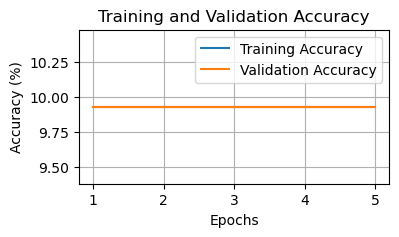

Test Accuracy: 10.32%

Training with batch size=128, learning rate=0.0001, layers=4, neurons=128
Model Number 139 Performance:
  Training Loss: 2.3026
  Validation Loss: 2.3025
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


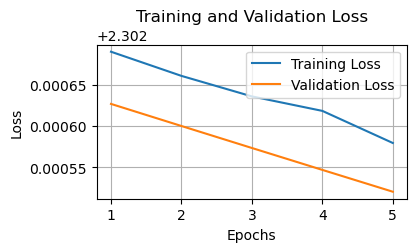

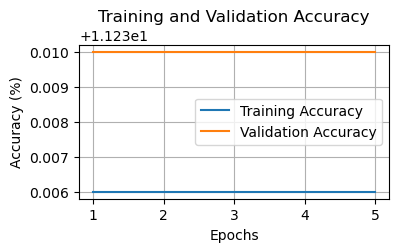

Test Accuracy: 11.35%

Training with batch size=128, learning rate=0.0001, layers=4, neurons=256
Model Number 140 Performance:
  Training Loss: 2.3025
  Validation Loss: 2.3026
  Training Accuracy: 9.91%
  Validation Accuracy: 9.92%


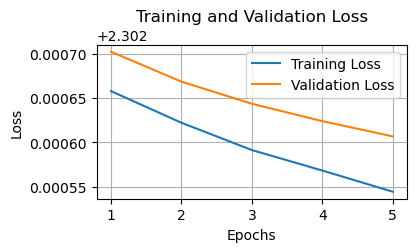

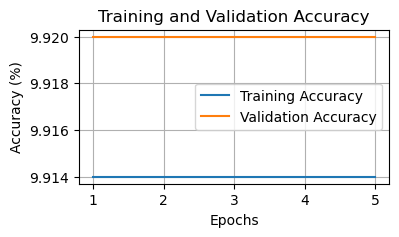

Test Accuracy: 10.09%

Training with batch size=128, learning rate=0.0001, layers=5, neurons=32
Model Number 141 Performance:
  Training Loss: 2.3138
  Validation Loss: 2.3136
  Training Accuracy: 9.04%
  Validation Accuracy: 9.03%


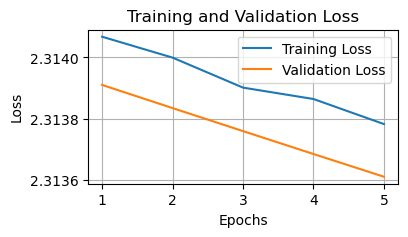

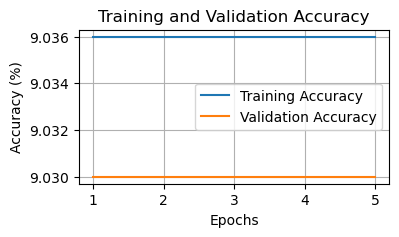

Test Accuracy: 8.92%

Training with batch size=128, learning rate=0.0001, layers=5, neurons=64
Model Number 142 Performance:
  Training Loss: 2.3033
  Validation Loss: 2.3033
  Training Accuracy: 10.22%
  Validation Accuracy: 10.22%


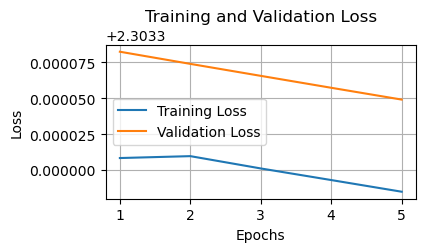

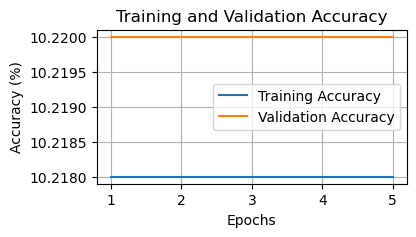

Test Accuracy: 10.10%

Training with batch size=128, learning rate=0.0001, layers=5, neurons=128
Model Number 143 Performance:
  Training Loss: 2.3043
  Validation Loss: 2.3044
  Training Accuracy: 10.44%
  Validation Accuracy: 10.44%


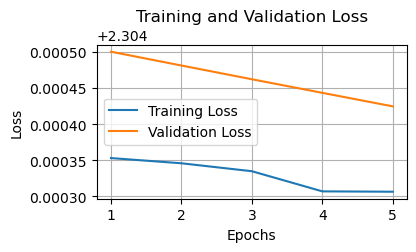

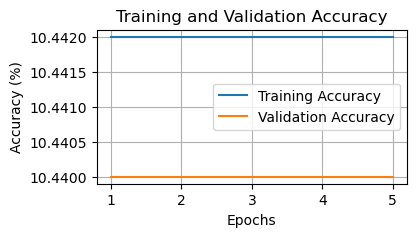

Test Accuracy: 10.28%

Training with batch size=128, learning rate=0.0001, layers=5, neurons=256
Model Number 144 Performance:
  Training Loss: 2.3027
  Validation Loss: 2.3027
  Training Accuracy: 12.47%
  Validation Accuracy: 12.97%


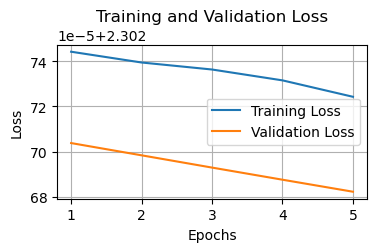

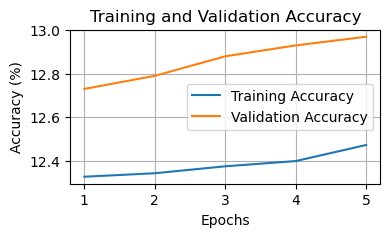

Test Accuracy: 12.69%

Training with batch size=128, learning rate=0.001, layers=2, neurons=32
Model Number 145 Performance:
  Training Loss: 2.2817
  Validation Loss: 2.2796
  Training Accuracy: 14.44%
  Validation Accuracy: 15.57%


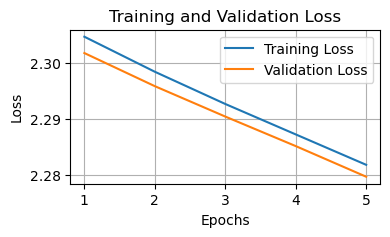

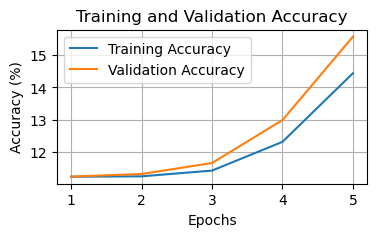

Test Accuracy: 16.37%

Training with batch size=128, learning rate=0.001, layers=2, neurons=64
Model Number 146 Performance:
  Training Loss: 2.2811
  Validation Loss: 2.2785
  Training Accuracy: 22.45%
  Validation Accuracy: 23.57%


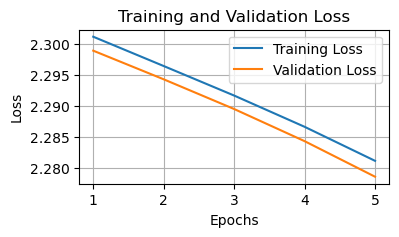

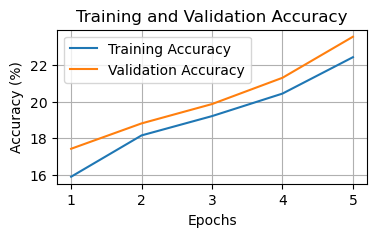

Test Accuracy: 23.74%

Training with batch size=128, learning rate=0.001, layers=2, neurons=128
Model Number 147 Performance:
  Training Loss: 2.2727
  Validation Loss: 2.2685
  Training Accuracy: 15.73%
  Validation Accuracy: 18.71%


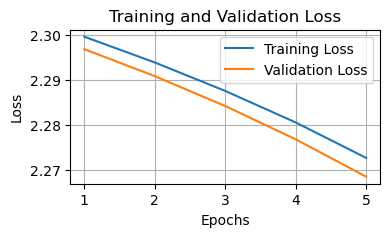

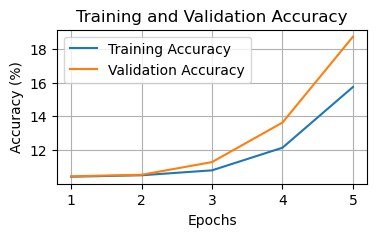

Test Accuracy: 19.26%

Training with batch size=128, learning rate=0.001, layers=2, neurons=256
Model Number 148 Performance:
  Training Loss: 2.2661
  Validation Loss: 2.2599
  Training Accuracy: 25.48%
  Validation Accuracy: 29.47%


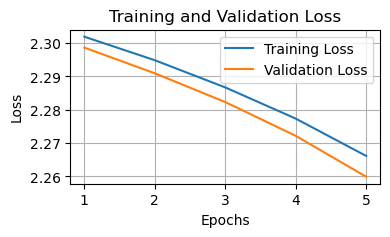

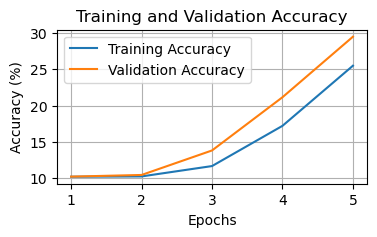

Test Accuracy: 29.30%

Training with batch size=128, learning rate=0.001, layers=3, neurons=32
Model Number 149 Performance:
  Training Loss: 2.3016
  Validation Loss: 2.3013
  Training Accuracy: 9.77%
  Validation Accuracy: 9.78%


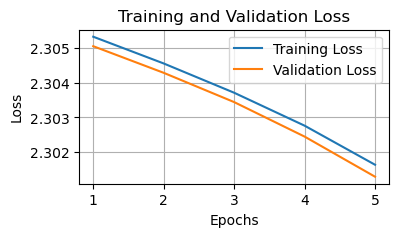

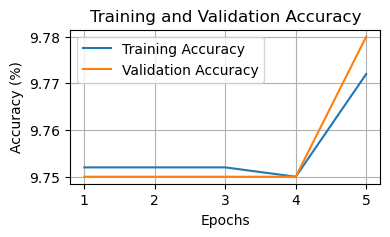

Test Accuracy: 9.75%

Training with batch size=128, learning rate=0.001, layers=3, neurons=64
Model Number 150 Performance:
  Training Loss: 2.3012
  Validation Loss: 2.3009
  Training Accuracy: 9.75%
  Validation Accuracy: 9.76%


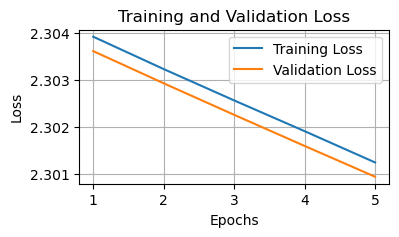

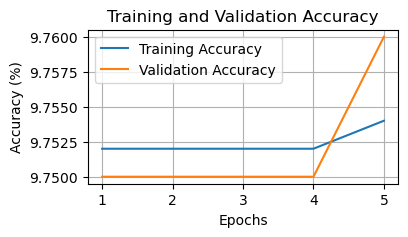

Test Accuracy: 9.74%

Training with batch size=128, learning rate=0.001, layers=3, neurons=128
Model Number 151 Performance:
  Training Loss: 2.3019
  Validation Loss: 2.3017
  Training Accuracy: 9.91%
  Validation Accuracy: 10.09%


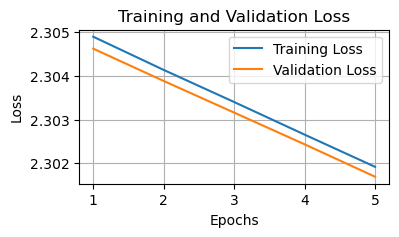

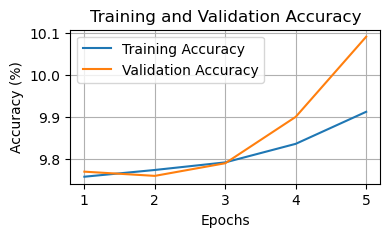

Test Accuracy: 10.08%

Training with batch size=128, learning rate=0.001, layers=3, neurons=256
Model Number 152 Performance:
  Training Loss: 2.3001
  Validation Loss: 2.3001
  Training Accuracy: 10.44%
  Validation Accuracy: 10.44%


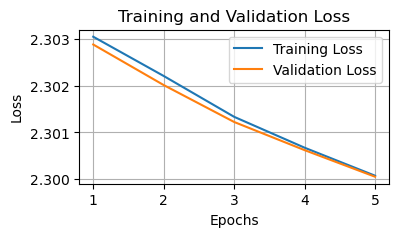

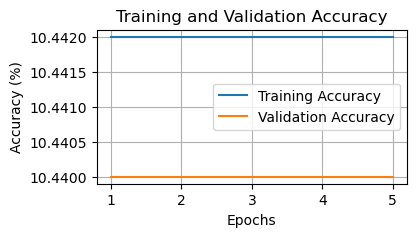

Test Accuracy: 10.28%

Training with batch size=128, learning rate=0.001, layers=4, neurons=32
Model Number 153 Performance:
  Training Loss: 2.3082
  Validation Loss: 2.3077
  Training Accuracy: 9.93%
  Validation Accuracy: 9.93%


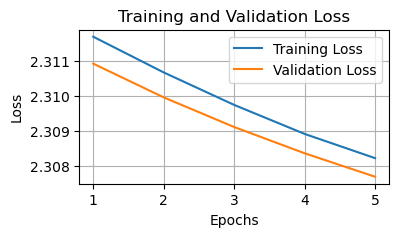

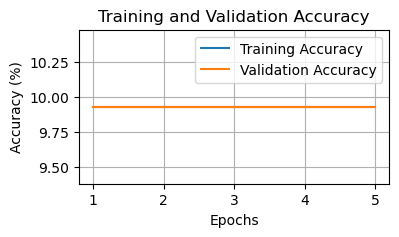

Test Accuracy: 10.32%

Training with batch size=128, learning rate=0.001, layers=4, neurons=64
Model Number 154 Performance:
  Training Loss: 2.3052
  Validation Loss: 2.3048
  Training Accuracy: 9.74%
  Validation Accuracy: 9.74%


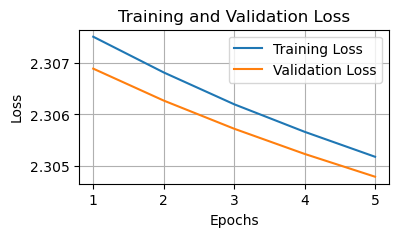

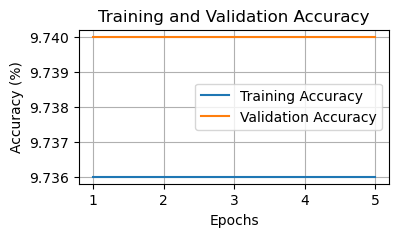

Test Accuracy: 9.82%

Training with batch size=128, learning rate=0.001, layers=4, neurons=128
Model Number 155 Performance:
  Training Loss: 2.3034
  Validation Loss: 2.3034
  Training Accuracy: 10.93%
  Validation Accuracy: 10.55%


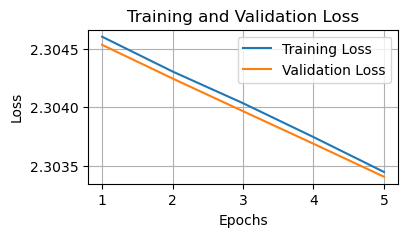

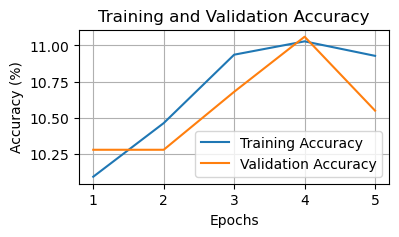

Test Accuracy: 10.62%

Training with batch size=128, learning rate=0.001, layers=4, neurons=256
Model Number 156 Performance:
  Training Loss: 2.3025
  Validation Loss: 2.3023
  Training Accuracy: 12.09%
  Validation Accuracy: 12.40%


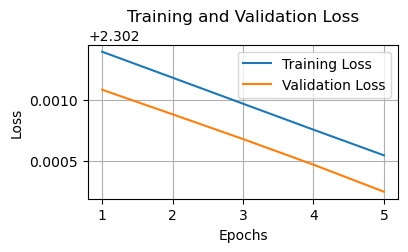

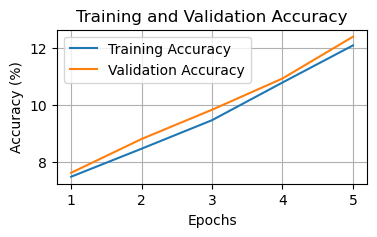

Test Accuracy: 12.11%

Training with batch size=128, learning rate=0.001, layers=5, neurons=32
Model Number 157 Performance:
  Training Loss: 2.3077
  Validation Loss: 2.3075
  Training Accuracy: 12.06%
  Validation Accuracy: 11.24%


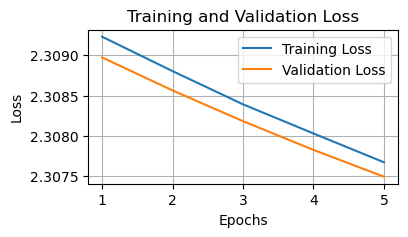

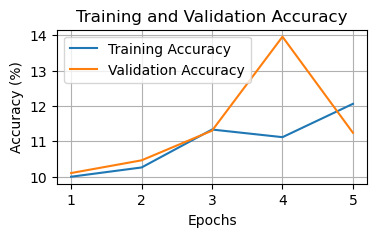

Test Accuracy: 11.35%

Training with batch size=128, learning rate=0.001, layers=5, neurons=64
Model Number 158 Performance:
  Training Loss: 2.3054
  Validation Loss: 2.3052
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


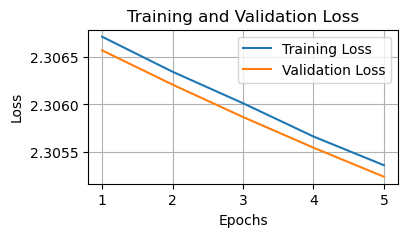

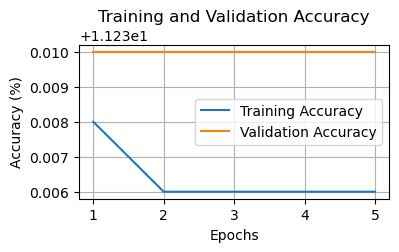

Test Accuracy: 11.35%

Training with batch size=128, learning rate=0.001, layers=5, neurons=128
Model Number 159 Performance:
  Training Loss: 2.3066
  Validation Loss: 2.3066
  Training Accuracy: 8.19%
  Validation Accuracy: 7.24%


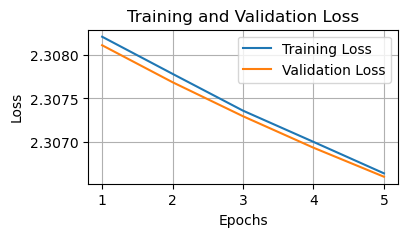

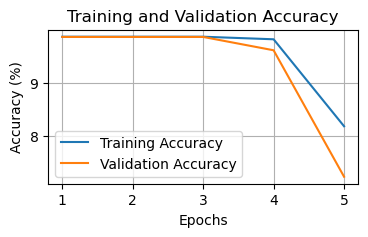

Test Accuracy: 7.30%

Training with batch size=128, learning rate=0.001, layers=5, neurons=256
Model Number 160 Performance:
  Training Loss: 2.3015
  Validation Loss: 2.3015
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


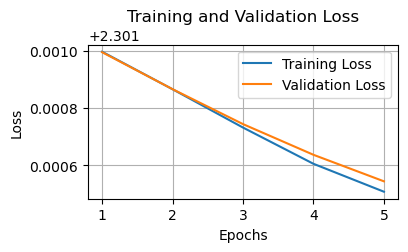

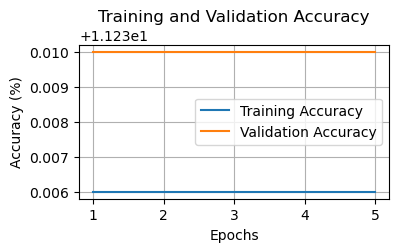

Test Accuracy: 11.35%

Training with batch size=128, learning rate=0.01, layers=2, neurons=32
Model Number 161 Performance:
  Training Loss: 1.5173
  Validation Loss: 1.4534
  Training Accuracy: 53.04%
  Validation Accuracy: 53.44%


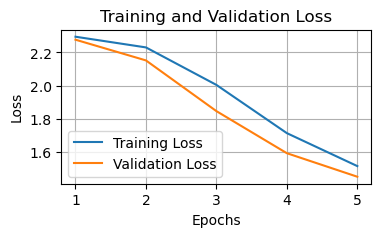

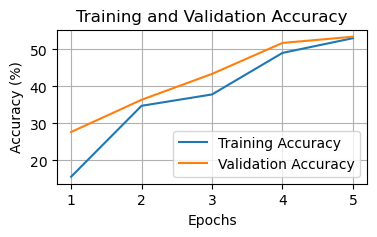

Test Accuracy: 54.41%

Training with batch size=128, learning rate=0.01, layers=2, neurons=64
Model Number 162 Performance:
  Training Loss: 0.9935
  Validation Loss: 0.9464
  Training Accuracy: 68.92%
  Validation Accuracy: 69.67%


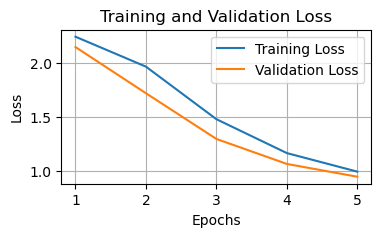

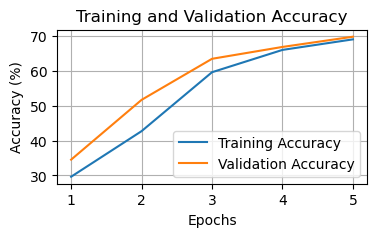

Test Accuracy: 70.67%

Training with batch size=128, learning rate=0.01, layers=2, neurons=128
Model Number 163 Performance:
  Training Loss: 1.0115
  Validation Loss: 0.9560
  Training Accuracy: 67.93%
  Validation Accuracy: 68.96%


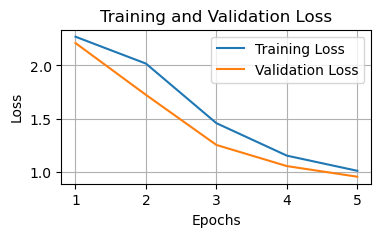

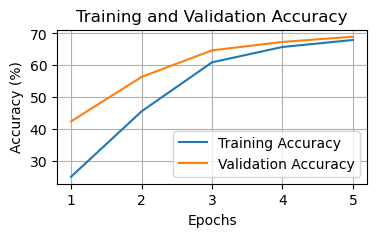

Test Accuracy: 68.83%

Training with batch size=128, learning rate=0.01, layers=2, neurons=256
Model Number 164 Performance:
  Training Loss: 1.0336
  Validation Loss: 0.9672
  Training Accuracy: 68.08%
  Validation Accuracy: 70.14%


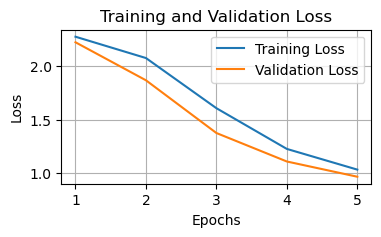

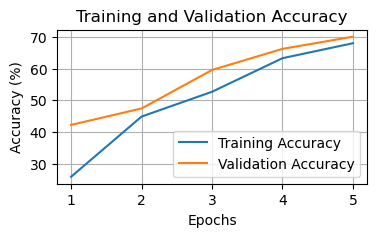

Test Accuracy: 70.88%

Training with batch size=128, learning rate=0.01, layers=3, neurons=32
Model Number 165 Performance:
  Training Loss: 1.4314
  Validation Loss: 1.3068
  Training Accuracy: 62.80%
  Validation Accuracy: 64.97%


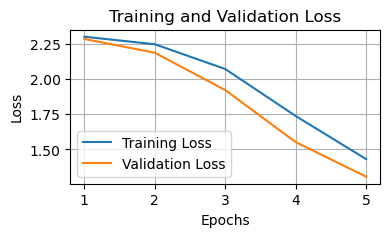

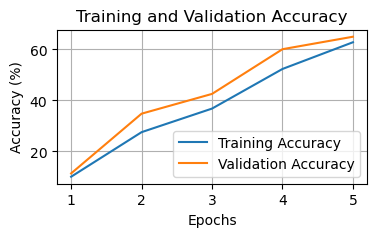

Test Accuracy: 65.35%

Training with batch size=128, learning rate=0.01, layers=3, neurons=64
Model Number 166 Performance:
  Training Loss: 1.3591
  Validation Loss: 1.2045
  Training Accuracy: 59.04%
  Validation Accuracy: 61.77%


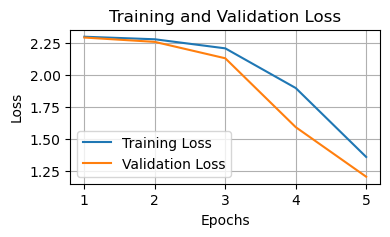

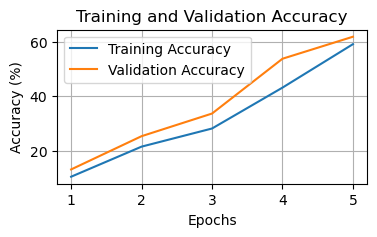

Test Accuracy: 62.00%

Training with batch size=128, learning rate=0.01, layers=3, neurons=128
Model Number 167 Performance:
  Training Loss: 1.6396
  Validation Loss: 1.4795
  Training Accuracy: 49.25%
  Validation Accuracy: 55.33%


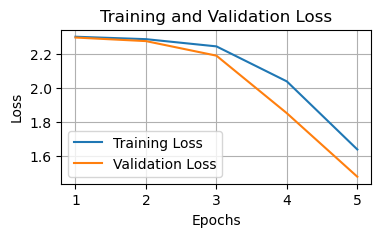

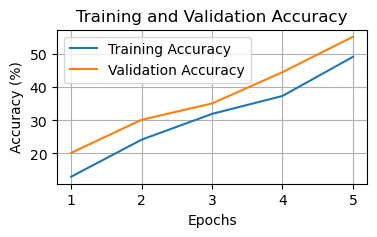

Test Accuracy: 55.05%

Training with batch size=128, learning rate=0.01, layers=3, neurons=256
Model Number 168 Performance:
  Training Loss: 1.4725
  Validation Loss: 1.2788
  Training Accuracy: 59.34%
  Validation Accuracy: 65.03%


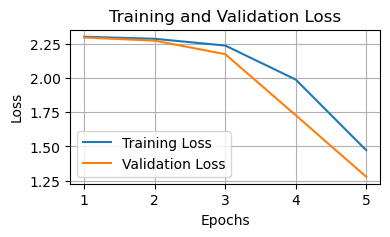

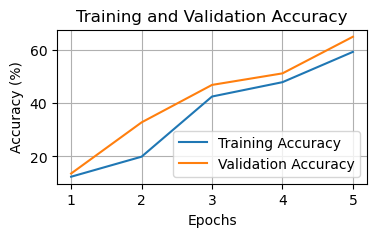

Test Accuracy: 65.43%

Training with batch size=128, learning rate=0.01, layers=4, neurons=32
Model Number 169 Performance:
  Training Loss: 2.3016
  Validation Loss: 2.3015
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


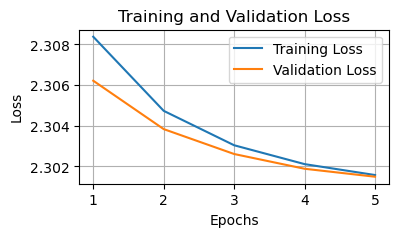

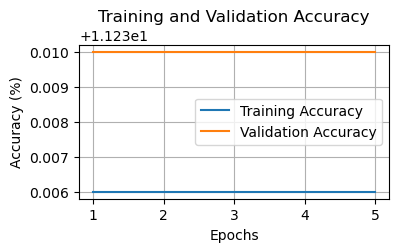

Test Accuracy: 11.35%

Training with batch size=128, learning rate=0.01, layers=4, neurons=64
Model Number 170 Performance:
  Training Loss: 2.2962
  Validation Loss: 2.2932
  Training Accuracy: 19.39%
  Validation Accuracy: 19.73%


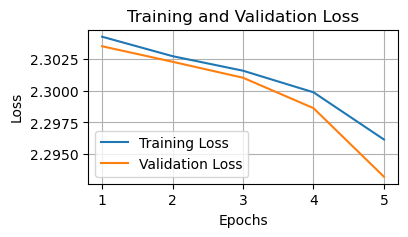

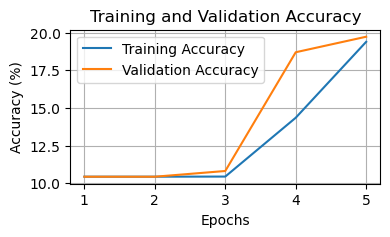

Test Accuracy: 19.41%

Training with batch size=128, learning rate=0.01, layers=4, neurons=128
Model Number 171 Performance:
  Training Loss: 2.2805
  Validation Loss: 2.2697
  Training Accuracy: 19.78%
  Validation Accuracy: 22.87%


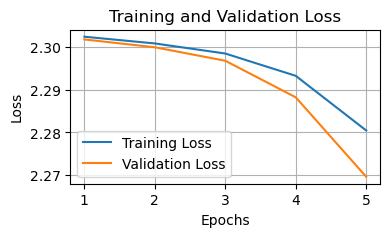

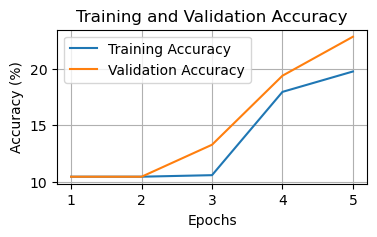

Test Accuracy: 23.25%

Training with batch size=128, learning rate=0.01, layers=4, neurons=256
Model Number 172 Performance:
  Training Loss: 2.2854
  Validation Loss: 2.2777
  Training Accuracy: 26.77%
  Validation Accuracy: 27.29%


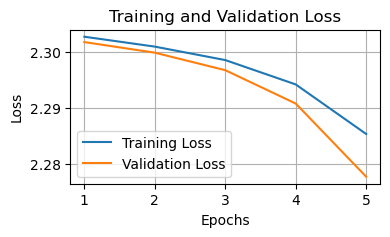

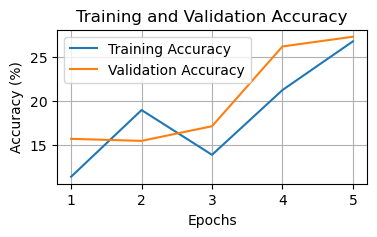

Test Accuracy: 26.82%

Training with batch size=128, learning rate=0.01, layers=5, neurons=32
Model Number 173 Performance:
  Training Loss: 2.2787
  Validation Loss: 2.2650
  Training Accuracy: 19.45%
  Validation Accuracy: 19.40%


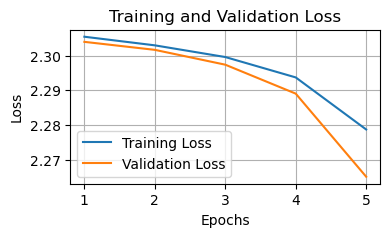

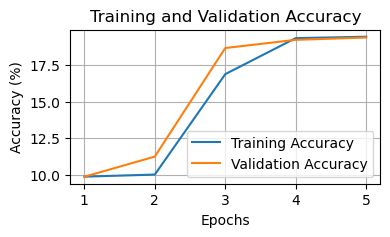

Test Accuracy: 19.59%

Training with batch size=128, learning rate=0.01, layers=5, neurons=64
Model Number 174 Performance:
  Training Loss: 2.3006
  Validation Loss: 2.2999
  Training Accuracy: 10.44%
  Validation Accuracy: 10.44%


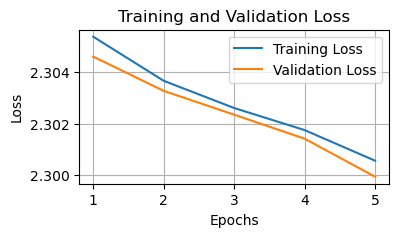

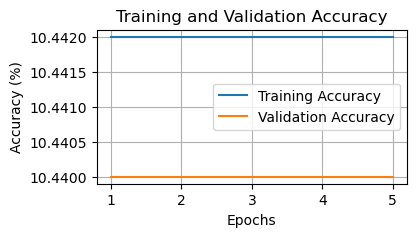

Test Accuracy: 10.28%

Training with batch size=128, learning rate=0.01, layers=5, neurons=128
Model Number 175 Performance:
  Training Loss: 2.3012
  Validation Loss: 2.3009
  Training Accuracy: 10.44%
  Validation Accuracy: 10.44%


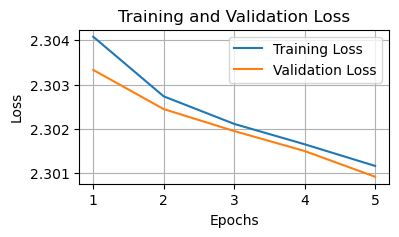

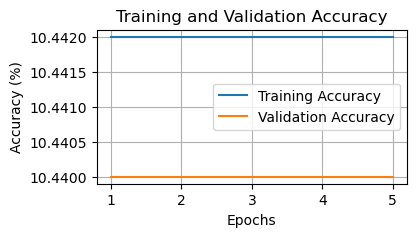

Test Accuracy: 10.28%

Training with batch size=128, learning rate=0.01, layers=5, neurons=256
Model Number 176 Performance:
  Training Loss: 2.3009
  Validation Loss: 2.3006
  Training Accuracy: 10.22%
  Validation Accuracy: 10.22%


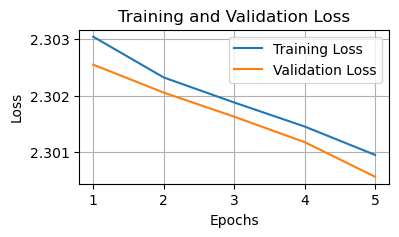

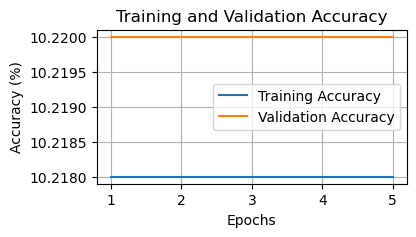

Test Accuracy: 10.10%

Training with batch size=128, learning rate=0.1, layers=2, neurons=32
Model Number 177 Performance:
  Training Loss: 0.2233
  Validation Loss: 0.2265
  Training Accuracy: 93.58%
  Validation Accuracy: 93.29%


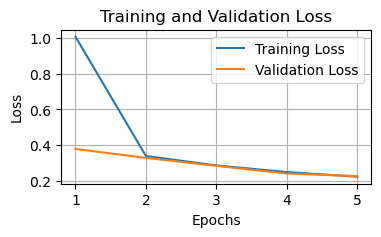

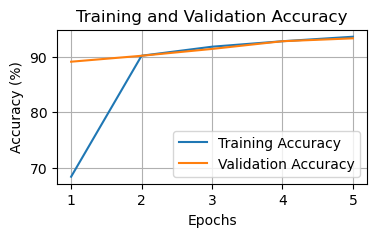

Test Accuracy: 93.68%

Training with batch size=128, learning rate=0.1, layers=2, neurons=64
Model Number 178 Performance:
  Training Loss: 0.4287
  Validation Loss: 0.4282
  Training Accuracy: 85.11%
  Validation Accuracy: 85.16%


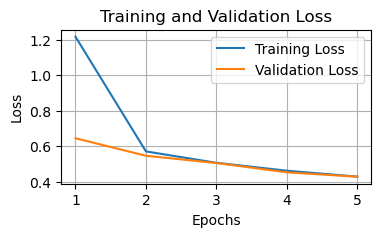

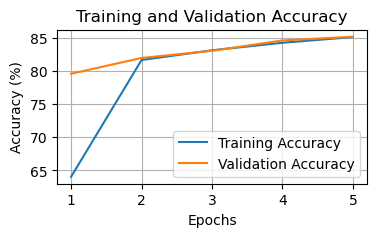

Test Accuracy: 85.34%

Training with batch size=128, learning rate=0.1, layers=2, neurons=128
Model Number 179 Performance:
  Training Loss: 0.6036
  Validation Loss: 0.6107
  Training Accuracy: 77.88%
  Validation Accuracy: 77.42%


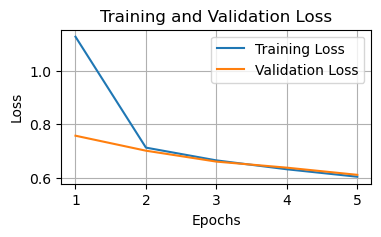

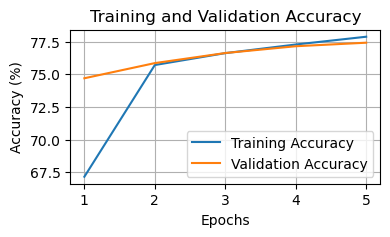

Test Accuracy: 77.73%

Training with batch size=128, learning rate=0.1, layers=2, neurons=256
Model Number 180 Performance:
  Training Loss: 0.8093
  Validation Loss: 0.8166
  Training Accuracy: 68.42%
  Validation Accuracy: 68.25%


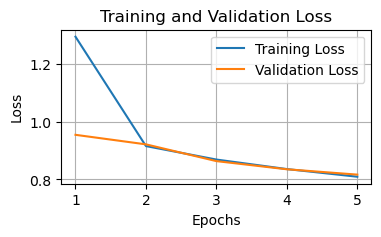

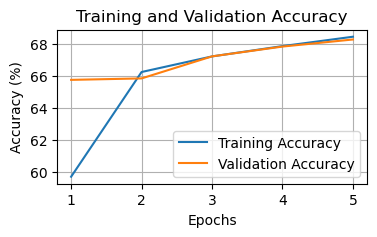

Test Accuracy: 68.72%

Training with batch size=128, learning rate=0.1, layers=3, neurons=32
Model Number 181 Performance:
  Training Loss: 0.5102
  Validation Loss: 0.5054
  Training Accuracy: 82.80%
  Validation Accuracy: 83.07%


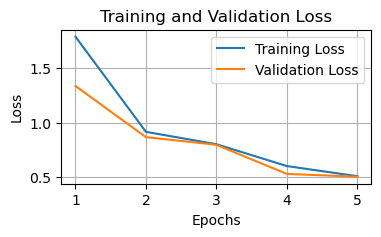

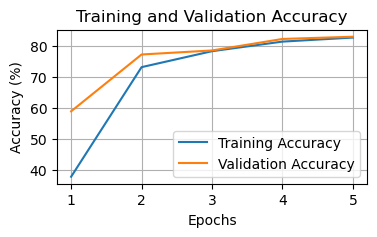

Test Accuracy: 83.32%

Training with batch size=128, learning rate=0.1, layers=3, neurons=64
Model Number 182 Performance:
  Training Loss: 0.4571
  Validation Loss: 0.4424
  Training Accuracy: 83.31%
  Validation Accuracy: 83.62%


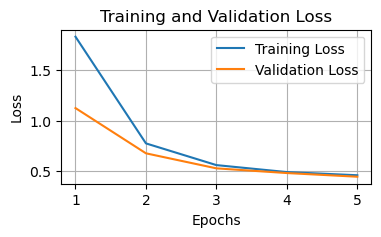

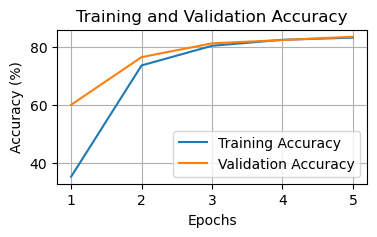

Test Accuracy: 83.31%

Training with batch size=128, learning rate=0.1, layers=3, neurons=128
Model Number 183 Performance:
  Training Loss: 0.6267
  Validation Loss: 0.6459
  Training Accuracy: 76.87%
  Validation Accuracy: 76.30%


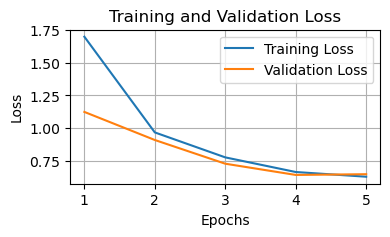

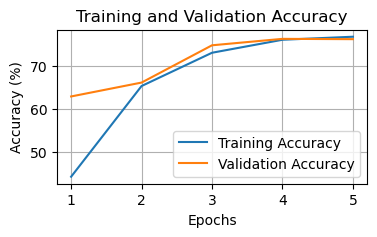

Test Accuracy: 77.25%

Training with batch size=128, learning rate=0.1, layers=3, neurons=256
Model Number 184 Performance:
  Training Loss: 0.6217
  Validation Loss: 0.6308
  Training Accuracy: 83.70%
  Validation Accuracy: 84.06%


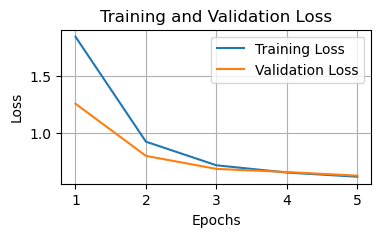

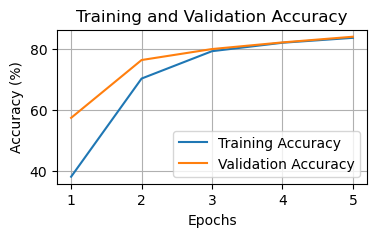

Test Accuracy: 84.07%

Training with batch size=128, learning rate=0.1, layers=4, neurons=32
Model Number 185 Performance:
  Training Loss: 0.8188
  Validation Loss: 0.7546
  Training Accuracy: 74.02%
  Validation Accuracy: 76.91%


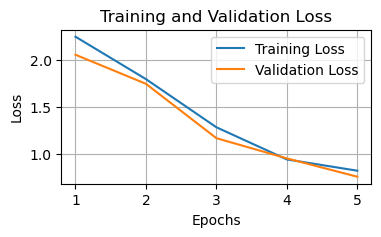

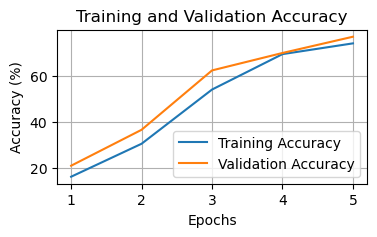

Test Accuracy: 77.19%

Training with batch size=128, learning rate=0.1, layers=4, neurons=64
Model Number 186 Performance:
  Training Loss: 1.4586
  Validation Loss: 1.4123
  Training Accuracy: 47.70%
  Validation Accuracy: 53.55%


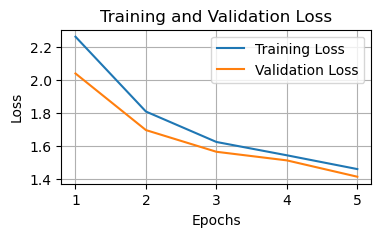

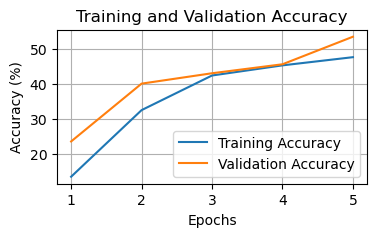

Test Accuracy: 53.24%

Training with batch size=128, learning rate=0.1, layers=4, neurons=128
Model Number 187 Performance:
  Training Loss: 1.3222
  Validation Loss: 1.1315
  Training Accuracy: 50.12%
  Validation Accuracy: 60.35%


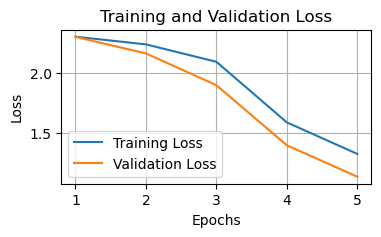

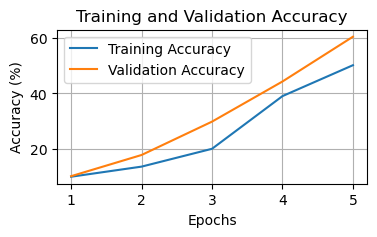

Test Accuracy: 60.78%

Training with batch size=128, learning rate=0.1, layers=4, neurons=256
Model Number 188 Performance:
  Training Loss: 0.3732
  Validation Loss: 0.3715
  Training Accuracy: 86.26%
  Validation Accuracy: 86.42%


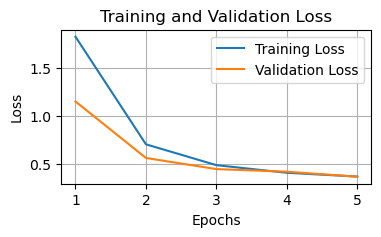

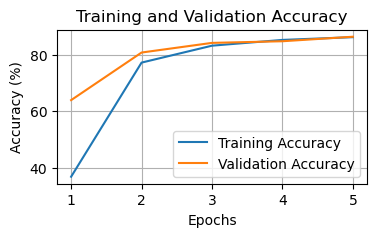

Test Accuracy: 86.15%

Training with batch size=128, learning rate=0.1, layers=5, neurons=32
Model Number 189 Performance:
  Training Loss: 0.8299
  Validation Loss: 0.7698
  Training Accuracy: 74.56%
  Validation Accuracy: 77.17%


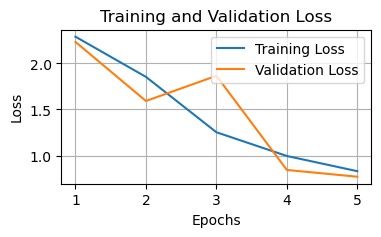

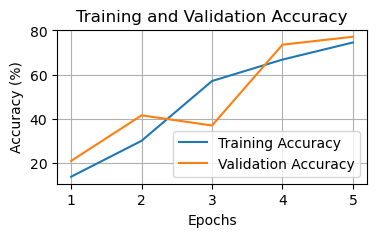

Test Accuracy: 77.45%

Training with batch size=128, learning rate=0.1, layers=5, neurons=64
Model Number 190 Performance:
  Training Loss: 0.6875
  Validation Loss: 0.6692
  Training Accuracy: 75.39%
  Validation Accuracy: 76.74%


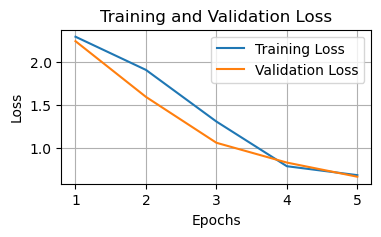

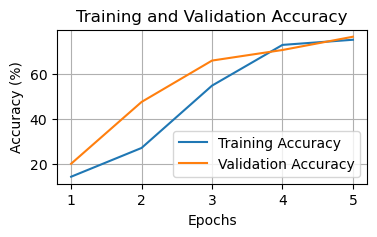

Test Accuracy: 77.09%

Training with batch size=128, learning rate=0.1, layers=5, neurons=128
Model Number 191 Performance:
  Training Loss: 0.6422
  Validation Loss: 0.6385
  Training Accuracy: 75.70%
  Validation Accuracy: 75.81%


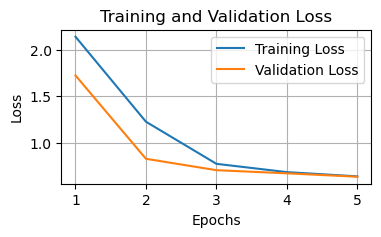

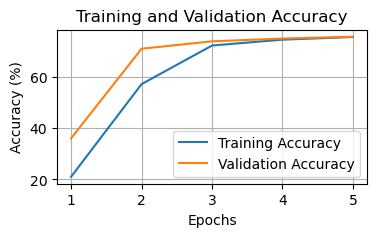

Test Accuracy: 76.26%

Training with batch size=128, learning rate=0.1, layers=5, neurons=256
Model Number 192 Performance:
  Training Loss: 1.5164
  Validation Loss: 1.2470
  Training Accuracy: 46.90%
  Validation Accuracy: 59.42%


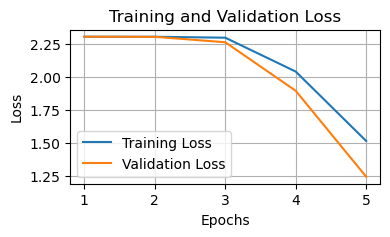

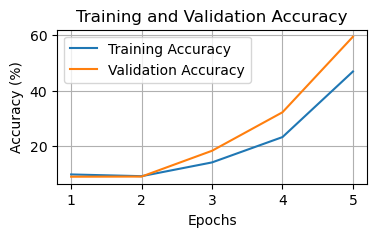

Test Accuracy: 59.63%

Training with batch size=256, learning rate=0.0001, layers=2, neurons=32
Model Number 193 Performance:
  Training Loss: 2.3008
  Validation Loss: 2.3008
  Training Accuracy: 11.46%
  Validation Accuracy: 12.14%


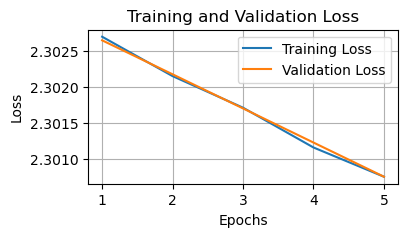

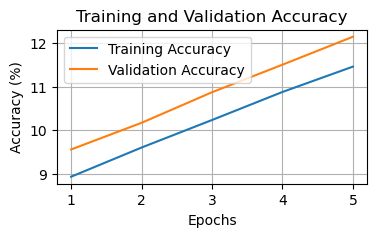

Test Accuracy: 11.87%

Training with batch size=256, learning rate=0.0001, layers=2, neurons=64
Model Number 194 Performance:
  Training Loss: 2.3035
  Validation Loss: 2.3035
  Training Accuracy: 9.75%
  Validation Accuracy: 9.75%


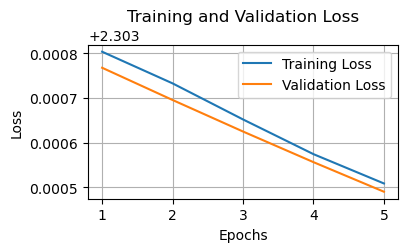

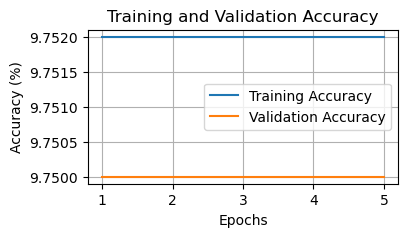

Test Accuracy: 9.74%

Training with batch size=256, learning rate=0.0001, layers=2, neurons=128
Model Number 195 Performance:
  Training Loss: 2.3033
  Validation Loss: 2.3032
  Training Accuracy: 9.80%
  Validation Accuracy: 9.99%


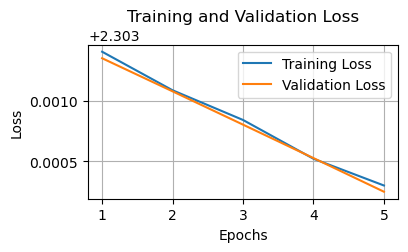

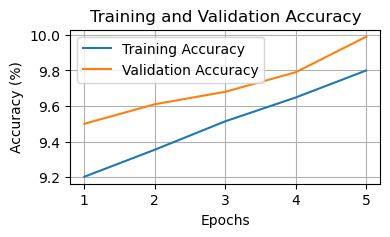

Test Accuracy: 9.67%

Training with batch size=256, learning rate=0.0001, layers=2, neurons=256
Model Number 196 Performance:
  Training Loss: 2.2988
  Validation Loss: 2.2986
  Training Accuracy: 12.77%
  Validation Accuracy: 12.69%


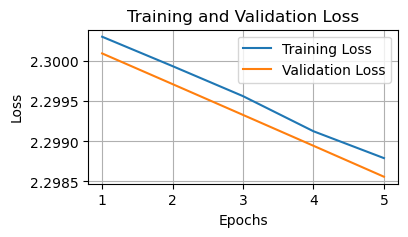

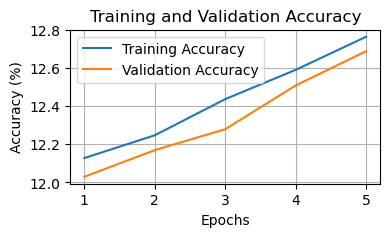

Test Accuracy: 13.11%

Training with batch size=256, learning rate=0.0001, layers=3, neurons=32
Model Number 197 Performance:
  Training Loss: 2.3047
  Validation Loss: 2.3053
  Training Accuracy: 10.44%
  Validation Accuracy: 10.44%


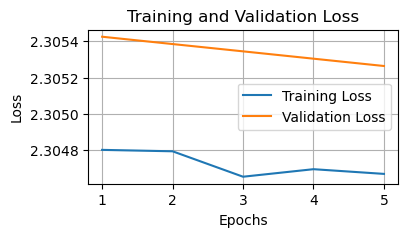

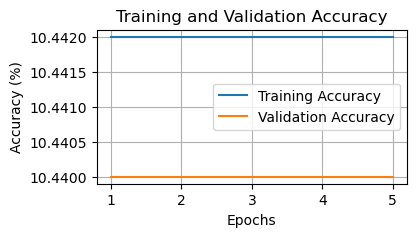

Test Accuracy: 10.28%

Training with batch size=256, learning rate=0.0001, layers=3, neurons=64
Model Number 198 Performance:
  Training Loss: 2.3058
  Validation Loss: 2.3057
  Training Accuracy: 9.04%
  Validation Accuracy: 9.03%


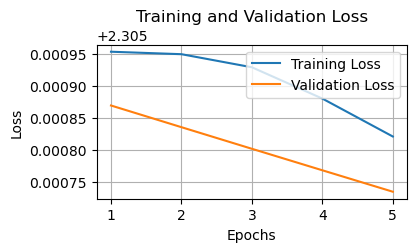

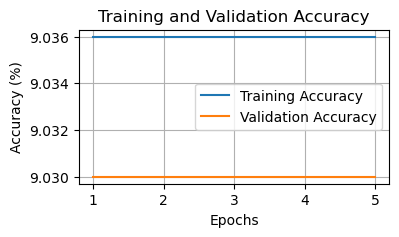

Test Accuracy: 8.92%

Training with batch size=256, learning rate=0.0001, layers=3, neurons=128
Model Number 199 Performance:
  Training Loss: 2.3074
  Validation Loss: 2.3074
  Training Accuracy: 9.04%
  Validation Accuracy: 9.03%


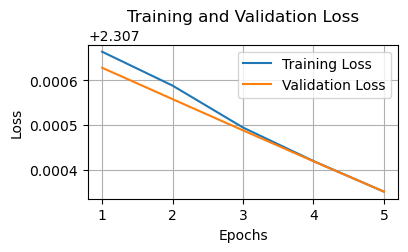

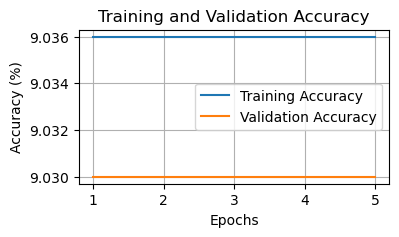

Test Accuracy: 8.92%

Training with batch size=256, learning rate=0.0001, layers=3, neurons=256
Model Number 200 Performance:
  Training Loss: 2.3012
  Validation Loss: 2.3014
  Training Accuracy: 8.17%
  Validation Accuracy: 8.52%


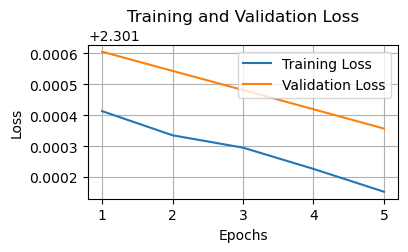

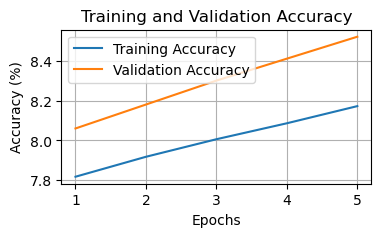

Test Accuracy: 7.88%

Training with batch size=256, learning rate=0.0001, layers=4, neurons=32
Model Number 201 Performance:
  Training Loss: 2.3073
  Validation Loss: 2.3072
  Training Accuracy: 9.91%
  Validation Accuracy: 9.92%


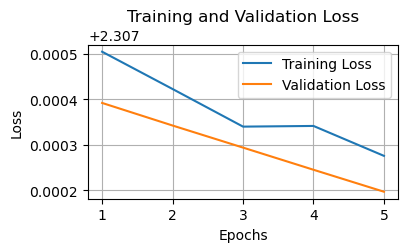

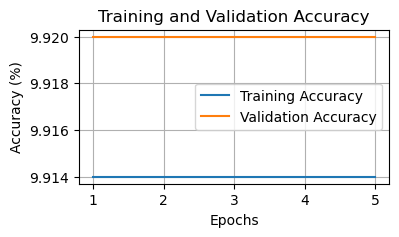

Test Accuracy: 10.09%

Training with batch size=256, learning rate=0.0001, layers=4, neurons=64
Model Number 202 Performance:
  Training Loss: 2.3041
  Validation Loss: 2.3047
  Training Accuracy: 10.44%
  Validation Accuracy: 10.44%


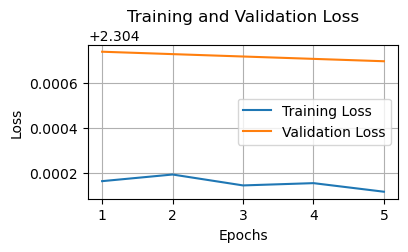

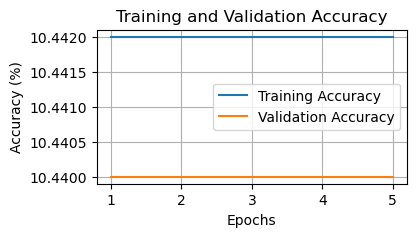

Test Accuracy: 10.28%

Training with batch size=256, learning rate=0.0001, layers=4, neurons=128
Model Number 203 Performance:
  Training Loss: 2.3035
  Validation Loss: 2.3038
  Training Accuracy: 9.75%
  Validation Accuracy: 9.75%


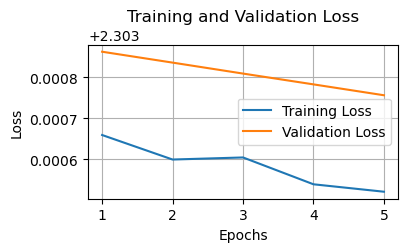

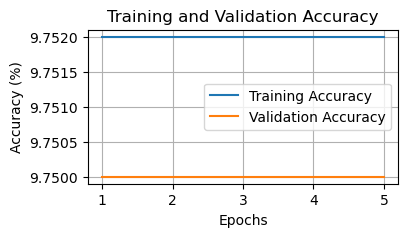

Test Accuracy: 9.74%

Training with batch size=256, learning rate=0.0001, layers=4, neurons=256
Model Number 204 Performance:
  Training Loss: 2.3034
  Validation Loss: 2.3035
  Training Accuracy: 9.93%
  Validation Accuracy: 9.95%


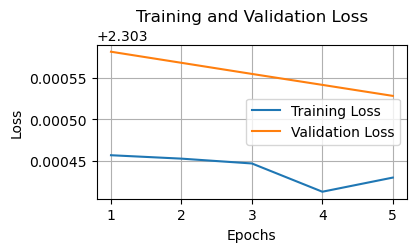

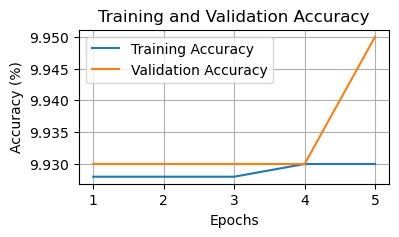

Test Accuracy: 10.32%

Training with batch size=256, learning rate=0.0001, layers=5, neurons=32
Model Number 205 Performance:
  Training Loss: 2.3074
  Validation Loss: 2.3081
  Training Accuracy: 9.04%
  Validation Accuracy: 9.03%


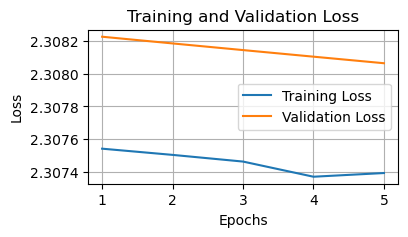

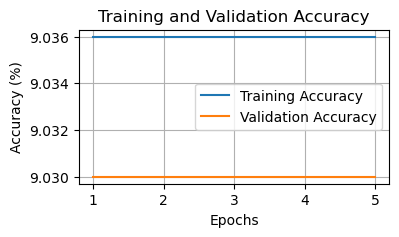

Test Accuracy: 8.92%

Training with batch size=256, learning rate=0.0001, layers=5, neurons=64
Model Number 206 Performance:
  Training Loss: 2.3113
  Validation Loss: 2.3109
  Training Accuracy: 9.74%
  Validation Accuracy: 9.74%


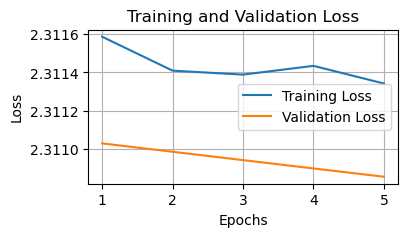

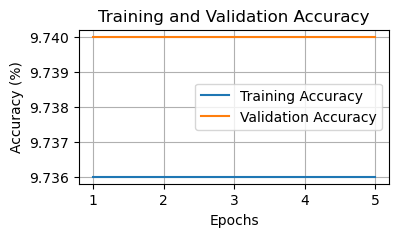

Test Accuracy: 9.82%

Training with batch size=256, learning rate=0.0001, layers=5, neurons=128
Model Number 207 Performance:
  Training Loss: 2.3063
  Validation Loss: 2.3059
  Training Accuracy: 9.04%
  Validation Accuracy: 9.04%


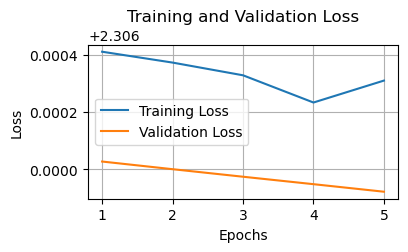

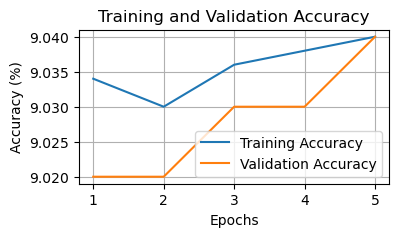

Test Accuracy: 8.90%

Training with batch size=256, learning rate=0.0001, layers=5, neurons=256
Model Number 208 Performance:
  Training Loss: 2.3020
  Validation Loss: 2.3024
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


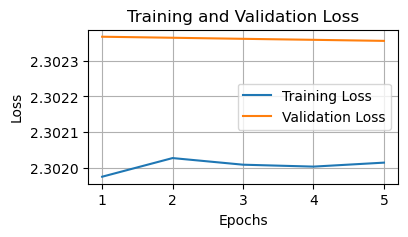

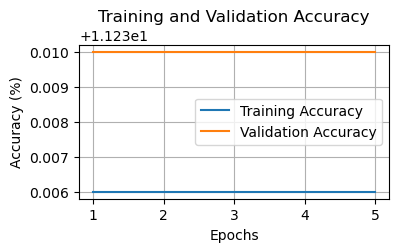

Test Accuracy: 11.35%

Training with batch size=256, learning rate=0.001, layers=2, neurons=32
Model Number 209 Performance:
  Training Loss: 2.2824
  Validation Loss: 2.2797
  Training Accuracy: 27.17%
  Validation Accuracy: 28.29%


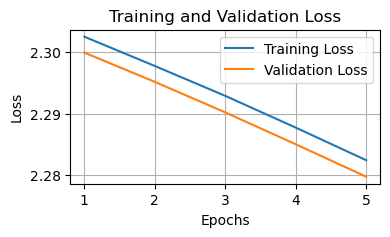

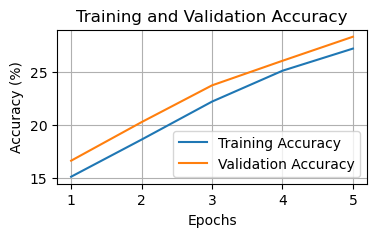

Test Accuracy: 28.13%

Training with batch size=256, learning rate=0.001, layers=2, neurons=64
Model Number 210 Performance:
  Training Loss: 2.2888
  Validation Loss: 2.2870
  Training Accuracy: 20.08%
  Validation Accuracy: 21.06%


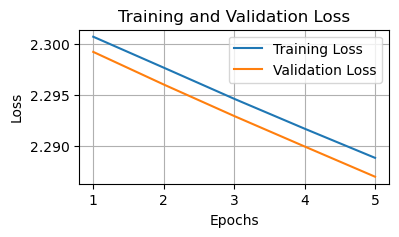

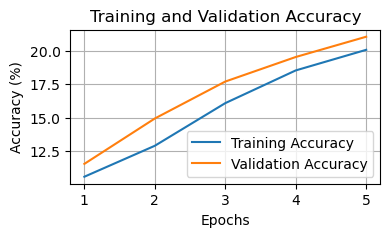

Test Accuracy: 20.79%

Training with batch size=256, learning rate=0.001, layers=2, neurons=128
Model Number 211 Performance:
  Training Loss: 2.2893
  Validation Loss: 2.2878
  Training Accuracy: 20.83%
  Validation Accuracy: 21.52%


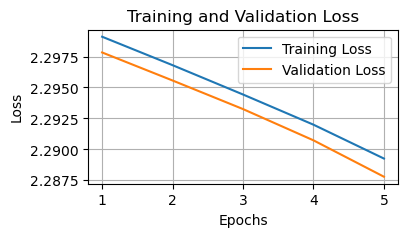

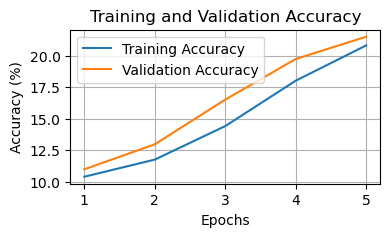

Test Accuracy: 21.98%

Training with batch size=256, learning rate=0.001, layers=2, neurons=256
Model Number 212 Performance:
  Training Loss: 2.2803
  Validation Loss: 2.2781
  Training Accuracy: 22.27%
  Validation Accuracy: 24.61%


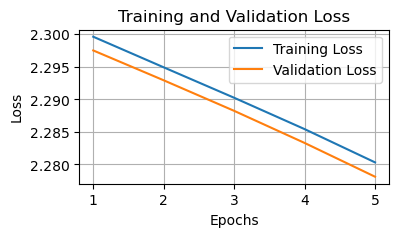

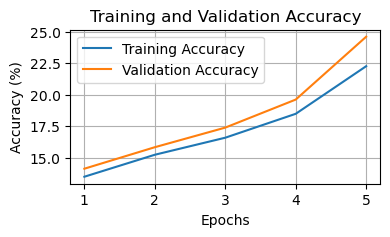

Test Accuracy: 24.93%

Training with batch size=256, learning rate=0.001, layers=3, neurons=32
Model Number 213 Performance:
  Training Loss: 2.3014
  Validation Loss: 2.3019
  Training Accuracy: 10.44%
  Validation Accuracy: 10.44%


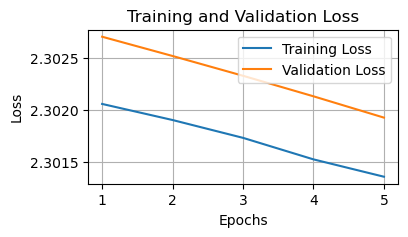

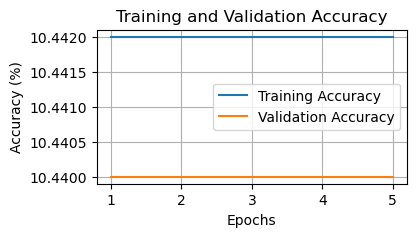

Test Accuracy: 10.28%

Training with batch size=256, learning rate=0.001, layers=3, neurons=64
Model Number 214 Performance:
  Training Loss: 2.2974
  Validation Loss: 2.2973
  Training Accuracy: 12.43%
  Validation Accuracy: 12.46%


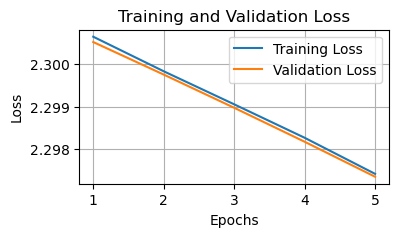

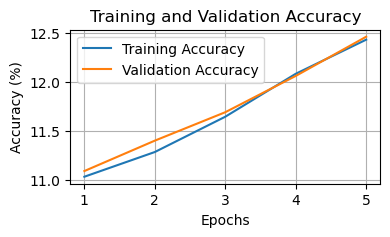

Test Accuracy: 13.23%

Training with batch size=256, learning rate=0.001, layers=3, neurons=128
Model Number 215 Performance:
  Training Loss: 2.3013
  Validation Loss: 2.3011
  Training Accuracy: 10.44%
  Validation Accuracy: 10.44%


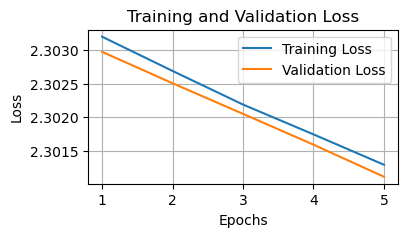

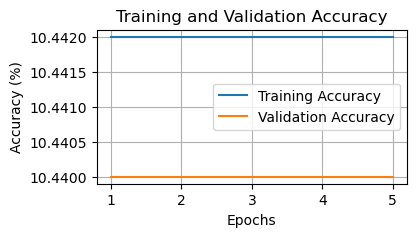

Test Accuracy: 10.28%

Training with batch size=256, learning rate=0.001, layers=3, neurons=256
Model Number 216 Performance:
  Training Loss: 2.3006
  Validation Loss: 2.3000
  Training Accuracy: 16.01%
  Validation Accuracy: 16.90%


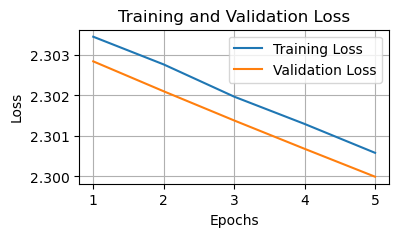

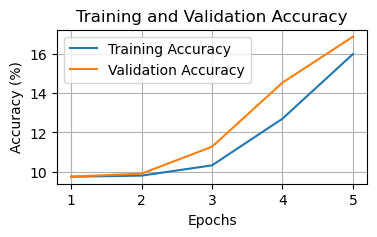

Test Accuracy: 17.05%

Training with batch size=256, learning rate=0.001, layers=4, neurons=32
Model Number 217 Performance:
  Training Loss: 2.3118
  Validation Loss: 2.3116
  Training Accuracy: 9.75%
  Validation Accuracy: 9.75%


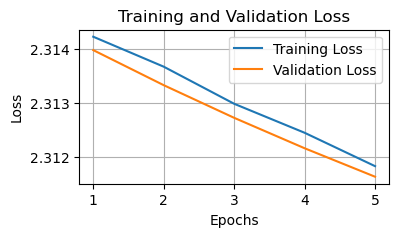

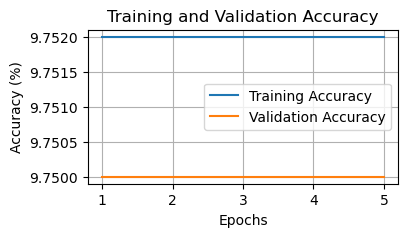

Test Accuracy: 9.74%

Training with batch size=256, learning rate=0.001, layers=4, neurons=64
Model Number 218 Performance:
  Training Loss: 2.3088
  Validation Loss: 2.3084
  Training Accuracy: 9.91%
  Validation Accuracy: 9.92%


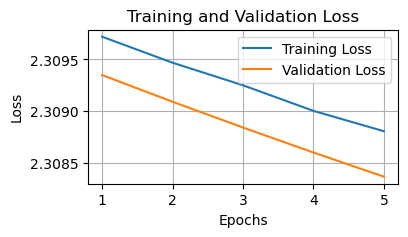

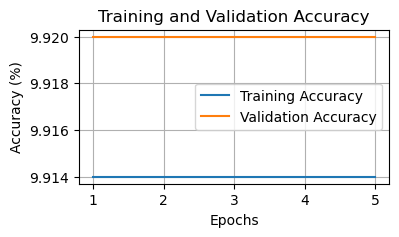

Test Accuracy: 10.09%

Training with batch size=256, learning rate=0.001, layers=4, neurons=128
Model Number 219 Performance:
  Training Loss: 2.3038
  Validation Loss: 2.3038
  Training Accuracy: 9.04%
  Validation Accuracy: 9.03%


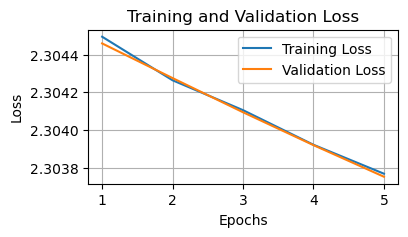

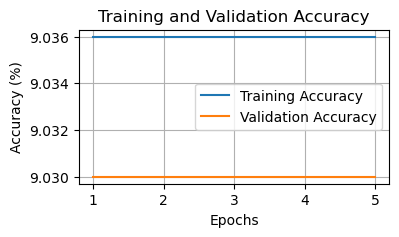

Test Accuracy: 8.92%

Training with batch size=256, learning rate=0.001, layers=4, neurons=256
Model Number 220 Performance:
  Training Loss: 2.3022
  Validation Loss: 2.3023
  Training Accuracy: 9.75%
  Validation Accuracy: 9.75%


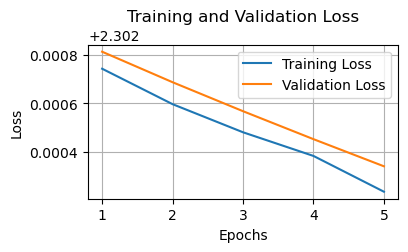

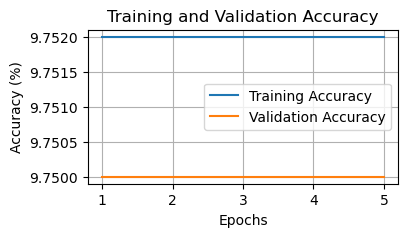

Test Accuracy: 9.74%

Training with batch size=256, learning rate=0.001, layers=5, neurons=32
Model Number 221 Performance:
  Training Loss: 2.3085
  Validation Loss: 2.3080
  Training Accuracy: 9.87%
  Validation Accuracy: 9.87%


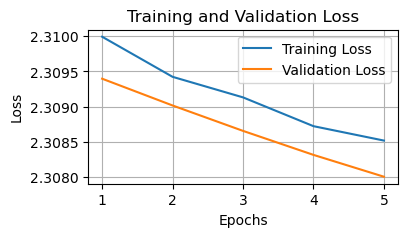

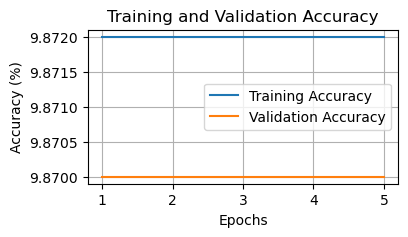

Test Accuracy: 9.80%

Training with batch size=256, learning rate=0.001, layers=5, neurons=64
Model Number 222 Performance:
  Training Loss: 2.3032
  Validation Loss: 2.3032
  Training Accuracy: 10.22%
  Validation Accuracy: 10.22%


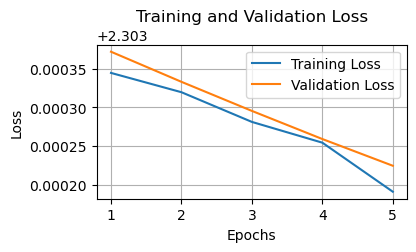

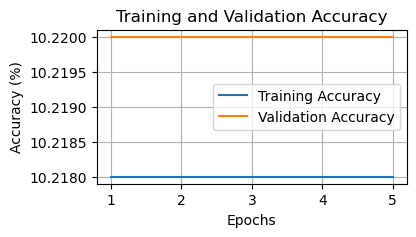

Test Accuracy: 10.10%

Training with batch size=256, learning rate=0.001, layers=5, neurons=128
Model Number 223 Performance:
  Training Loss: 2.3038
  Validation Loss: 2.3037
  Training Accuracy: 9.75%
  Validation Accuracy: 9.75%


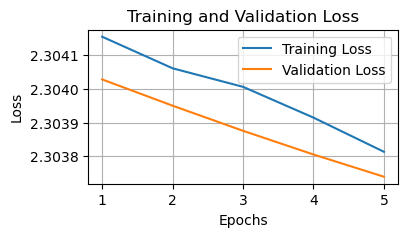

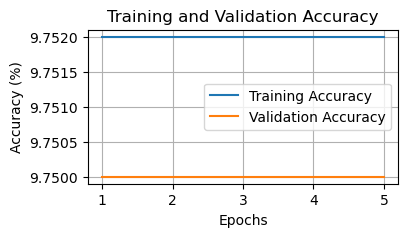

Test Accuracy: 9.74%

Training with batch size=256, learning rate=0.001, layers=5, neurons=256
Model Number 224 Performance:
  Training Loss: 2.3029
  Validation Loss: 2.3027
  Training Accuracy: 9.74%
  Validation Accuracy: 9.74%


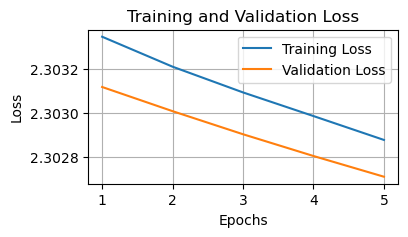

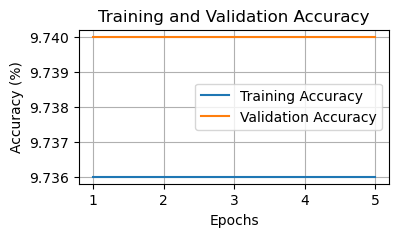

Test Accuracy: 9.82%

Training with batch size=256, learning rate=0.01, layers=2, neurons=32
Model Number 225 Performance:
  Training Loss: 1.9358
  Validation Loss: 1.8545
  Training Accuracy: 32.22%
  Validation Accuracy: 38.12%


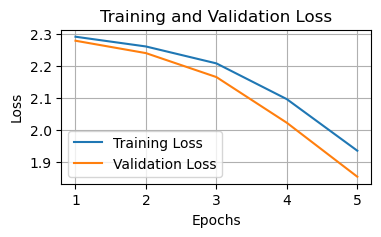

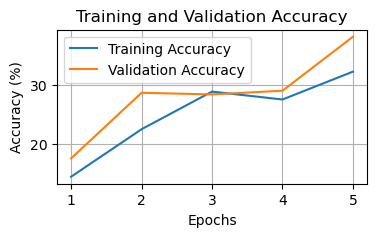

Test Accuracy: 39.21%

Training with batch size=256, learning rate=0.01, layers=2, neurons=64
Model Number 226 Performance:
  Training Loss: 1.7508
  Validation Loss: 1.6105
  Training Accuracy: 48.31%
  Validation Accuracy: 53.37%


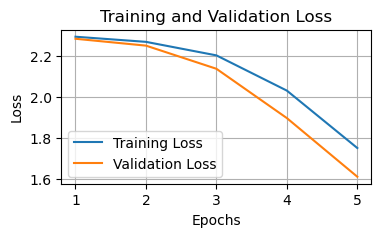

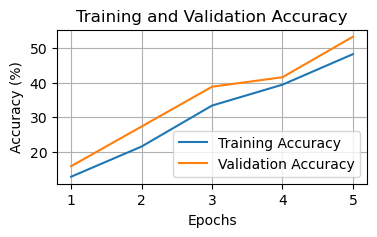

Test Accuracy: 53.28%

Training with batch size=256, learning rate=0.01, layers=2, neurons=128
Model Number 227 Performance:
  Training Loss: 1.8607
  Validation Loss: 1.7472
  Training Accuracy: 45.41%
  Validation Accuracy: 56.08%


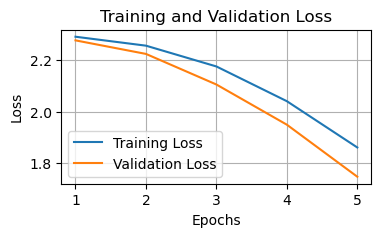

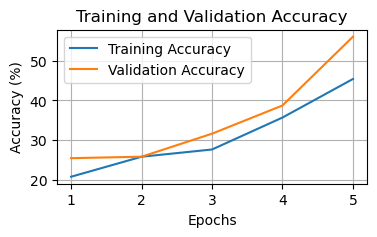

Test Accuracy: 56.69%

Training with batch size=256, learning rate=0.01, layers=2, neurons=256
Model Number 228 Performance:
  Training Loss: 1.1441
  Validation Loss: 1.0278
  Training Accuracy: 71.27%
  Validation Accuracy: 74.23%


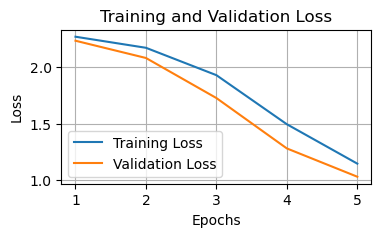

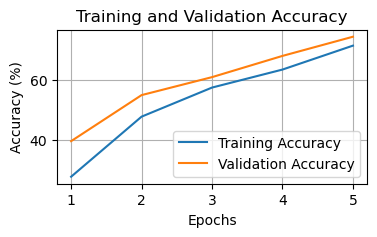

Test Accuracy: 74.71%

Training with batch size=256, learning rate=0.01, layers=3, neurons=32
Model Number 229 Performance:
  Training Loss: 2.2317
  Validation Loss: 2.2077
  Training Accuracy: 35.37%
  Validation Accuracy: 36.97%


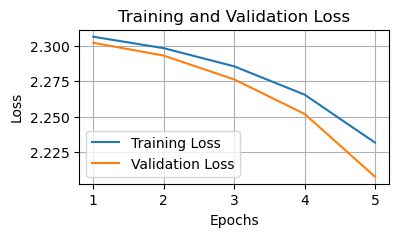

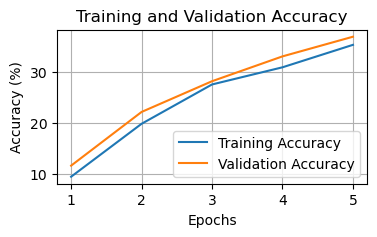

Test Accuracy: 36.68%

Training with batch size=256, learning rate=0.01, layers=3, neurons=64
Model Number 230 Performance:
  Training Loss: 2.2203
  Validation Loss: 2.1924
  Training Accuracy: 26.39%
  Validation Accuracy: 25.63%


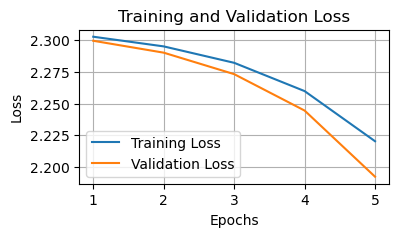

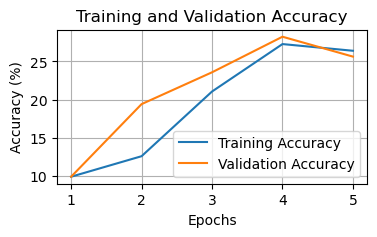

Test Accuracy: 25.61%

Training with batch size=256, learning rate=0.01, layers=3, neurons=128
Model Number 231 Performance:
  Training Loss: 2.2607
  Validation Loss: 2.2449
  Training Accuracy: 27.97%
  Validation Accuracy: 28.23%


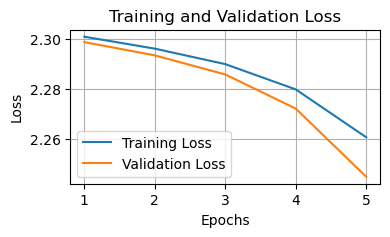

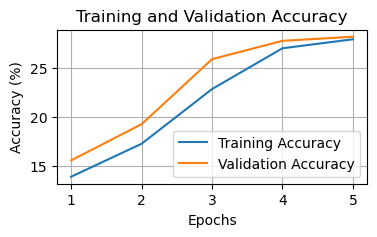

Test Accuracy: 28.33%

Training with batch size=256, learning rate=0.01, layers=3, neurons=256
Model Number 232 Performance:
  Training Loss: 2.2073
  Validation Loss: 2.1643
  Training Accuracy: 44.64%
  Validation Accuracy: 43.85%


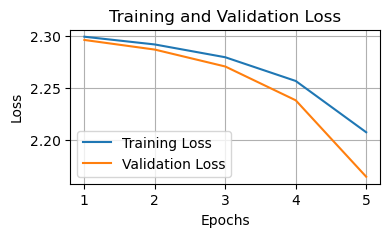

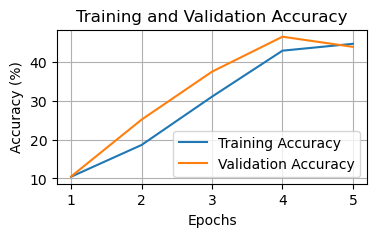

Test Accuracy: 44.46%

Training with batch size=256, learning rate=0.01, layers=4, neurons=32
Model Number 233 Performance:
  Training Loss: 2.3044
  Validation Loss: 2.3037
  Training Accuracy: 9.74%
  Validation Accuracy: 9.82%


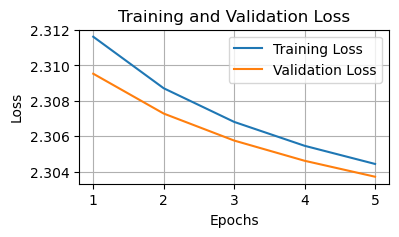

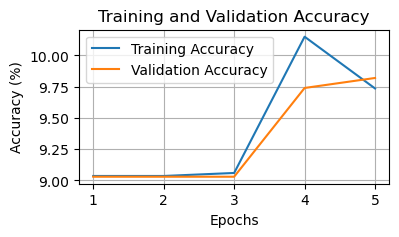

Test Accuracy: 9.88%

Training with batch size=256, learning rate=0.01, layers=4, neurons=64
Model Number 234 Performance:
  Training Loss: 2.3010
  Validation Loss: 2.3000
  Training Accuracy: 9.86%
  Validation Accuracy: 10.07%


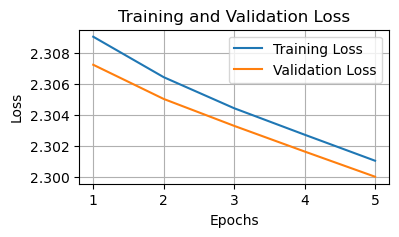

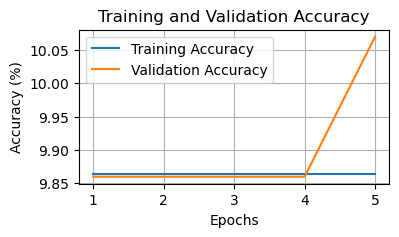

Test Accuracy: 9.79%

Training with batch size=256, learning rate=0.01, layers=4, neurons=128
Model Number 235 Performance:
  Training Loss: 2.2972
  Validation Loss: 2.2960
  Training Accuracy: 19.16%
  Validation Accuracy: 19.35%


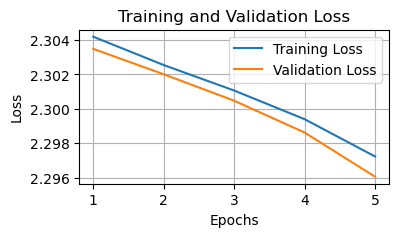

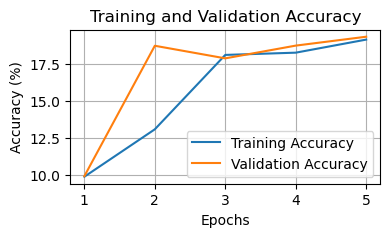

Test Accuracy: 19.20%

Training with batch size=256, learning rate=0.01, layers=4, neurons=256
Model Number 236 Performance:
  Training Loss: 2.2927
  Validation Loss: 2.2909
  Training Accuracy: 11.57%
  Validation Accuracy: 12.01%


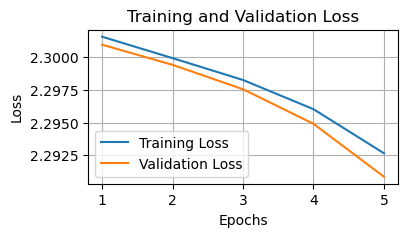

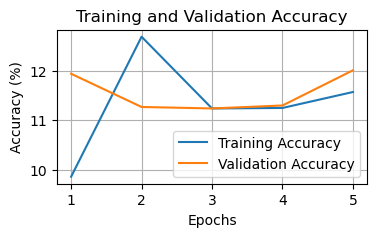

Test Accuracy: 12.35%

Training with batch size=256, learning rate=0.01, layers=5, neurons=32
Model Number 237 Performance:
  Training Loss: 2.2884
  Validation Loss: 2.2840
  Training Accuracy: 13.35%
  Validation Accuracy: 15.72%


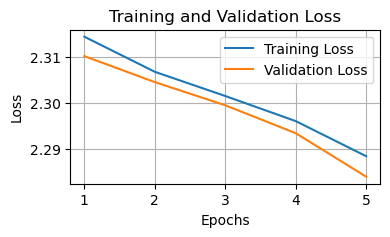

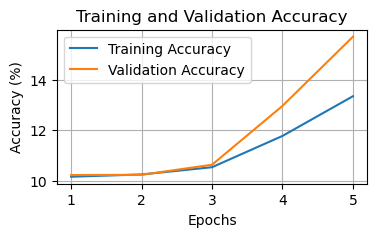

Test Accuracy: 16.25%

Training with batch size=256, learning rate=0.01, layers=5, neurons=64
Model Number 238 Performance:
  Training Loss: 2.3022
  Validation Loss: 2.3022
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


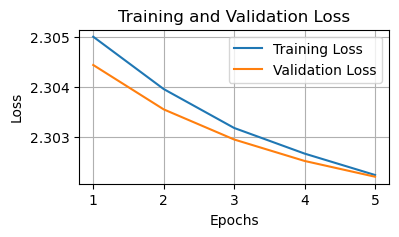

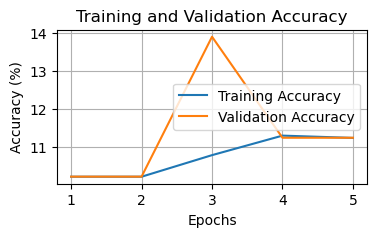

Test Accuracy: 11.35%

Training with batch size=256, learning rate=0.01, layers=5, neurons=128
Model Number 239 Performance:
  Training Loss: 2.3017
  Validation Loss: 2.3018
  Training Accuracy: 11.24%
  Validation Accuracy: 11.24%


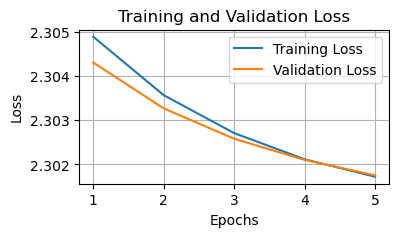

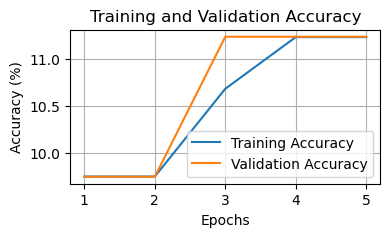

Test Accuracy: 11.35%

Training with batch size=256, learning rate=0.01, layers=5, neurons=256
Model Number 240 Performance:
  Training Loss: 2.3013
  Validation Loss: 2.3010
  Training Accuracy: 10.22%
  Validation Accuracy: 10.22%


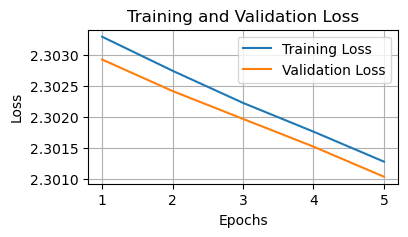

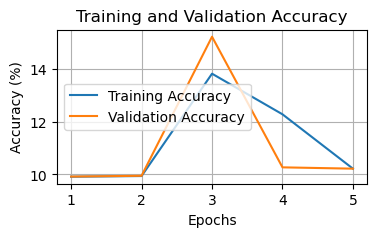

Test Accuracy: 10.10%

Training with batch size=256, learning rate=0.1, layers=2, neurons=32
Model Number 241 Performance:
  Training Loss: 0.8209
  Validation Loss: 0.7849
  Training Accuracy: 70.81%
  Validation Accuracy: 71.34%


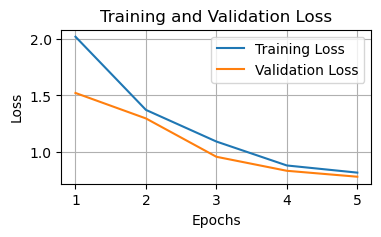

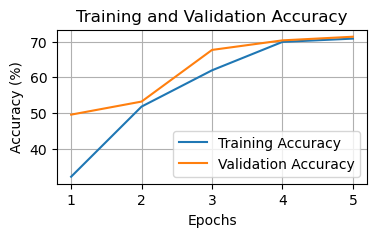

Test Accuracy: 71.55%

Training with batch size=256, learning rate=0.1, layers=2, neurons=64
Model Number 242 Performance:
  Training Loss: 0.8967
  Validation Loss: 0.9149
  Training Accuracy: 66.93%
  Validation Accuracy: 66.26%


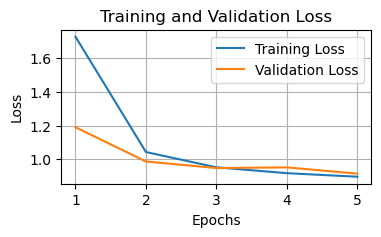

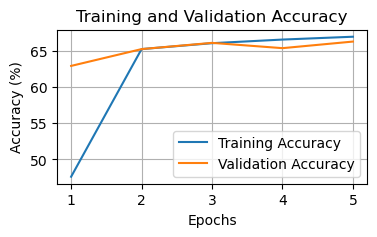

Test Accuracy: 67.06%

Training with batch size=256, learning rate=0.1, layers=2, neurons=128
Model Number 243 Performance:
  Training Loss: 0.7124
  Validation Loss: 0.7265
  Training Accuracy: 73.59%
  Validation Accuracy: 72.69%


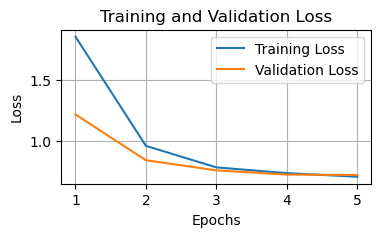

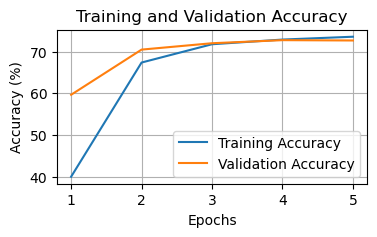

Test Accuracy: 72.31%

Training with batch size=256, learning rate=0.1, layers=2, neurons=256
Model Number 244 Performance:
  Training Loss: 0.2302
  Validation Loss: 0.2279
  Training Accuracy: 93.34%
  Validation Accuracy: 93.37%


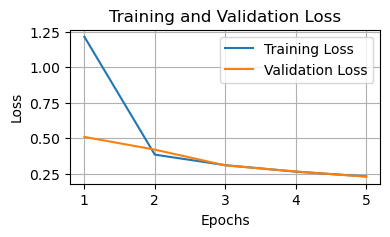

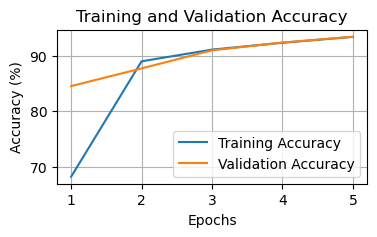

Test Accuracy: 93.57%

Training with batch size=256, learning rate=0.1, layers=3, neurons=32
Model Number 245 Performance:
  Training Loss: 0.4131
  Validation Loss: 0.4970
  Training Accuracy: 87.65%
  Validation Accuracy: 84.56%


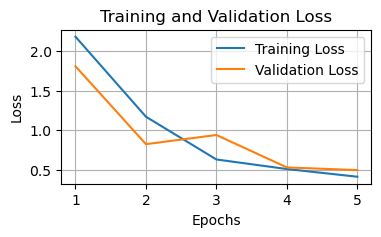

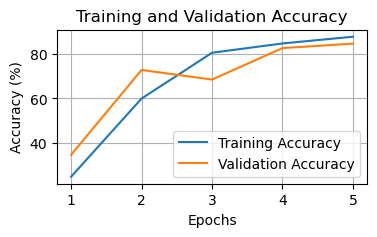

Test Accuracy: 84.37%

Training with batch size=256, learning rate=0.1, layers=3, neurons=64
Model Number 246 Performance:
  Training Loss: 0.2673
  Validation Loss: 0.2554
  Training Accuracy: 92.12%
  Validation Accuracy: 92.30%


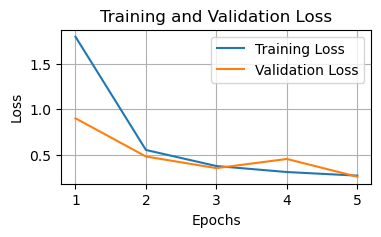

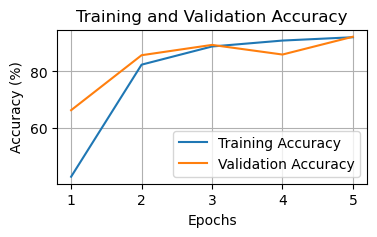

Test Accuracy: 92.28%

Training with batch size=256, learning rate=0.1, layers=3, neurons=128
Model Number 247 Performance:
  Training Loss: 0.7543
  Validation Loss: 0.7416
  Training Accuracy: 73.72%
  Validation Accuracy: 73.92%


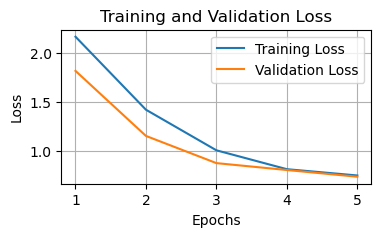

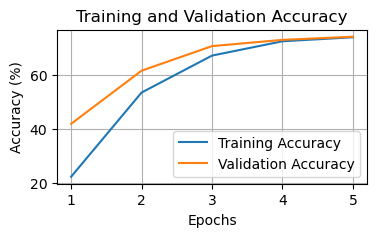

Test Accuracy: 74.79%

Training with batch size=256, learning rate=0.1, layers=3, neurons=256
Model Number 248 Performance:
  Training Loss: 0.6700
  Validation Loss: 0.6771
  Training Accuracy: 76.62%
  Validation Accuracy: 76.24%


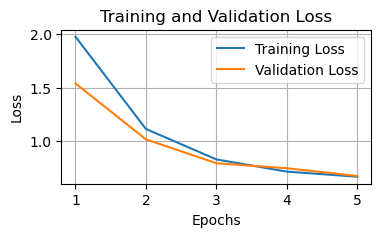

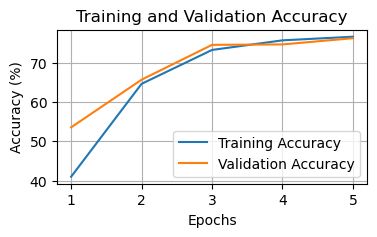

Test Accuracy: 76.37%

Training with batch size=256, learning rate=0.1, layers=4, neurons=32
Model Number 249 Performance:
  Training Loss: 1.2550
  Validation Loss: 1.0432
  Training Accuracy: 57.10%
  Validation Accuracy: 60.69%


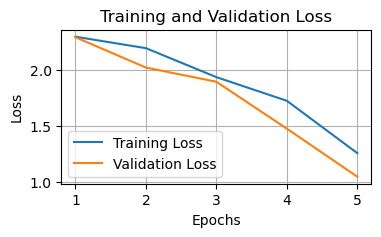

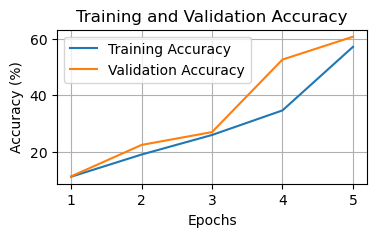

Test Accuracy: 60.15%

Training with batch size=256, learning rate=0.1, layers=4, neurons=64
Model Number 250 Performance:
  Training Loss: 0.4667
  Validation Loss: 0.3990
  Training Accuracy: 86.05%
  Validation Accuracy: 88.39%


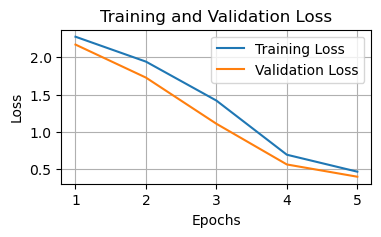

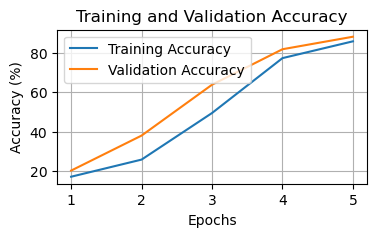

Test Accuracy: 88.76%

Training with batch size=256, learning rate=0.1, layers=4, neurons=128
Model Number 251 Performance:
  Training Loss: 0.5927
  Validation Loss: 0.5652
  Training Accuracy: 80.83%
  Validation Accuracy: 82.11%


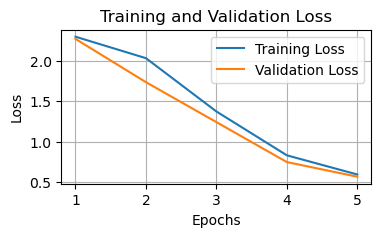

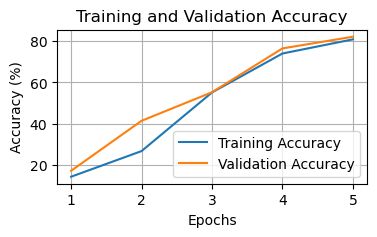

Test Accuracy: 81.89%

Training with batch size=256, learning rate=0.1, layers=4, neurons=256
Model Number 252 Performance:
  Training Loss: 0.8561
  Validation Loss: 0.7955
  Training Accuracy: 71.28%
  Validation Accuracy: 72.16%


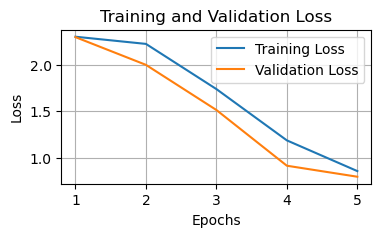

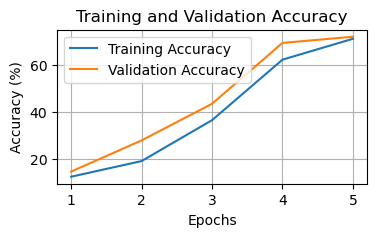

Test Accuracy: 73.07%

Training with batch size=256, learning rate=0.1, layers=5, neurons=32
Model Number 253 Performance:
  Training Loss: 2.1641
  Validation Loss: 2.1441
  Training Accuracy: 19.10%
  Validation Accuracy: 18.68%


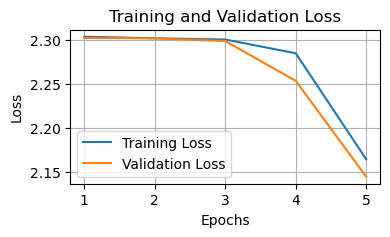

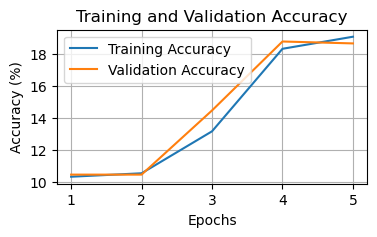

Test Accuracy: 18.93%

Training with batch size=256, learning rate=0.1, layers=5, neurons=64
Model Number 254 Performance:
  Training Loss: 1.5610
  Validation Loss: 1.3848
  Training Accuracy: 46.41%
  Validation Accuracy: 52.67%


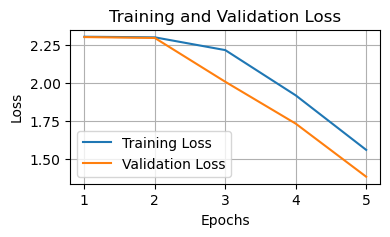

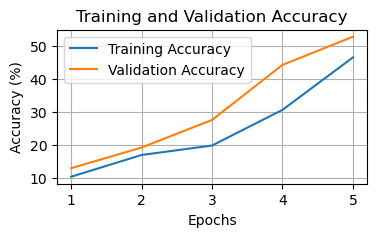

Test Accuracy: 53.22%

Training with batch size=256, learning rate=0.1, layers=5, neurons=128
Model Number 255 Performance:
  Training Loss: 1.8847
  Validation Loss: 1.7165
  Training Accuracy: 29.13%
  Validation Accuracy: 35.47%


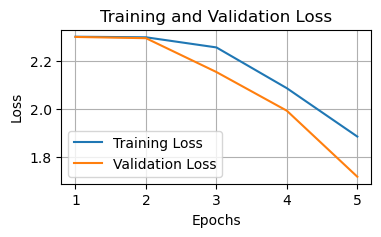

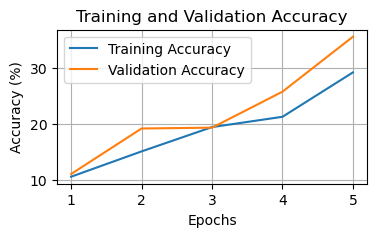

Test Accuracy: 35.38%

Training with batch size=256, learning rate=0.1, layers=5, neurons=256
Model Number 256 Performance:
  Training Loss: 1.7216
  Validation Loss: 1.6884
  Training Accuracy: 29.50%
  Validation Accuracy: 29.86%


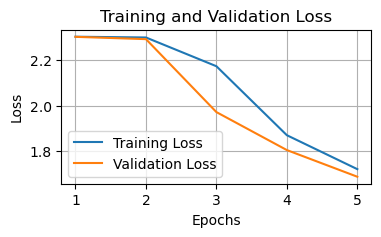

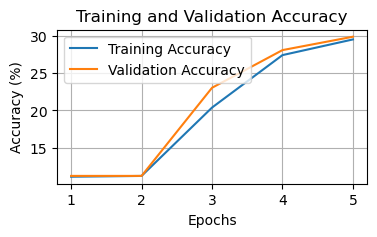

Test Accuracy: 30.55%



In [5]:
# Define batch sizes and learning rates to experiment with
batch_size_list = [32, 64, 128, 256]
learning_rate_list = [0.0001, 0.001, 0.01, 0.1]

# Experiment with number of layers and neurons
layers_list = [2, 3, 4, 5]
neurons_list = [32, 64, 128, 256]

# Experiment loop
best_model = None
best_accuracy = 0
best_batch_size = 0
best_learning_rate = 0

device = torch.device("cpu")
model_num = 0
for batch_size in batch_size_list:
    for lr in learning_rate_list:
        for layers in layers_list:
            for neurons in neurons_list:
                model_num += 1
                print(f"Training with batch size={batch_size}, learning rate={lr}, layers={layers}, neurons={neurons}")
                # Initialize lists to store metrics
                training_losses = []
                validation_losses = []
                training_accuracies = []
                validation_accuracies = []
    
                # Create DataLoader with current batch size
                train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
                val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
                test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
                # Initialize the model
                model = FeedForwardNN(num_layers=layers, total_number_of_neurons=neurons)
                model = model.to(device)
                criterion = nn.CrossEntropyLoss()  # Loss function
                optimizer = optim.SGD(model.parameters(), lr=lr)  # Stochastic Gradient Descent
    
                # Training loop
                epochs = 5
                for epoch in range(epochs):
                    model.train()  # Set the model to training mode
                    train_loss = 0.0
                    correct_train = 0
                    total_train = 0
    
                    for images, labels in train_loader:
                        labels = labels.to(device)
                        images = images.view(-1, 28 * 28).to(device)  # Flatten the input for feedforward NN
                        optimizer.zero_grad()  # Zero the gradients
                        outputs = model(images)  # Forward pass
                        loss = criterion(outputs, labels)  # Compute loss
                        loss.backward()  # Backward pass
                        optimizer.step()  # Update weights
                        train_loss += loss.item()
    
                        # Track training accuracy
                        _, predicted = torch.max(outputs, 1)
                        correct_train += (predicted == labels).sum().item()
                        total_train += labels.size(0)
    
                    # Validation loop
                    model.eval()  # Set the model to evaluation mode
                    val_loss = 0.0
                    correct_val = 0
                    total_val = 0
                    with torch.no_grad():
                        for images, labels in val_loader:
                            labels = labels.to(device)
                            images = images.view(-1, 28 * 28).to(device)  # Flatten the input
                            outputs = model(images)
                            loss = criterion(outputs, labels)
                            val_loss += loss.item()
    
                            # Track validation accuracy
                            _, predicted = torch.max(outputs, 1)
                            correct_val += (predicted == labels).sum().item()
                            total_val += labels.size(0)
    
                    # Calculate and store metrics
                    training_losses.append(train_loss / len(train_loader))
                    validation_losses.append(val_loss / len(val_loader))
                    training_accuracies.append(100 * correct_train / total_train)
                    validation_accuracies.append(100 * correct_val / total_val)
    
                # Print statistics at end of training
                print(f"Model Number {model_num} Performance:")
                print(f"  Training Loss: {training_losses[-1]:.4f}")
                print(f"  Validation Loss: {validation_losses[-1]:.4f}")
                print(f"  Training Accuracy: {training_accuracies[-1]:.2f}%")
                print(f"  Validation Accuracy: {validation_accuracies[-1]:.2f}%")
                # Plot the performance
                plot_performance((4,2), training_losses, validation_losses, training_accuracies, validation_accuracies)


                # Evaluate the model on the test set after training
                model.eval()
                test_loss = 0.0
                correct = 0
                total = 0
                with torch.no_grad():
                    for images, labels in test_loader:
                        labels = labels.to(device)
                        images = images.view(-1, 28 * 28).to(device)  # Flatten the input
                        outputs = model(images)
                        loss = criterion(outputs, labels)
                        test_loss += loss.item()
                        _, predicted = torch.max(outputs, 1)
                        correct += (predicted == labels).sum().item()
                        total += labels.size(0)
    
                test_accuracy = 100 * correct / total
                print(f"Test Accuracy: {test_accuracy:.2f}%\n")
    
                # Save the best model based on test accuracy
                if test_accuracy > best_accuracy:
                    print("New Best Model!\n")
                    best_accuracy = test_accuracy
                    best_model = model
                    best_batch_size = batch_size
                    best_learning_rate = lr



# Evaluation
The model with best accuracy is then chosen. We will print its charactersitcs and show the confusion matrix

Best Test Accuracy: 96.59%
Model Characterstics:
Number of layers: 4
Number of Neurons: 256
Batch Size: 32
Learning Rate: 0.1
Actual labels count: {0: 980, 1: 1135, 2: 1032, 3: 1010, 4: 982, 5: 892, 6: 958, 7: 1028, 8: 974, 9: 1009}
Predicted labels count: {0: 979, 1: 1166, 2: 990, 3: 1032, 4: 957, 5: 891, 6: 944, 7: 1043, 8: 1027, 9: 971}


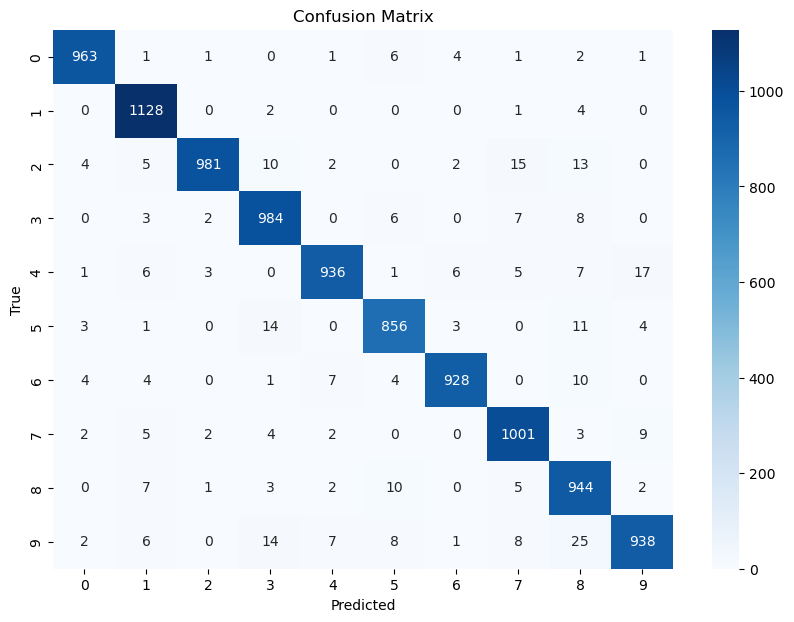

In [6]:
# Final test evaluation on the best model
print(f"Best Test Accuracy: {best_accuracy:.2f}%")
print("Model Characterstics:")
print(f"Number of layers: {best_model.number_of_layers}")
print(f"Number of Neurons: {best_model.total_number_of_neurons}")
print(f"Batch Size: {best_batch_size}")
print(f"Learning Rate: {best_learning_rate}")
all_labels = []
all_preds = []

with torch.no_grad():
    for images, labels in DataLoader(test_dataset, batch_size=best_batch_size):
        images = images.view(-1, 28 * 28).to(device)
        outputs = best_model(images)
        _, predicted = torch.max(outputs, 1)
        all_labels.extend(labels.numpy())
        all_preds.extend(predicted.numpy())
cm = confusion_matrix(all_labels, all_preds)
d = Counter(all_labels)
d2 = Counter(all_preds)
print(f"Actual labels count: {dict(sorted(d.items()))}")
print(f"Predicted labels count: {dict(sorted(d2.items()))}")
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[str(i) for i in range(10)],
            yticklabels=[str(i) for i in range(10)])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()



# Analysis
Let's explore the effect of each hyper parameter as it changes:
### Batch Size
The batch size represents the number of samples that are processed before updating the weights.  
A smaller batch size means that the weights are updated much more per epoch compared to a larger batch size. This means that the data seen per update is more diverse and therefore is better for generalization. However, the updates are noiser in comparison because noise evens out in a large batch of data compared to small batch. Bigger batch sizes are also more computationally efficent when using hardware accelerators such as GPUs.
### Learning Rate
The learning rate controls the amount the weights change per update. A small learning rate should converge but will take longer training. A large learning rate is less precise and is susceptible to diverging. A perfect learning rate will find the optimal weights at smaller number of epochs while being precise and not oscillating.
### Number of neurons and Number of layers
Both of these determine the complexity of the model and therefore, its ability to understand complex patterns in the data (deeper learning). Too small will lead to underfitting (inability to detect the intricate relationships inside the data) while too large will lead to overfitting (memorising the training data with its noise). 

## Our Training Models
Models with lower learning rate (0.0001, 0.001) almost exclusively bad. The combination of stochastic gradient descent resulting in low accuracy initial updates and small number of epochs meant that these models didn't have enough training time to improve.  
The best models had the highest available learning rate of (0.1).  
High layer count of (5) led to poorer performance, layer counts of (2, 3, 4) performed better.
At low layer count (2, 3), increasing the number of neurons led to better performance.
At high layer count (4), a middle ground of number of neurons (64, 128) seemed to be best.
Batch size did not result in clear differences.

